In [356]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [357]:
final_consumptionDf = pd.read_csv('final_consumption.csv')
Gross_demandDf = pd.read_csv('Gross_demand.csv')
Gross_productionDf = pd.read_csv('Gross_production.csv')

In [358]:
final_consumptionDf = final_consumptionDf.rename(columns={'Electricity - Final energy consumption Footnotes': 'Final_Estimates', 'Country or Area': 'Country', 'Electricity - Final energy consumption': 'Final consumption'})
Gross_demandDf = Gross_demandDf.rename(columns={'Electricity - Gross demand Footnotes' : 'Demand_Estimates', 'Country or Area': 'Country', 'Electricity - Gross demand': 'Gross demand'})
Gross_productionDf =  Gross_productionDf.rename(columns={'Electricity - Gross production Footnotes': 'Production_Estimates', 'Country or Area': 'Country', 'Electricity - Gross production': 'Gross production'})


In [359]:
print(f"Final consumption shape: {final_consumptionDf.shape}")
print(f"Gross demand shape: {Gross_demandDf.shape}")
print(f"Gross production shape: {Gross_productionDf.shape}")

Final consumption shape: (7275, 4)
Gross demand shape: (7299, 4)
Gross production shape: (7250, 4)


In [360]:
Gross_demandDf.head()

,Country,Year,Gross demand,Demand_Estimates
0,Afghanistan,2022,6540.00,1.0
1,Afghanistan,2021,6434.00,1.0
2,Afghanistan,2020,6433.88,NaN
3,Afghanistan,2019,6449.00,NaN
4,Afghanistan,2018,6197.00,NaN


In [361]:
demand_estimates = Gross_demandDf.loc[Gross_demandDf['Demand_Estimates'] == 1.0]
clean_demand_df = Gross_demandDf.drop(demand_estimates.index, axis=0)

In [362]:
clean_demand_df.head()

,Country,Year,Gross demand,Demand_Estimates
2,Afghanistan,2020,6433.88,NaN
3,Afghanistan,2019,6449.00,NaN
4,Afghanistan,2018,6197.00,NaN
5,Afghanistan,2017,5976.30,NaN
6,Afghanistan,2016,5671.50,NaN


In [363]:
Gross_productionDf.head()

,Country,Year,Gross production,Production_Estimates
0,Afghanistan,2022,1414.00,1.0
1,Afghanistan,2021,1409.00,1.0
2,Afghanistan,2020,1370.88,NaN
3,Afghanistan,2019,1625.50,NaN
4,Afghanistan,2018,1300.72,NaN


In [364]:
production_estimates = Gross_productionDf.loc[Gross_productionDf['Production_Estimates'] == 1.0]
clean_production_df = Gross_productionDf.drop(production_estimates.index, axis=0)

In [365]:
clean_production_df.head()

,Country,Year,Gross production,Production_Estimates
2,Afghanistan,2020,1370.88,NaN
3,Afghanistan,2019,1625.50,NaN
4,Afghanistan,2018,1300.72,NaN
5,Afghanistan,2017,1420.04,NaN
6,Afghanistan,2016,1393.90,NaN


In [366]:
final_consumptionDf.head()

,Country,Year,Final consumption,Final_Estimates
0,Afghanistan,2022,5850.0,1.0
1,Afghanistan,2021,5749.0,1.0
2,Afghanistan,2020,5760.0,1.0
3,Afghanistan,2019,5777.0,1.0
4,Afghanistan,2018,5552.0,1.0


In [367]:
counsumption_estimates = final_consumptionDf.loc[final_consumptionDf['Final_Estimates'] == 1.0]
clean_counsumption_df = final_consumptionDf.drop(counsumption_estimates.index, axis=0)

In [368]:
clean_counsumption_df.head()

,Country,Year,Final consumption,Final_Estimates
10,Afghanistan,2012,3631.000000,NaN
12,Afghanistan,2010,2430.000000,NaN
33,Albania,2022,6581.437759,NaN
34,Albania,2021,6665.688047,NaN
35,Albania,2020,6311.956000,NaN


In [369]:
clean_merge = pd.merge(clean_demand_df, clean_production_df)

In [370]:
clean_df = pd.merge(clean_merge, clean_counsumption_df)
clean_df.drop(columns=['Demand_Estimates', 'Production_Estimates', 'Final_Estimates'], inplace=True)
clean_df.head()

,Country,Year,Gross demand,Gross production,Final consumption
0,Afghanistan,2012,4038.000,1022.0000,3631.000000
1,Afghanistan,2010,2732.000,892.0000,2430.000000
2,Albania,2022,7894.576,7001.8595,6581.437759
3,Albania,2021,8388.390,8962.7030,6665.688047
4,Albania,2020,7563.112,5313.1600,6311.956000


In [371]:
df = clean_df.copy()

In [372]:
df_countries = df['Country'].unique()

Making data frames for each country
and visualizing the dataframes

countries with a range of less than 20 years are not considered

In [373]:
threshold = (20,5)
accept = []

for country in df_countries:
    if df.loc[df['Country'] == country].shape >=threshold:
        accept.append(country)
    

In [374]:
accept

['Albania',
 'Algeria',
 'American Samoa',
 'Angola',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Benin',
 'Bolivia (Plur. State of)',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei Darussalam',
 'Bulgaria',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cayman Islands',
 'Chile',
 'China',
 'China, Hong Kong SAR',
 'China, Macao SAR',
 'Colombia',
 'Congo',
 'Costa Rica',
 "Côte d'Ivoire",
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czechia',
 'Dem. Rep. of the Congo',
 'Denmark',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Georgia',
 'Germany',
 'Ghana',
 'Gibraltar',
 'Greece',
 'Grenada',
 'Guam',
 'Guatemala',
 'Haiti',
 'Honduras',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran (Islamic Rep. of)',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Jamaica',
 'Japan',
 'Jersey',
 'Jordan',
 'Kazakhsta

If total years between does not match expected we do not use for the sake of accuracy
there is the option of fixing data there but it would be an accurate representation

In [375]:
#Albania dataframe

Albania_df = df.loc[df['Country'] == 'Albania']
Albania_max_year = Albania_df['Year'].max()+1
Albania_min_year = Albania_df['Year'].min()
Albania_df_total = Albania_df['Year'].unique().shape
Albania_df_Years = np.arange(Albania_min_year, Albania_max_year, 1)

print(Albania_df_Years.sum())
print(Albania_df['Year'].sum())
print(Albania_df_Years.sum() == Albania_df['Year'].sum())
print(Albania_df_Years)
print(np.array(Albania_df['Year'].sort_values(ascending=True)))




64208
58191
False
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021 2022]
[1991 1992 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2008 2009 2010 2011 2012 2013 2014 2015 2016 2018 2019 2020 2021
 2022]


Algeria Exploratory Analysis 

In [376]:
#Algeria dataframe

Algeria_df =  df.loc[df['Country'] == 'Algeria']
Algeria_max_year = Algeria_df['Year'].max()+1
Algeria_min_year = Algeria_df['Year'].min()
Algeria_df_Years = np.arange(Algeria_min_year, Algeria_max_year, 1)

print(Algeria_df_Years.sum())
print(Algeria_df['Year'].sum())
print(Algeria_df_Years.sum() == Algeria_df['Year'].sum())
print(Algeria_df_Years)
print(np.array(Algeria_df['Year'].sort_values(ascending=True)))


64176
60182
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1997 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


In [377]:
#American Samoa dataframe

American_Samoa_df = df.loc[df['Country'] == 'American Samoa']
American_Samoa_max_year = American_Samoa_df['Year'].max()+1
American_Samoa_min_year = American_Samoa_df['Year'].min()
American_Samoa_df_Years = np.arange(American_Samoa_min_year, American_Samoa_max_year, 1)

print(American_Samoa_df_Years.sum())
print(American_Samoa_df['Year'].sum())
print(American_Samoa_df_Years.sum() == American_Samoa_df['Year'].sum())
print(American_Samoa_df_Years)
print(np.array(American_Samoa_df['Year'].sort_values(ascending=True)))

54081
40102
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016]
[1990 1991 1992 1993 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016]


In [378]:
#Angola dataframe

Angola_df = df.loc[df['Country'] == 'Angola']
Angola_max_year = Angola_df['Year'].max()
Angola_min_year = Angola_df['Year'].min()
Angola_df_Years = np.arange(Angola_min_year, Angola_max_year+1, 1)

print(Angola_max_year)
print(Angola_min_year)
print(Angola_df_Years.sum())
print(Angola_df['Year'].sum())
print(Angola_df_Years.sum() == Angola_df['Year'].sum())
print(Angola_df_Years)
print(np.array(Angola_df['Year'].sort_values(ascending=True)))

2017
1993
50125
50125
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017]


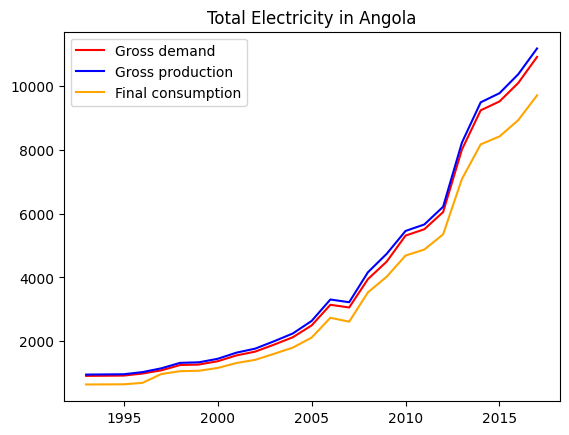

In [379]:
#Visualizing the data

x_Angola = Angola_df['Year']
y1_Angola = Angola_df['Gross demand']
y2_Angola = Angola_df['Gross production']
y3_Angola = Angola_df['Final consumption']

plt.plot(x_Angola, y1_Angola, color='red', label='Gross demand')
plt.plot(x_Angola, y2_Angola, color='blue', label='Gross production')
plt.plot(x_Angola, y3_Angola, color='orange', label='Final consumption')

plt.title('Total Electricity in Angola')
plt.legend()
plt.show()

In [380]:
Angola_demand_fig = px.line(Angola_df, x='Year', y='Gross demand', title='Gross demand of electricity in Angola')
Angola_production_fig = px.line(Angola_df, x='Year', y='Gross production', title='Gross production of electricity in Angola')
Angola_consumption_fig = px.line(Angola_df, x='Year', y='Final consumption', title='Final consumption of electricity in Angola')

Angola_demand_fig.show()
Angola_production_fig.show()
Angola_consumption_fig.show()

In [381]:
#Argentina dataframe

Argentina_df = df.loc[df['Country'] == 'Argentina']
Argentina_max_year = Argentina_df['Year'].max()
Argentina_min_year = Argentina_df['Year'].min()
Argentina_df_Years = np.arange(Argentina_min_year, Argentina_max_year+1, 1)

print(Argentina_max_year)
print(Argentina_min_year)
print(Argentina_df_Years.sum())
print(Argentina_df['Year'].sum())
print(Argentina_df_Years.sum() == Argentina_df['Year'].sum())
print(Argentina_df_Years)
print(np.array(Argentina_df['Year'].sort_values(ascending=True)))

2022
1990
66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


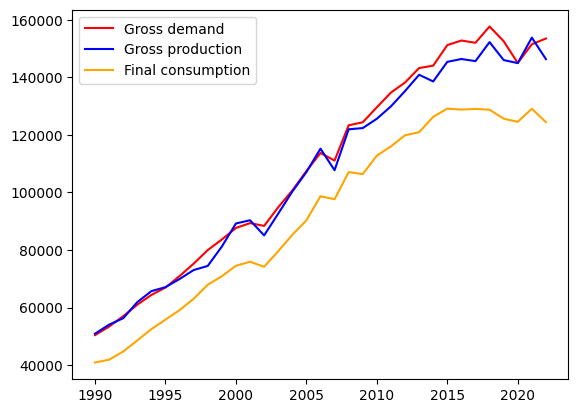

In [382]:
#Visualize the data

x_Argentina = Argentina_df['Year']
y1_Argentina = Argentina_df['Gross demand']
y2_Argentina = Argentina_df['Gross production']
y3_Argentina = Argentina_df['Final consumption']

plt.plot(x_Argentina, y1_Argentina, color='red', label='Gross demand')
plt.plot(x_Argentina, y2_Argentina, color='blue', label='Gross production')
plt.plot(x_Argentina, y3_Argentina, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [383]:
Argentina_demand_fig = px.line(Argentina_df, x='Year', y='Gross demand', title='Gross demand of electricity in Argentina')
Argentina_production_fig = px.line(Argentina_df, x='Year', y='Gross production', title='Gross production of electricity in Argentina')
Argentina_consumption_fig = px.line(Argentina_df, x='Year', y='Final consumption', title='Final consumption of electricity in Argentina')

Argentina_demand_fig.show()
Argentina_production_fig.show()
Argentina_consumption_fig.show()

In [384]:
#Armenia dataframe

Armenia_df = df.loc[df['Country'] == 'Armenia']
Armenia_max_year = Armenia_df['Year'].max()
Armenia_min_year = Armenia_df['Year'].min()
Armenia_df_Years = np.arange(Armenia_min_year, Armenia_max_year+1, 1)

print(Armenia_max_year)
print(Armenia_min_year)
print(Armenia_df_Years.sum())
print(Armenia_df['Year'].sum())
print(Armenia_df_Years.sum() == Armenia_df['Year'].sum())
print(Armenia_df_Years)
print(np.array(Armenia_df['Year'].sort_values(ascending=True)))

2021
1992
60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


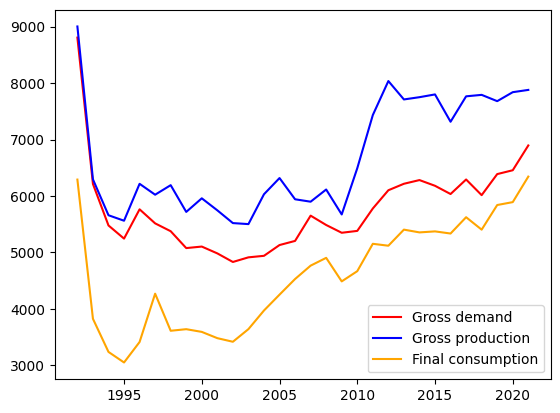

In [385]:
#Visualize the data

x_Armenia = Armenia_df['Year']
y1_Armenia = Armenia_df['Gross demand']
y2_Armenia = Armenia_df['Gross production']
y3_Armenia = Armenia_df['Final consumption']

plt.plot(x_Armenia, y1_Armenia, color='red', label='Gross demand')
plt.plot(x_Armenia, y2_Armenia, color='blue', label='Gross production')
plt.plot(x_Armenia, y3_Armenia, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [386]:
Armenia_demand_fig = px.line(Armenia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Armenia')
Armenia_production_fig = px.line(Armenia_df, x='Year', y='Gross production', title='Gross production of electricity in Armenia')
Armenia_consumption_fig = px.line(Armenia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Armenia')

Armenia_demand_fig.show()
Armenia_production_fig.show()
Armenia_consumption_fig.show()

In [387]:
#Australia dataframe

Australia_df = df.loc[df['Country'] == 'Australia']
Australia_max_year = Australia_df['Year'].max()
Australia_min_year = Australia_df['Year'].min()
Australia_df_Years = np.arange(Australia_min_year, Australia_max_year+1, 1)

print(Australia_max_year)
print(Australia_min_year)
print(Australia_df_Years.sum())
print(Australia_df['Year'].sum())
print(Australia_df_Years.sum() == Australia_df['Year'].sum())
print(Australia_df_Years)
print(np.array(Australia_df['Year'].sort_values(ascending=True)))

2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


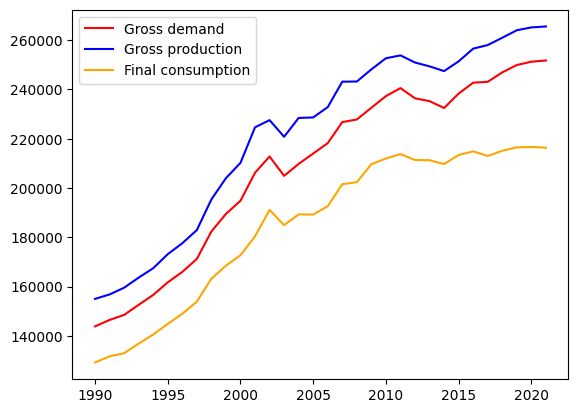

In [388]:
#Visualize the data

x_Australia = Australia_df['Year']
y1_Australia = Australia_df['Gross demand']
y2_Australia = Australia_df['Gross production']
y3_Australia = Australia_df['Final consumption']

plt.plot(x_Australia, y1_Australia, color='red', label='Gross demand')
plt.plot(x_Australia, y2_Australia, color='blue', label='Gross production')
plt.plot(x_Australia, y3_Australia, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [389]:
Australia_demand_fig = px.line(Australia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Australia')
Australia_production_fig = px.line(Australia_df, x='Year', y='Gross production', title='Gross production of electricity in Australia')
Australia_consumption_fig = px.line(Australia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Australia')

Australia_demand_fig.show()
Australia_production_fig.show()
Australia_consumption_fig.show()

In [390]:
#Austria dataframe

Austria_df = df.loc[df['Country'] == 'Austria']
Austria_max_year = Austria_df['Year'].max()
Austria_min_year = Austria_df['Year'].min()
Austria_df_Years = np.arange(Austria_min_year, Austria_max_year+1, 1)

print(Austria_max_year)
print(Austria_min_year)
print(Austria_df_Years.sum())
print(Austria_df['Year'].sum())
print(Austria_df_Years.sum() == Austria_df['Year'].sum())
print(Austria_df_Years)
print(np.array(Austria_df['Year'].sort_values(ascending=True)))


2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


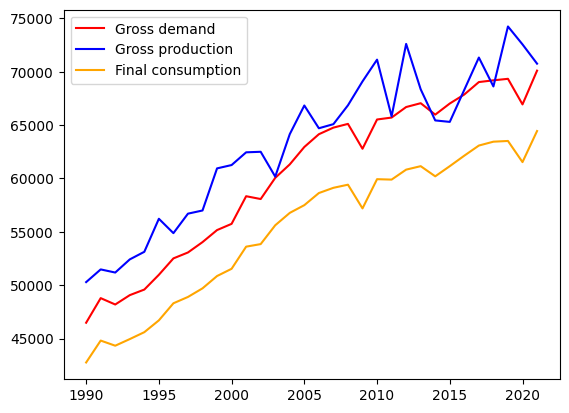

In [391]:
#Visualize the data

x_Austria = Austria_df['Year']
y1_Austria = Austria_df['Gross demand']
y2_Austria = Austria_df['Gross production']
y3_Austria = Austria_df['Final consumption']

plt.plot(x_Austria, y1_Austria, color='red', label='Gross demand')
plt.plot(x_Austria, y2_Austria, color='blue', label='Gross production')
plt.plot(x_Austria, y3_Austria, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [392]:
Austria_demand_fig = px.line(Austria_df, x='Year', y='Gross demand', title='Gross demand of electricity in Austria')
Austria_production_fig = px.line(Austria_df, x='Year', y='Gross production', title='Gross production of electricity in Austria')
Austria_consumption_fig = px.line(Austria_df, x='Year', y='Final consumption', title='Final consumption of electricity in Austria')

Austria_demand_fig.show()
Austria_production_fig.show()
Austria_consumption_fig.show()

In [393]:
#Azerbaijan dataframe

Azerbaijan_df = df.loc[df['Country'] == 'Azerbaijan']
Azerbaijan_max_year = Azerbaijan_df['Year'].max()
Azerbaijan_min_year = Azerbaijan_df['Year'].min()
Azerbaijan_df_Years = np.arange(Azerbaijan_min_year, Azerbaijan_max_year+1, 1)

print(Azerbaijan_max_year)
print(Azerbaijan_min_year)
print(Azerbaijan_df_Years.sum())
print(Azerbaijan_df['Year'].sum())
print(Azerbaijan_df_Years.sum() == Azerbaijan_df['Year'].sum())
print(Azerbaijan_df_Years)
print(np.array(Azerbaijan_df['Year'].sort_values(ascending=True)))

2021
1992
60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


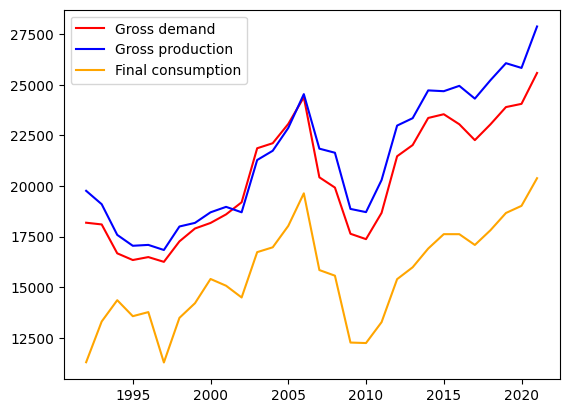

In [394]:
#Visualize the data

x_Azerbaijan = Azerbaijan_df['Year']
y1_Azerbaijan = Azerbaijan_df['Gross demand']
y2_Azerbaijan = Azerbaijan_df['Gross production']
y3_Azerbaijan = Azerbaijan_df['Final consumption']

plt.plot(x_Azerbaijan, y1_Azerbaijan, color='red', label='Gross demand')
plt.plot(x_Azerbaijan, y2_Azerbaijan, color='blue', label='Gross production')
plt.plot(x_Azerbaijan, y3_Azerbaijan, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [395]:
#Bahrain dataframe

Bahrain_df = df.loc[df['Country'] == 'Bahrain']
Bahrain_max_year = Bahrain_df['Year'].max()
Bahrain_min_year = Bahrain_df['Year'].min()
Bahrain_df_Years = np.arange(Bahrain_min_year,Bahrain_max_year+1, 1)

print(Bahrain_max_year)
print(Bahrain_min_year)
print(Bahrain_df_Years.sum())
print(Bahrain_df['Year'].sum())
print(Bahrain_df_Years.sum() == Bahrain_df['Year'].sum())
print(Bahrain_df_Years)
print(np.array(Bahrain_df['Year'].sort_values(ascending=True)))

2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


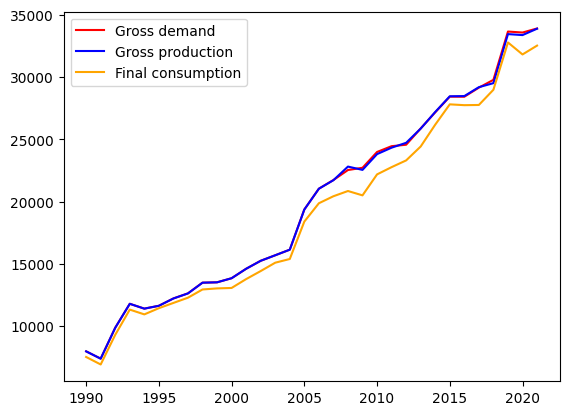

In [396]:
#Visualizing the data

x_Bahrain = Bahrain_df['Year']
y1_Bahrain = Bahrain_df['Gross demand']
y2_Bahrain = Bahrain_df['Gross production']
y3_Bahrain = Bahrain_df['Final consumption']

plt.plot(x_Bahrain, y1_Bahrain, color='red', label='Gross demand')
plt.plot(x_Bahrain, y2_Bahrain, color='blue', label='Gross production')
plt.plot(x_Bahrain, y3_Bahrain, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [397]:
Bahrain_demand_fig = px.line(Bahrain_df, x='Year', y='Gross demand', title='Gross demand of electricity in Bahrain')
Bahrain_production_fig = px.line(Bahrain_df, x='Year', y='Gross production', title='Gross production of electricity in Bahrain')
Bahrain_consumption_fig = px.line(Bahrain_df, x='Year', y='Final consumption', title='Final consumption of electricity in Bahrain')

Bahrain_demand_fig.show()
Bahrain_production_fig.show()
Bahrain_consumption_fig.show()

In [398]:
#Bangladesh dataframe

Bangladesh_df = df.loc[df['Country'] == 'Bangladesh']
Bangladesh_max_year = Bangladesh_df['Year'].max()
Bangladesh_min_year = Bangladesh_df['Year'].min()
Bangladesh_df_Years = np.arange(Bangladesh_min_year, Bangladesh_max_year+1, 1)

print(Bangladesh_max_year)
print(Bangladesh_min_year)
print(Bangladesh_df_Years.sum())
print(Bangladesh_df['Year'].sum())
print(Bangladesh_df_Years.sum() == Bangladesh_df['Year'].sum())
print(Bangladesh_df_Years)
print(np.array(Bangladesh_df['Year'].sort_values(ascending=True)))

2021
1991
62186
56159
False
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]
[1991 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2019 2020 2021]


In [399]:
#Barbados dataframe

Barbados_df = df.loc[df['Country'] == 'Barbados']
Barbados_max_year = Barbados_df['Year'].max()
Barbados_min_year = Barbados_df['Year'].min()
Barbados_df_Years = np.arange(Barbados_min_year, Barbados_max_year+1, 1)

print(Barbados_max_year)
print(Barbados_min_year)
print(Barbados_df_Years.sum())
print(Barbados_df['Year'].sum())
print(Barbados_df_Years.sum() == Barbados_df['Year'].sum())
print(Barbados_df_Years)
print(np.array(Barbados_df['Year'].sort_values(ascending=True)))

2012
1990
46023
46023
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012]


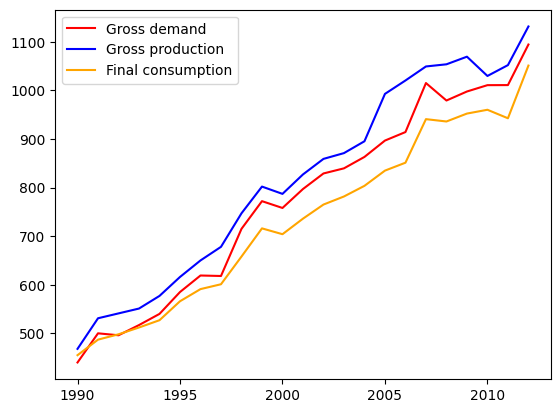

In [400]:
#Visualizing the data

x_Barbados = Barbados_df['Year']
y1_Barbados = Barbados_df['Gross demand']
y2_Barbados = Barbados_df['Gross production']
y3_Barbados = Barbados_df['Final consumption']

plt.plot(x_Barbados, y1_Barbados, color='red', label='Gross demand')
plt.plot(x_Barbados, y2_Barbados, color='blue', label='Gross production')
plt.plot(x_Barbados, y3_Barbados, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [401]:
Barbados_demand_fig = px.line(Barbados_df, x='Year', y='Gross demand', title='Gross demand of electricity in Barbados')
Barbados_production_fig = px.line(Barbados_df, x='Year', y='Gross production', title='Gross production of electricity in Barbados')
Barbados_consumption_fig = px.line(Barbados_df, x='Year', y='Final consumption', title='Final consumption of electricity in Barbados')

Barbados_demand_fig.show()
Barbados_production_fig.show()
Barbados_consumption_fig.show()

In [402]:
#Belarus dataframe

Belarus_df = df.loc[df['Country'] == 'Belarus']
Belarus_max_year = Belarus_df['Year'].max()
Belarus_min_year = Belarus_df['Year'].min()
Belarus_df_Years = np.arange(Belarus_min_year, Belarus_max_year+1, 1)

print(Belarus_max_year)
print(Belarus_min_year)
print(Belarus_df_Years.sum())
print(Belarus_df['Year'].sum())
print(Belarus_df_Years.sum() == Belarus_df['Year'].sum())
print(Belarus_df_Years)
print(np.array(Belarus_df['Year'].sort_values(ascending=True)))

2021
1992
60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


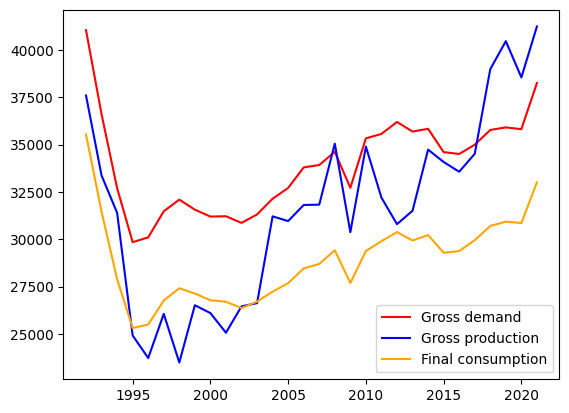

In [403]:
#Visualizing the data

x_Belarus = Belarus_df['Year']
y1_Belarus = Belarus_df['Gross demand']
y2_Belarus = Belarus_df['Gross production']
y3_Belarus = Belarus_df['Final consumption']

plt.plot(x_Belarus, y1_Belarus, color='red', label='Gross demand')
plt.plot(x_Belarus, y2_Belarus, color='blue', label='Gross production')
plt.plot(x_Belarus, y3_Belarus, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [404]:
Belarus_demand_fig = px.line(Belarus_df, x='Year', y='Gross demand', title='Gross demand of electricity in Belarus')
Belarus_production_fig = px.line(Belarus_df, x='Year', y='Gross production', title='Gross production of electricity in Belarus')
Belarus_consumption_fig = px.line(Belarus_df, x='Year', y='Final consumption', title='Final consumption of electricity in Belarus')

Belarus_demand_fig.show()
Belarus_production_fig.show()
Belarus_consumption_fig.show()

In [405]:
#Belgium dataframe

Belgium_df = df.loc[df['Country'] == 'Belgium']
Belgium_max_year = Belgium_df['Year'].max()
Belgium_min_year = Belgium_df['Year'].min()
Belgium_df_Years = np.arange(Belgium_min_year, Belgium_max_year+1, 1)

print(Belgium_max_year)
print(Belgium_min_year)
print(Belgium_df_Years.sum())
print(Belgium_df['Year'].sum())
print(Belgium_df_Years.sum() == Belgium_df['Year'].sum())
print(Belgium_df_Years)
print(np.array(Belgium_df['Year'].sort_values(ascending=True)))

2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


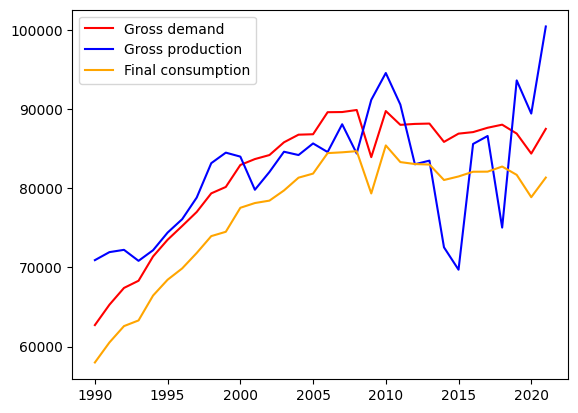

In [406]:
#Visualizing the data

x_Belgium = Belgium_df['Year']
y1_Belgium = Belgium_df['Gross demand']
y2_Belgium = Belgium_df['Gross production']
y3_Belgium = Belgium_df['Final consumption']

plt.plot(x_Belgium, y1_Belgium, color='red', label='Gross demand')
plt.plot(x_Belgium, y2_Belgium, color='blue', label='Gross production')
plt.plot(x_Belgium, y3_Belgium, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [407]:
Belgium_demand_fig = px.line(Belgium_df, x='Year', y='Gross demand', title='Gross demand of electricity in Belgium')
Belgium_production_fig = px.line(Belgium_df, x='Year', y='Gross production', title='Gross production of electricity in Belgium')
Belgium_consumption_fig = px.line(Belgium_df, x='Year', y='Final consumption', title='Final consumption of electricity in Belgium')

Belgium_demand_fig.show()
Belgium_production_fig.show()
Belgium_consumption_fig.show()

In [408]:
#Benin dataframe

Benin_df = df.loc[df['Country'] == 'Benin']
Benin_max_year = Benin_df['Year'].max()
Benin_min_year = Benin_df['Year'].min()
Benin_df_Years = np.arange(Benin_min_year, Benin_max_year+1, 1)

print(Benin_max_year)
print(Benin_min_year)
print(Benin_df_Years.sum())
print(Benin_df['Year'].sum())
print(Benin_df_Years.sum() == Benin_df['Year'].sum())
print(Benin_df_Years)
print(np.array(Benin_df['Year'].sort_values(ascending=True)))


2021
1998
48228
48228
True
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


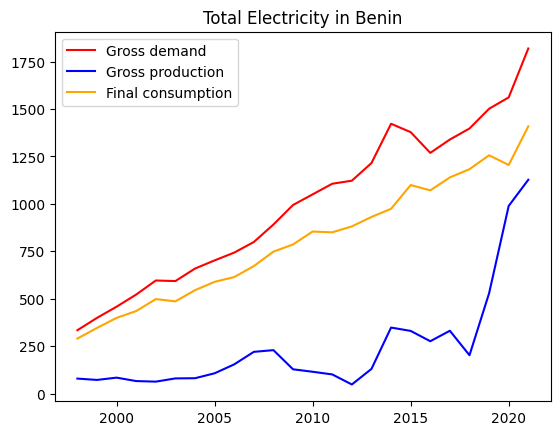

In [409]:
#Visualizing the data

x_Benin = Benin_df['Year']
y1_Benin = Benin_df['Gross demand']
y2_Benin = Benin_df['Gross production']
y3_Benin = Benin_df['Final consumption']

plt.plot(x_Benin, y1_Benin, color='red', label='Gross demand')
plt.plot(x_Benin, y2_Benin, color='blue', label='Gross production')
plt.plot(x_Benin, y3_Benin, color='orange', label='Final consumption')

plt.title('Total Electricity in Benin')
plt.legend()
plt.show()

In [410]:
Benin_demand_fig = px.line(Benin_df, x='Year', y='Gross demand', title='Gross demand of electricity in Benin')
Benin_production_fig = px.line(Benin_df, x='Year', y='Gross production', title='Gross production of electricity in Benin')
Benin_consumption_fig = px.line(Benin_df, x='Year', y='Final consumption', title='Final consumption of electricity in Benin')

Benin_demand_fig.show()
Benin_production_fig.show()
Benin_consumption_fig.show()

In [411]:
#Bolivia (Plur. State of) dataframe

Bolivia_df = df.loc[df['Country'] == 'Bolivia (Plur. State of)']
Bolivia_max_year = Bolivia_df['Year'].max()
Bolivia_min_year = Bolivia_df['Year'].min()
Bolivia_df_Years = np.arange(Bolivia_min_year, Bolivia_max_year+1, 1)

print(Bolivia_max_year)
print(Bolivia_min_year)
print(Bolivia_df_Years.sum())
print(Bolivia_df['Year'].sum())
print(Bolivia_df_Years.sum() == Bolivia_df['Year'].sum())
print(Bolivia_df_Years)
print(np.array(Bolivia_df['Year'].sort_values(ascending=True)))

2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


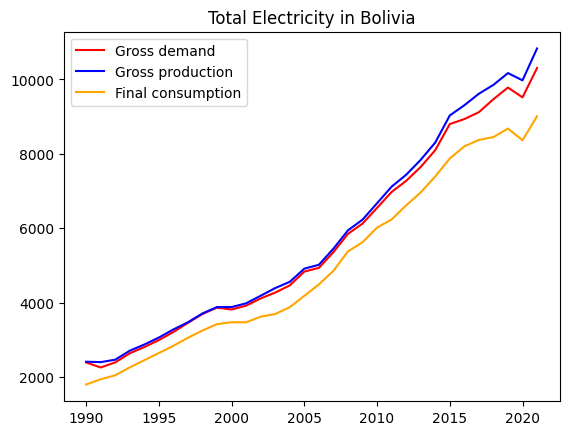

In [412]:
#Visualizing the data

x_Bolivia = Bolivia_df['Year']
y1_Bolivia = Bolivia_df['Gross demand']
y2_Bolivia = Bolivia_df['Gross production']
y3_Bolivia = Bolivia_df['Final consumption']

plt.plot(x_Bolivia, y1_Bolivia, color='red', label='Gross demand')
plt.plot(x_Bolivia, y2_Bolivia, color='blue', label='Gross production')
plt.plot(x_Bolivia, y3_Bolivia, color='orange', label='Final consumption')

plt.title('Total Electricity in Bolivia')
plt.legend()
plt.show()

In [413]:
Bolivia_demand_fig = px.line(Bolivia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Bolivia')
Bolivia_production_fig = px.line(Bolivia_df, x='Year', y='Gross production', title='Gross production of electricity in Bolivia')
Bolivia_consumption_fig = px.line(Bolivia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Bolivia')

Bolivia_demand_fig.show()
Bolivia_production_fig.show()
Bolivia_consumption_fig.show()

In [414]:
#Bosnia and Herzegovina dataframe

Bosnia_and_Herzegovina_df = df.loc[df['Country'] == 'Bosnia and Herzegovina'] 
Bosnia_and_Herzegovina_max_year = Bosnia_and_Herzegovina_df['Year'].max()
Bosnia_and_Herzegovina_min_year = Bosnia_and_Herzegovina_df['Year'].min()
Bosnia_and_Herzegovina_df_Years = np.arange(Bosnia_and_Herzegovina_min_year, Bosnia_and_Herzegovina_max_year+1, 1)

print(Bosnia_and_Herzegovina_max_year)
print(Bosnia_and_Herzegovina_min_year)
print(Bosnia_and_Herzegovina_df_Years.sum())
print(Bosnia_and_Herzegovina_df['Year'].sum())
print(Bosnia_and_Herzegovina_df_Years.sum() == Bosnia_and_Herzegovina_df['Year'].sum())
print(Bosnia_and_Herzegovina_df_Years)
print(np.array(Bosnia_and_Herzegovina_df['Year'].sort_values(ascending=True)))

2021
1992
60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


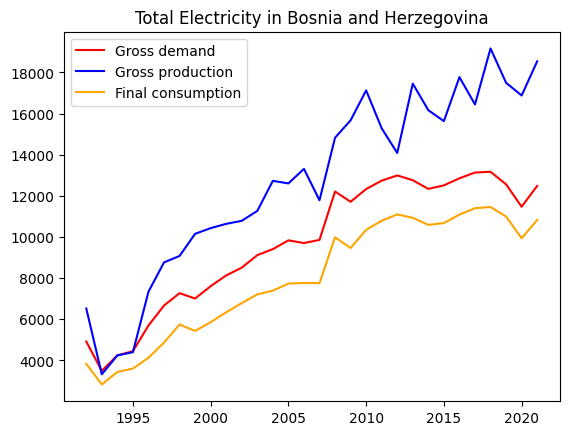

In [415]:
#Visualizing the data

x_Bosnia_and_Herzegovina = Bosnia_and_Herzegovina_df['Year']
y1_Bosnia_and_Herzegovina = Bosnia_and_Herzegovina_df['Gross demand']
y2_Bosnia_and_Herzegovina = Bosnia_and_Herzegovina_df['Gross production']
y3_Bosnia_and_Herzegovina = Bosnia_and_Herzegovina_df['Final consumption']

plt.plot(x_Bosnia_and_Herzegovina, y1_Bosnia_and_Herzegovina, color='red', label='Gross demand')
plt.plot(x_Bosnia_and_Herzegovina, y2_Bosnia_and_Herzegovina, color='blue', label='Gross production')
plt.plot(x_Bosnia_and_Herzegovina, y3_Bosnia_and_Herzegovina, color='orange', label='Final consumption')

plt.title('Total Electricity in Bosnia and Herzegovina')
plt.legend()
plt.show()

In [416]:
Bosnia_and_Herzegovina_demand_fig = px.line(Bosnia_and_Herzegovina_df, x='Year', y='Gross demand', title='Gross demand of electricity in Bosnia and Herzegovina')
Bosnia_and_Herzegovina_production_fig = px.line(Bosnia_and_Herzegovina_df, x='Year', y='Gross production', title='Gross production of electricity in Bosnia and Herzegovina')
Bosnia_and_Herzegovina_consumption_fig = px.line(Bosnia_and_Herzegovina_df, x='Year', y='Final consumption', title='Final consumption of electricity in Bosnia and Herzegovina')

Bosnia_and_Herzegovina_demand_fig.show()
Bosnia_and_Herzegovina_production_fig.show()
Bosnia_and_Herzegovina_consumption_fig.show()

In [417]:
#Botswana dataframe

Botswana_df = df.loc[df['Country'] == 'Botswana']
Botswana_max_year = Botswana_df['Year'].max()
Botswana_min_year = Botswana_df['Year'].min()
Botswana_df_Years = np.arange(Botswana_min_year, Botswana_max_year+1, 1)

print(Botswana_max_year)
print(Botswana_min_year)
print(Botswana_df_Years.sum())
print(Botswana_df['Year'].sum())
print(Botswana_df_Years.sum() == Botswana_df['Year'].sum())
print(Botswana_df_Years)
print(np.array(Botswana_df['Year'].sort_values(ascending=True)))

2021
1990
64176
60165
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2016 2017 2018 2019
 2020 2021]


In [418]:
#Brazil datdframe

Brazil_df = df.loc[df['Country'] == 'Brazil']
Brazil_max_year = Brazil_df['Year'].max()
Brazil_min_year = Brazil_df['Year'].min()
Brazil_df_Years = np.arange(Brazil_min_year, Brazil_max_year+1, 1)

print(Brazil_max_year)
print(Brazil_min_year)
print(Brazil_df_Years.sum())
print(Brazil_df['Year'].sum())
print(Brazil_df_Years.sum() == Brazil_df['Year'].sum())
print(Brazil_df_Years)
print(np.array(Brazil_df['Year'].sort_values(ascending=True)))


2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


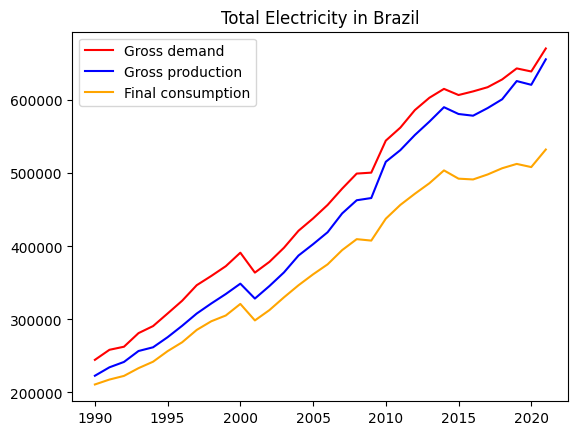

In [419]:
#Visualizing the data

x_Brazil = Brazil_df['Year']
y1_Brazil = Brazil_df['Gross demand']
y2_Brazil = Brazil_df['Gross production']
y3_Brazil = Brazil_df['Final consumption']

plt.plot(x_Brazil, y1_Brazil, color='red', label='Gross demand')
plt.plot(x_Brazil, y2_Brazil, color='blue', label='Gross production')
plt.plot(x_Brazil, y3_Brazil, color='orange', label='Final consumption')

plt.title('Total Electricity in Brazil')
plt.legend()
plt.show()

In [420]:
Brazil_demand_fig = px.line(Brazil_df, x='Year', y='Gross demand', title='Gross demand of electricity in Brazil')
Brazil_production_fig = px.line(Brazil_df, x='Year', y='Gross production', title='Gross production of electricity in Brazil')
Brazil_consumption_fig = px.line(Brazil_df, x='Year', y='Final consumption', title='Final consumption of electricity in Brazil')

Brazil_demand_fig.show()
Brazil_production_fig.show()
Brazil_consumption_fig.show()

In [421]:
#Brunei Darussalam dataframe

Brunei_Darussalam_df = df.loc[df['Country'] == 'Brunei Darussalam']
Brunei_Darussalam_max_year = Brunei_Darussalam_df['Year'].max()
Brunei_Darussalam_min_year = Brunei_Darussalam_df['Year'].min()
Brunei_Darussalam_df_Years = np.arange(Brunei_Darussalam_min_year, Brunei_Darussalam_max_year+1, 1)

print(Brunei_Darussalam_max_year)
print(Brunei_Darussalam_min_year)
print(Brunei_Darussalam_df_Years.sum())
print(Brunei_Darussalam_df['Year'].sum())
print(Brunei_Darussalam_df_Years.sum() == Brunei_Darussalam_df['Year'].sum())
print(Brunei_Darussalam_df_Years)
print(np.array(Brunei_Darussalam_df['Year'].sort_values(ascending=True)))

2021
1998
48228
48228
True
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


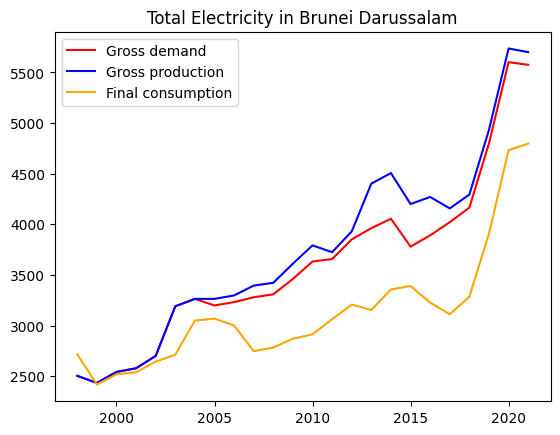

In [422]:
#Visualizing the data

x_Brunei_Darussalam = Brunei_Darussalam_df['Year']
y1_Brunei_Darussalam = Brunei_Darussalam_df['Gross demand']
y2_Brunei_Darussalam = Brunei_Darussalam_df['Gross production']
y3_Brunei_Darussalam= Brunei_Darussalam_df['Final consumption']

plt.plot(x_Brunei_Darussalam, y1_Brunei_Darussalam, color='red', label='Gross demand')
plt.plot(x_Brunei_Darussalam, y2_Brunei_Darussalam, color='blue', label='Gross production')
plt.plot(x_Brunei_Darussalam, y3_Brunei_Darussalam, color='orange', label='Final consumption')

plt.title('Total Electricity in Brunei Darussalam')
plt.legend()
plt.show()

In [423]:
Brunei_Darussalam_demand_fig = px.line(Brunei_Darussalam_df, x='Year', y='Gross demand', title='Gross demand of electricity in Brunei Darussalam')
Brunei_Darussalam_production_fig = px.line(Brunei_Darussalam_df, x='Year', y='Gross production', title='Gross production of electricity in Brunei Darussalam')
Brunei_Darussalam_consumption_fig = px.line(Brunei_Darussalam_df, x='Year', y='Final consumption', title='Final consumption of electricity in Brunei Darussalam')

Brunei_Darussalam_demand_fig.show()
Brunei_Darussalam_production_fig.show()
Brunei_Darussalam_consumption_fig.show()

In [424]:
#Bulgaria dataframe

Bulgaria_df = df.loc[df['Country'] == 'Bulgaria']
Bulgaria_max_year = Bulgaria_df['Year'].max()
Bulgaria_min_year = Bulgaria_df['Year'].min()
Bulgaria_df_Years = np.arange(Bulgaria_min_year, Bulgaria_max_year+1, 1)

print(Bulgaria_max_year)
print(Bulgaria_min_year)
print(Bulgaria_df_Years.sum())
print(Bulgaria_df['Year'].sum())
print(Bulgaria_df_Years.sum() == Bulgaria_df['Year'].sum())
print(Bulgaria_df_Years)
print(np.array(Bulgaria_df['Year'].sort_values(ascending=True)))

2021
1990
64176
62180
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


In [425]:
#Cambodia dataframe

Cambodia_df = df.loc[df['Country'] == 'Cambodia']
Cambodia_max_year = Cambodia_df['Year'].max()
Cambodia_min_year = Cambodia_df['Year'].min()
Cambodia_df_Years = np.arange(Cambodia_min_year, Cambodia_max_year+1, 1)

print(Cambodia_max_year)
print(Cambodia_min_year)
print(Cambodia_df_Years.sum())
print(Cambodia_df['Year'].sum())
print(Cambodia_df_Years.sum() == Cambodia_df['Year'].sum())
print(Cambodia_df_Years)
print(np.array(Cambodia_df['Year'].sort_values(ascending=True)))

2021
1995
54216
50219
False
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1995 1996 1997 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [426]:
#Cameroon dataframe

Cameroon_df = df.loc[df['Country'] == 'Cameroon']
Cameroon_max_year = Cameroon_df['Year'].max()
Cameroon_min_year = Cameroon_df['Year'].min()
Cameroon_df_Years = np.arange(Cameroon_min_year, Cameroon_max_year+1, 1)

print(Cameroon_max_year)
print(Cameroon_min_year)
print(Cameroon_df_Years.sum())
print(Cameroon_df['Year'].sum())
print(Cameroon_df_Years.sum() == Cameroon_df['Year'].sum())
print(Cameroon_df_Years)
print(np.array(Cameroon_df['Year'].sort_values(ascending=True)))

2021
1997
50225
50225
True
[1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010
 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


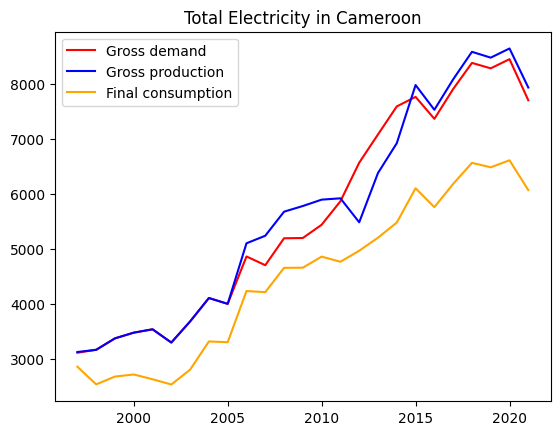

In [427]:
#Visualizing the data

x_Cameroon = Cameroon_df['Year']
y1_Cameroon = Cameroon_df['Gross demand']
y2_Cameroon = Cameroon_df['Gross production']
y3_Cameroon = Cameroon_df['Final consumption']

plt.plot(x_Cameroon, y1_Cameroon, color='red', label='Gross demand')
plt.plot(x_Cameroon, y2_Cameroon, color='blue', label='Gross production')
plt.plot(x_Cameroon, y3_Cameroon, color='orange', label='Final consumption')

plt.title('Total Electricity in Cameroon')
plt.legend()
plt.show()

In [428]:
Cameroon_demand_fig = px.line(Cameroon_df, x='Year', y='Gross demand', title='Gross demand of electricity in Cameroon')
Cameroon_production_fig = px.line(Cameroon_df, x='Year', y='Gross production', title='Gross production of electricity in Cameroon')
Cameroon_consumption_fig = px.line(Cameroon_df, x='Year', y='Final consumption', title='Final consumption of electricity in Cameroon')

Cameroon_demand_fig.show()
Cameroon_production_fig.show()
Cameroon_consumption_fig.show()

In [429]:
#Canada dataframe

Canada_df = df.loc[df['Country'] == 'Canada']
Canada_max_year = Canada_df['Year'].max()
Canada_min_year = Canada_df['Year'].min()
Canada_df_Years = np.arange(Canada_min_year, Canada_max_year+1, 1)

print(Canada_max_year)
print(Canada_min_year)
print(Canada_df_Years.sum())
print(Canada_df['Year'].sum())
print(Canada_df_Years.sum() == Canada_df['Year'].sum())
print(Canada_df_Years)
print(np.array(Canada_df['Year'].sort_values(ascending=True)))

2021
1990
64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


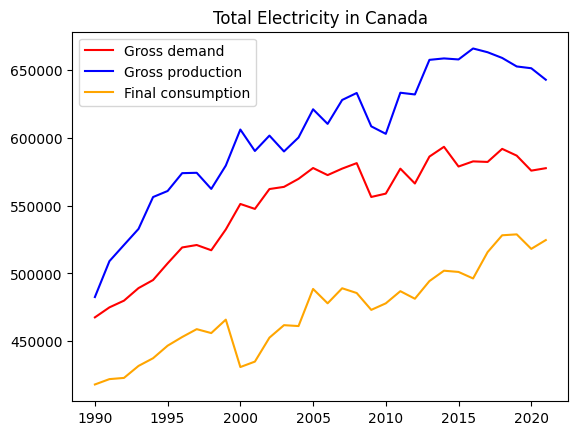

In [430]:
#Visualizing the data

x_Canada = Canada_df['Year']
y1_Canada = Canada_df['Gross demand']
y2_Canada = Canada_df['Gross production']
y3_Canada = Canada_df['Final consumption']

plt.plot(x_Canada, y1_Canada, color='red', label='Gross demand')
plt.plot(x_Canada, y2_Canada, color='blue', label='Gross production')
plt.plot(x_Canada, y3_Canada, color='orange', label='Final consumption')

plt.title('Total Electricity in Canada')
plt.legend()
plt.show()

In [431]:
Canada_demand_fig = px.line(Canada_df, x='Year', y='Gross demand', title='Gross demand of electricity in Canada')
Canada_production_fig = px.line(Canada_df, x='Year', y='Gross production', title='Gross production of electricity in Canada')
Canada_consumption_fig = px.line(Canada_df, x='Year', y='Final consumption', title='Final consumption of electricity in Canada')

Canada_demand_fig.show()
Canada_production_fig.show()
Canada_consumption_fig.show()

In [432]:
#Cayman Islands dataframe

Cayman_Islands_df = df.loc[df['Country'] == 'Cayman Islands']
Cayman_Islands_max_year = Cayman_Islands_df['Year'].max()
Cayman_Islands_min_year = Cayman_Islands_df['Year'].min()
Cayman_Islands_df_Years = np.arange(Cayman_Islands_min_year, Cayman_Islands_max_year+1, 1)

print(Cayman_Islands_max_year)
print(Cayman_Islands_min_year)
print(Cayman_Islands_df_Years.sum())
print(Cayman_Islands_df['Year'].sum())
print(Cayman_Islands_df_Years.sum() == Cayman_Islands_df['Year'].sum())
print(Cayman_Islands_df_Years)
print(np.array(Cayman_Islands_df['Year'].sort_values(ascending=True)))

2022
1990
66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


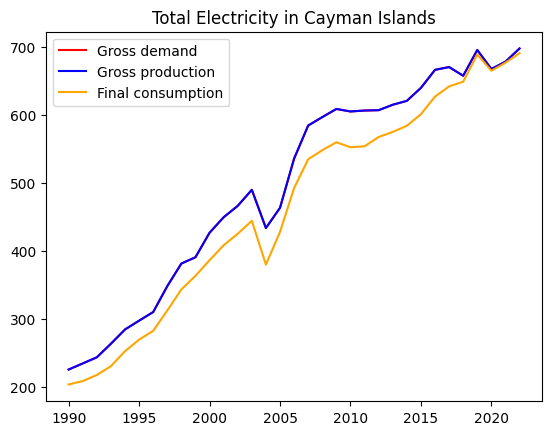

In [433]:
#Visualizing the data

x_Cayman_Islands = Cayman_Islands_df['Year']
y1_Cayman_Islands = Cayman_Islands_df['Gross demand']
y2_Cayman_Islands = Cayman_Islands_df['Gross production']
y3_Cayman_Islands = Cayman_Islands_df['Final consumption']

plt.plot(x_Cayman_Islands, y1_Cayman_Islands, color='red', label='Gross demand')
plt.plot(x_Cayman_Islands, y2_Cayman_Islands, color='blue', label='Gross production')
plt.plot(x_Cayman_Islands, y3_Cayman_Islands, color='orange', label='Final consumption')

plt.title('Total Electricity in Cayman Islands')
plt.legend()
plt.show()

In [434]:
Cayman_Islands_demand_fig = px.line(Cayman_Islands_df, x='Year', y='Gross demand', title='Gross demand of electricity in Cayman Islands')
Cayman_Islands_production_fig = px.line(Cayman_Islands_df, x='Year', y='Gross production', title='Gross production of electricity in Cayman Islands')
Cayman_Islands_consumption_fig = px.line(Cayman_Islands_df, x='Year', y='Final consumption', title='Final consumption of electricity in Cayman Islands')

Cayman_Islands_demand_fig.show()
Cayman_Islands_production_fig.show()
Cayman_Islands_consumption_fig.show()

In [435]:
#Chile dataframe

Chile_df = df.loc[df['Country'] == 'Chile']
Chile_max_year = Chile_df['Year'].max()
Chile_min_year = Chile_df['Year'].min()
Chile_df_Years = np.arange(Chile_min_year, Chile_max_year+1, 1)

print(Chile_df_Years.sum())
print(Chile_df['Year'].sum())
print(Chile_df_Years.sum() == Chile_df['Year'].sum())
print(Chile_df_Years)
print(np.array(Chile_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


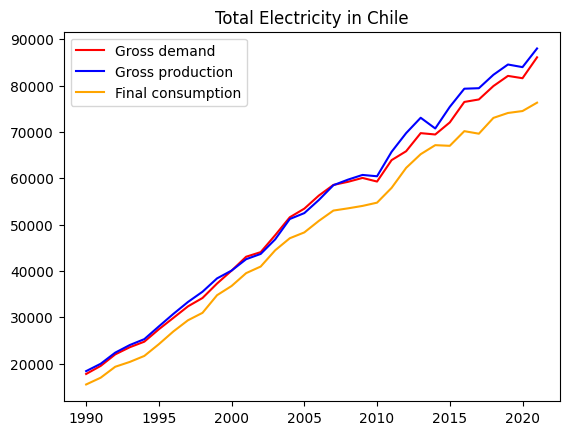

In [436]:
#Visualizing the data

x_Chile = Chile_df['Year']
y1_Chile = Chile_df['Gross demand']
y2_Chile = Chile_df['Gross production']
y3_Chile = Chile_df['Final consumption']

plt.plot(x_Chile, y1_Chile, color='red', label='Gross demand')
plt.plot(x_Chile, y2_Chile, color='blue', label='Gross production')
plt.plot(x_Chile, y3_Chile, color='orange', label='Final consumption')

plt.title('Total Electricity in Chile')
plt.legend()
plt.show()

In [437]:
Chile_demand_fig = px.line(Chile_df, x='Year', y='Gross demand', title='Gross demand of electricity in Chile')
Chile_production_fig = px.line(Chile_df, x='Year', y='Gross production', title='Gross production of electricity in Chile')
Chile_consumption_fig = px.line(Chile_df, x='Year', y='Final consumption', title='Final consumption of electricity in Chile')

Chile_demand_fig.show()
Chile_production_fig.show()
Chile_consumption_fig.show()

In [438]:
#China dataframe

China_df = df.loc[df['Country'] == 'China']
China_max_year = China_df['Year'].max()
China_min_year = China_df['Year'].min()
China_df_Years = np.arange(China_min_year, China_max_year+1, 1)

print(China_df_Years.sum())
print(China_df['Year'].sum())
print(China_df_Years.sum() == China_df['Year'].sum())
print(China_df_Years)
print(np.array(China_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


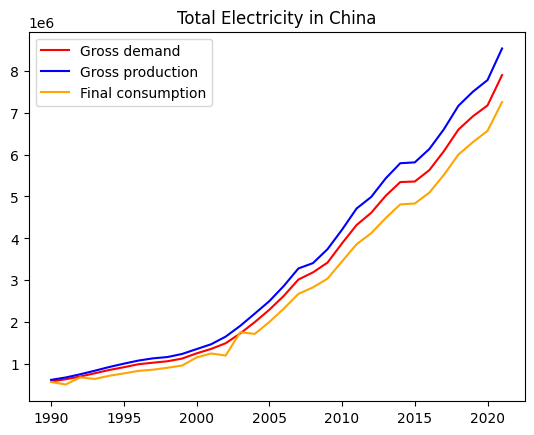

In [439]:
#Visualizing the data

x_China = China_df['Year']
y1_China = China_df['Gross demand']
y2_China = China_df['Gross production']
y3_China = China_df['Final consumption']

plt.plot(x_China, y1_China, color='red', label='Gross demand')
plt.plot(x_China, y2_China, color='blue', label='Gross production')
plt.plot(x_China, y3_China, color='orange', label='Final consumption')

plt.title('Total Electricity in China')
plt.legend()
plt.show()

In [440]:
China_demand_fig = px.line(China_df, x='Year', y='Gross demand', title='Gross demand of electricity in China')
China_production_fig = px.line(China_df, x='Year', y='Gross production', title='Gross production of electricity in China')
China_consumption_fig = px.line(China_df, x='Year', y='Final consumption', title='Final consumption of electricity in China')

China_demand_fig.show()
China_production_fig.show()
China_consumption_fig.show()

In [441]:
#China, Hong Kong SAR dataframe

China_HongKong_SAR_df = df.loc[df['Country'] == 'China, Hong Kong SAR']
China_HongKong_SAR_max_year = China_HongKong_SAR_df['Year'].max()
China_HongKong_SAR_min_year = China_HongKong_SAR_df['Year'].min()
China_HongKong_SAR_df_Years = np.arange(China_HongKong_SAR_min_year, China_HongKong_SAR_max_year+1, 1)

print(China_HongKong_SAR_df_Years.sum())
print(China_HongKong_SAR_df['Year'].sum())
print(China_HongKong_SAR_df_Years.sum() == China_HongKong_SAR_df['Year'].sum())
print(China_HongKong_SAR_df_Years)
print(np.array(China_HongKong_SAR_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


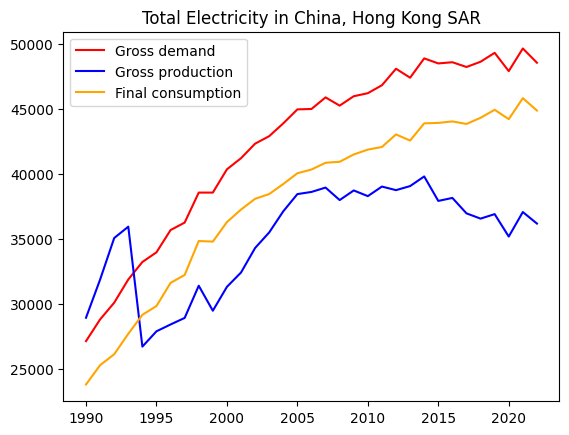

In [442]:
#Visualizing the data

x_China_HongKong_SAR = China_HongKong_SAR_df['Year']
y1_China_HongKong_SAR = China_HongKong_SAR_df['Gross demand']
y2_China_HongKong_SAR = China_HongKong_SAR_df['Gross production']
y3_China_HongKong_SAR = China_HongKong_SAR_df['Final consumption']

plt.plot(x_China_HongKong_SAR, y1_China_HongKong_SAR, color='red', label='Gross demand')
plt.plot(x_China_HongKong_SAR, y2_China_HongKong_SAR, color='blue', label='Gross production')
plt.plot(x_China_HongKong_SAR, y3_China_HongKong_SAR, color='orange', label='Final consumption')

plt.title('Total Electricity in China, Hong Kong SAR')
plt.legend()
plt.show()

In [443]:
China_HongKong_SAR_demand_fig = px.line(China_HongKong_SAR_df, x='Year', y='Gross demand', title='Gross demand of electricity in China, Hong Kong SAR')
China_HongKong_SAR_production_fig = px.line(China_HongKong_SAR_df, x='Year', y='Gross production', title='Gross production of electricity in China, Hong Kong SAR')
China_HongKong_SAR_consumption_fig = px.line(China_HongKong_SAR_df, x='Year', y='Final consumption', title='Final consumption of electricity in China, Hong Kong SAR')

China_HongKong_SAR_demand_fig.show()
China_HongKong_SAR_production_fig.show()
China_HongKong_SAR_consumption_fig.show()

In [444]:
#China, Macao SAR dataframe

China_Macao_SAR_df = df.loc[df['Country'] == 'China, Macao SAR']
China_Macao_SAR_max_year = China_Macao_SAR_df['Year'].max()
China_Macao_SAR_min_year = China_Macao_SAR_df['Year'].min()
China_Macao_SAR_df_Years = np.arange(China_Macao_SAR_min_year, China_Macao_SAR_max_year+1, 1)

print(China_Macao_SAR_df_Years.sum())
print(China_Macao_SAR_df['Year'].sum())
print(China_Macao_SAR_df_Years.sum() == China_Macao_SAR_df['Year'].sum())
print(China_Macao_SAR_df_Years)
print(np.array(China_Macao_SAR_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


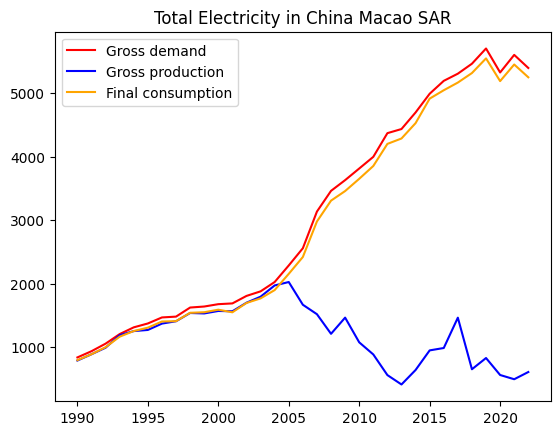

In [445]:
#Visualizing the data

x_China_Macao_SAR = China_Macao_SAR_df['Year']
y1_China_Macao_SAR = China_Macao_SAR_df['Gross demand']
y2_China_Macao_SAR = China_Macao_SAR_df['Gross production']
y3_China_Macao_SAR = China_Macao_SAR_df['Final consumption']

plt.plot(x_China_Macao_SAR, y1_China_Macao_SAR, color='red', label='Gross demand')
plt.plot(x_China_Macao_SAR, y2_China_Macao_SAR, color='blue', label='Gross production')
plt.plot(x_China_Macao_SAR, y3_China_Macao_SAR, color='orange', label='Final consumption')

plt.title('Total Electricity in China Macao SAR')
plt.legend()
plt.show()

In [446]:
China_Macao_SAR_demand_fig = px.line(China_Macao_SAR_df, x='Year', y='Gross demand', title='Gross demand of electricity in China Macao SAR')
China_Macao_SAR_production_fig = px.line(China_Macao_SAR_df, x='Year', y='Gross production', title='Gross production of electricity in China Macao SAR')
China_Macao_SAR_consumption_fig = px.line(China_Macao_SAR_df, x='Year', y='Final consumption', title='Final consumption of electricity in China Macao SAR')

China_Macao_SAR_demand_fig.show()
China_Macao_SAR_production_fig.show()
China_Macao_SAR_consumption_fig.show()

In [447]:
#Colombia dataframe

Colombia_df = df.loc[df['Country'] == 'Colombia']
Colombia_max_year = Colombia_df['Year'].max()
Colombia_min_year = Colombia_df['Year'].min()
Colombia_df_Years = np.arange(Colombia_min_year, Colombia_max_year+1, 1)

print(Colombia_df_Years.sum())
print(Colombia_df['Year'].sum())
print(Colombia_df_Years.sum() == Colombia_df['Year'].sum())
print(Colombia_df_Years)
print(np.array(Colombia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


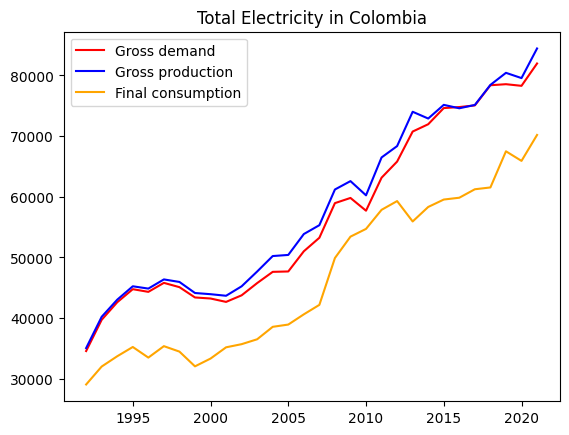

In [448]:
#Visualizing the data

x_Colombia = Colombia_df['Year']
y1_Colombia = Colombia_df['Gross demand']
y2_Colombia = Colombia_df['Gross production']
y3_Colombia = Colombia_df['Final consumption']

plt.plot(x_Colombia, y1_Colombia, color='red', label='Gross demand')
plt.plot(x_Colombia, y2_Colombia, color='blue', label='Gross production')
plt.plot(x_Colombia, y3_Colombia, color='orange', label='Final consumption')

plt.title('Total Electricity in Colombia')
plt.legend()
plt.show()

In [449]:
Colombia_demand_fig = px.line(Colombia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Colombia')
Colombia_production_fig = px.line(Colombia_df, x='Year', y='Gross production', title='Gross production of electricity in Colombia')
Colombia_consumption_fig = px.line(Colombia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Colombia')

Colombia_demand_fig.show()
Colombia_production_fig.show()
Colombia_consumption_fig.show()

In [450]:
#Congo dataframe

Congo_df = df.loc[df['Country'] == 'Congo']
Congo_max_year = Congo_df['Year'].max()
Congo_min_year = Congo_df['Year'].min()
Congo_df_Years = np.arange(Congo_min_year, Congo_max_year+1, 1)

print(Congo_df_Years.sum())
print(Congo_df['Year'].sum())
print(Congo_df_Years.sum() == Congo_df['Year'].sum())
print(Congo_df_Years)
print(np.array(Congo_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


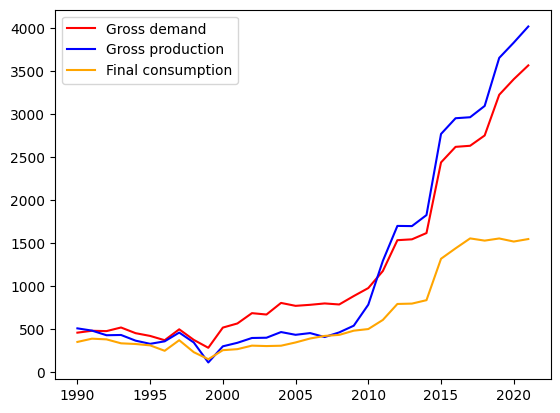

In [451]:
#Visualizing the data

x_Congo = Congo_df['Year']
y1_Congo = Congo_df['Gross demand']
y2_Congo = Congo_df['Gross production']
y3_Congo = Congo_df['Final consumption']

plt.plot(x_Congo, y1_Congo, color='red', label='Gross demand')
plt.plot(x_Congo, y2_Congo, color='blue', label='Gross production')
plt.plot(x_Congo, y3_Congo, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [452]:
Congo_demand_fig = px.line(Congo_df, x='Year', y='Gross demand', title='Gross demand of electricity in Congo')
Congo_production_fig = px.line(Congo_df, x='Year', y='Gross production', title='Gross production of electricity in Congo')
Congo_consumption_fig = px.line(Congo_df, x='Year', y='Final consumption', title='Final consumption of electricity in Congo')

Congo_demand_fig.show()
Congo_production_fig.show()
Congo_consumption_fig.show()

In [453]:
#Costa Rica dataframe

Costa_Rica_df = df.loc[df['Country'] == 'Costa Rica']
Costa_Rica_max_year = Costa_Rica_df['Year'].max()
Costa_Rica_min_year = Costa_Rica_df['Year'].min()
Costa_Rica_df_Years = np.arange(Costa_Rica_min_year, Costa_Rica_max_year+1, 1)

print(Costa_Rica_df_Years.sum())
print(Costa_Rica_df['Year'].sum())
print(Costa_Rica_df_Years.sum() == Costa_Rica_df['Year'].sum())
print(Costa_Rica_df_Years)
print(np.array(Costa_Rica_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


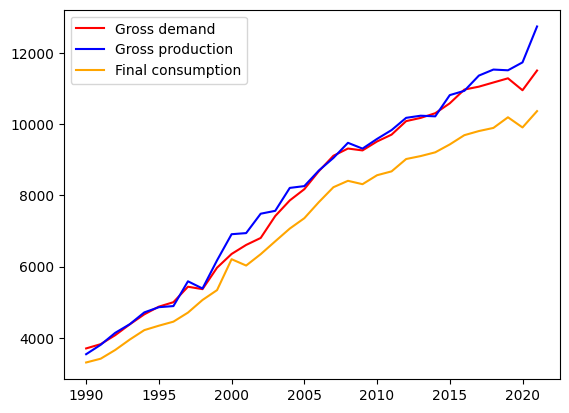

In [454]:
#Visualizing the data

x_Costa_Rica = Costa_Rica_df['Year']
y1_Costa_Rica = Costa_Rica_df['Gross demand']
y2_Costa_Rica = Costa_Rica_df['Gross production']
y3_Costa_Rica = Costa_Rica_df['Final consumption']

plt.plot(x_Costa_Rica, y1_Costa_Rica, color='red', label='Gross demand')
plt.plot(x_Costa_Rica, y2_Costa_Rica, color='blue', label='Gross production')
plt.plot(x_Costa_Rica, y3_Costa_Rica, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [455]:
Costa_Rica_demand_fig = px.line(Costa_Rica_df, x='Year', y='Gross demand', title='Gross demand of electricity in Costa_Rica')
Costa_Rica_production_fig = px.line(Costa_Rica_df, x='Year', y='Gross production', title='Gross production of electricity in Costa_Rica')
Costa_Rica_consumption_fig = px.line(Costa_Rica_df, x='Year', y='Final consumption', title='Final consumption of electricity in Costa_Rica')

Costa_Rica_demand_fig.show()
Costa_Rica_production_fig.show()
Costa_Rica_consumption_fig.show()

In [456]:
#Côte d'Ivoire dataframe

Ivory_Coast_df = df.loc[df['Country'] == "Côte d'Ivoire"]
Ivory_Coast_max_year = Ivory_Coast_df['Year'].max()
Ivory_Coast_min_year = Ivory_Coast_df['Year'].min()
Ivory_Coast_df_Years = np.arange(Ivory_Coast_min_year, Ivory_Coast_max_year+1, 1)

print(Ivory_Coast_df_Years.sum())
print(Ivory_Coast_df['Year'].sum())
print(Ivory_Coast_df_Years.sum() == Ivory_Coast_df['Year'].sum())
print(Ivory_Coast_df_Years)
print(np.array(Ivory_Coast_df['Year'].sort_values(ascending=True)))

54216
54216
True
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


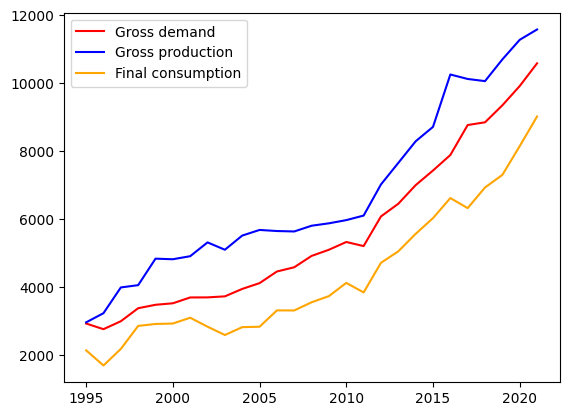

In [457]:
#Visualizing the data

x_Ivory_Coast = Ivory_Coast_df['Year']
y1_Ivory_Coast = Ivory_Coast_df['Gross demand']
y2_Ivory_Coast = Ivory_Coast_df['Gross production']
y3_Ivory_Coast = Ivory_Coast_df['Final consumption']

plt.plot(x_Ivory_Coast, y1_Ivory_Coast, color='red', label='Gross demand')
plt.plot(x_Ivory_Coast, y2_Ivory_Coast, color='blue', label='Gross production')
plt.plot(x_Ivory_Coast, y3_Ivory_Coast, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [458]:
Ivory_Coast_demand_fig = px.line(Ivory_Coast_df, x='Year', y='Gross demand', title="Gross demand of electricity in Côte d'Ivoire")
Ivory_Coast_production_fig = px.line(Ivory_Coast_df, x='Year', y='Gross production', title="Gross production of electricity in Côte d'Ivoire")
Ivory_Coast_consumption_fig = px.line(Ivory_Coast_df, x='Year', y='Final consumption', title="Final consumption of electricity in Côte d'Ivoire")

Ivory_Coast_demand_fig.show()
Ivory_Coast_production_fig.show()
Ivory_Coast_consumption_fig.show()

In [459]:
#Croatia dataframe

Croatia_df = df.loc[df['Country'] == 'Croatia']
Croatia_max_year = Croatia_df['Year'].max()
Croatia_min_year = Croatia_df['Year'].min()
Croatia_df_Years = np.arange(Croatia_min_year, Croatia_max_year+1, 1)

print(Croatia_df_Years.sum())
print(Croatia_df['Year'].sum())
print(Croatia_df_Years.sum() == Croatia_df['Year'].sum())
print(Croatia_df_Years)
print(np.array(Croatia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


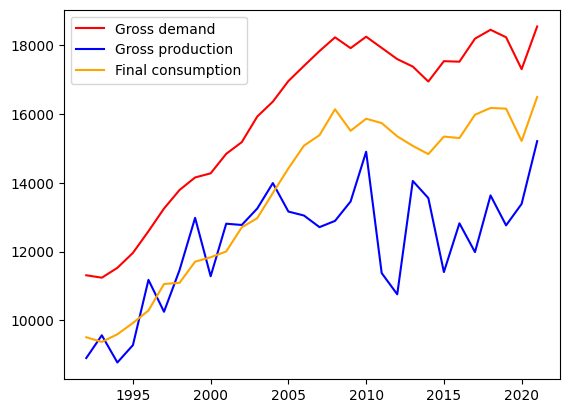

In [460]:
#Visualizing the data

x_Croatia = Croatia_df['Year']
y1_Croatia = Croatia_df['Gross demand']
y2_Croatia = Croatia_df['Gross production']
y3_Croatia = Croatia_df['Final consumption']

plt.plot(x_Croatia, y1_Croatia, color='red', label='Gross demand')
plt.plot(x_Croatia, y2_Croatia, color='blue', label='Gross production')
plt.plot(x_Croatia, y3_Croatia, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [461]:
Croatia_demand_fig = px.line(Croatia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Croatia')
Croatia_production_fig = px.line(Croatia_df, x='Year', y='Gross production', title='Gross production of electricity in Croatia')
Croatia_consumption_fig = px.line(Croatia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Croatia')

Croatia_demand_fig.show()
Croatia_production_fig.show()
Croatia_consumption_fig.show()

In [462]:
#Cuba dataframe

Cuba_df = df.loc[df['Country'] == 'Cuba']
Cuba_max_year = Cuba_df['Year'].max()
Cuba_min_year = Cuba_df['Year'].min()
Cuba_df_Years = np.arange(Cuba_min_year, Cuba_max_year+1, 1)

print(Cuba_df_Years.sum())
print(Cuba_df['Year'].sum())
print(Cuba_df_Years.sum() == Cuba_df['Year'].sum())
print(Cuba_df_Years)
print(np.array(Cuba_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


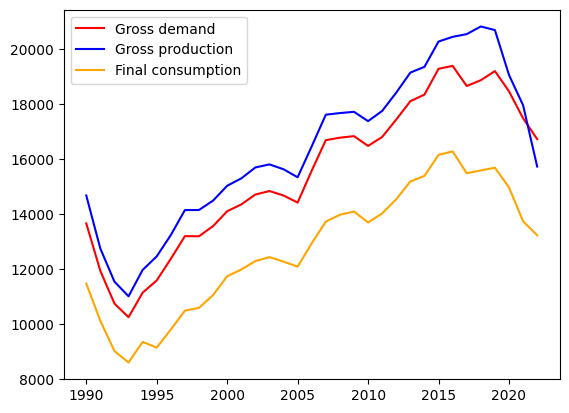

In [463]:
#Visualizing the data

x_Cuba = Cuba_df['Year']
y1_Cuba = Cuba_df['Gross demand']
y2_Cuba = Cuba_df['Gross production']
y3_Cuba = Cuba_df['Final consumption']

plt.plot(x_Cuba, y1_Cuba, color='red', label='Gross demand')
plt.plot(x_Cuba, y2_Cuba, color='blue', label='Gross production')
plt.plot(x_Cuba, y3_Cuba, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [464]:
Cuba_demand_fig = px.line(Cuba_df, x='Year', y='Gross demand', title='Gross demand of electricity in Cuba')
Cuba_production_fig = px.line(Cuba_df, x='Year', y='Gross production', title='Gross production of electricity in Cuba')
Cuba_consumption_fig = px.line(Cuba_df, x='Year', y='Final consumption', title='Final consumption of electricity in Cuba')

Cuba_demand_fig.show()
Cuba_production_fig.show()
Cuba_consumption_fig.show()

In [465]:
#Cyprus dataframe

Cyprus_df = df.loc[df['Country'] == 'Cyprus']
Cyprus_max_year = Cyprus_df['Year'].max()
Cyprus_min_year = Cyprus_df['Year'].min()
Cyprus_df_Years = np.arange(Cyprus_min_year, Cyprus_max_year+1, 1)

print(Cyprus_df_Years.sum())
print(Cyprus_df['Year'].sum())
print(Cyprus_df_Years.sum() == Cyprus_df['Year'].sum())
print(Cyprus_df_Years)
print(np.array(Cyprus_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


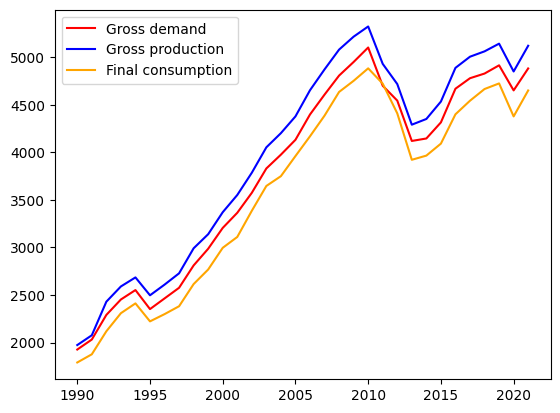

In [466]:
#Visualizing the data

x_Cyprus = Cyprus_df['Year']
y1_Cyprus = Cyprus_df['Gross demand']
y2_Cyprus = Cyprus_df['Gross production']
y3_Cyprus = Cyprus_df['Final consumption']

plt.plot(x_Cyprus, y1_Cyprus, color='red', label='Gross demand')
plt.plot(x_Cyprus, y2_Cyprus, color='blue', label='Gross production')
plt.plot(x_Cyprus, y3_Cyprus, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [467]:
Cyprus_demand_fig = px.line(Cyprus_df, x='Year', y='Gross demand', title='Gross demand of electricity in Cyprus')
Cyprus_production_fig = px.line(Cyprus_df, x='Year', y='Gross production', title='Gross production of electricity in Cyprus')
Cyprus_consumption_fig = px.line(Cyprus_df, x='Year', y='Final consumption', title='Final consumption of electricity in Cyprus')

Cyprus_demand_fig.show()
Cyprus_production_fig.show()
Cyprus_consumption_fig.show()

In [468]:
#Czechia dataframe

Czechia_df = df.loc[df['Country'] == 'Czechia']
Czechia_max_year = Czechia_df['Year'].max()
Czechia_min_year = Czechia_df['Year'].min()
Czechia_df_Years = np.arange(Czechia_min_year, Czechia_max_year+1, 1)

print(Czechia_df_Years.sum())
print(Czechia_df['Year'].sum())
print(Czechia_df_Years.sum() == Czechia_df['Year'].sum())
print(Czechia_df_Years)
print(np.array(Czechia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


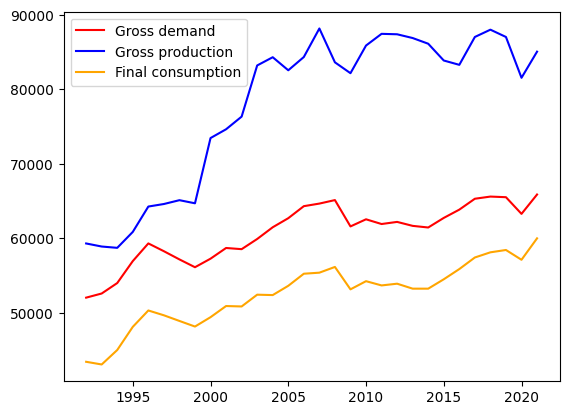

In [469]:
#Visualizing the data

x_Czechia = Czechia_df['Year']
y1_Czechia = Czechia_df['Gross demand']
y2_Czechia = Czechia_df['Gross production']
y3_Czechia = Czechia_df['Final consumption']

plt.plot(x_Czechia, y1_Czechia, color='red', label='Gross demand')
plt.plot(x_Czechia, y2_Czechia, color='blue', label='Gross production')
plt.plot(x_Czechia, y3_Czechia, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [470]:
Czechia_demand_fig = px.line(Czechia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Czechia')
Czechia_production_fig = px.line(Czechia_df, x='Year', y='Gross production', title='Gross production of electricity in Czechia')
Czechia_consumption_fig = px.line(Czechia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Czechia')

Czechia_demand_fig.show()
Czechia_production_fig.show()
Czechia_consumption_fig.show()

In [471]:
#Dem. Rep. of the Congo dataframe

DRC_df = df.loc[df['Country'] == 'Dem. Rep. of the Congo']
DRC_max_year = DRC_df['Year'].max()
DRC_min_year = DRC_df['Year'].min()
DRC_df_Years = np.arange(DRC_min_year, DRC_max_year+1, 1)

print(DRC_df_Years.sum())
print(DRC_df['Year'].sum())
print(DRC_df_Years.sum() == DRC_df['Year'].sum())
print(DRC_df_Years)
print(np.array(DRC_df['Year'].sort_values(ascending=True)))

60135
50064
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2016 2018 2019]


In [472]:
#Denmark dataframe

Denmark_df = df.loc[df['Country'] == 'Denmark']
Denmark_max_year = Denmark_df['Year'].max()
Denmark_min_year = Denmark_df['Year'].min()
Denmark_df_Years = np.arange(Denmark_min_year, Denmark_max_year+1, 1)

print(Denmark_df_Years.sum())
print(Denmark_df['Year'].sum())
print(Denmark_df_Years.sum() == Denmark_df['Year'].sum())
print(Denmark_df_Years)
print(np.array(Denmark_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


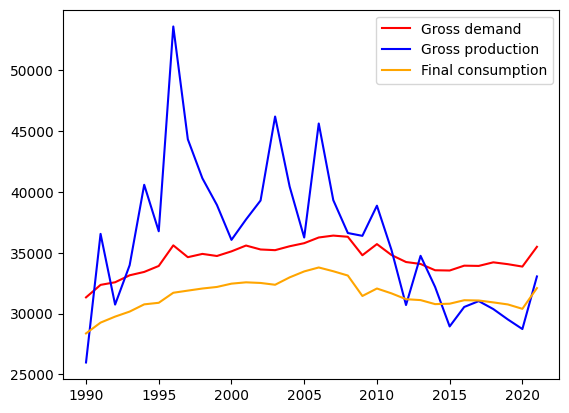

In [473]:
#Visualizing the data

x_Denmark = Denmark_df['Year']
y1_Denmark = Denmark_df['Gross demand']
y2_Denmark = Denmark_df['Gross production']
y3_Denmark = Denmark_df['Final consumption']

plt.plot(x_Denmark, y1_Denmark, color='red', label='Gross demand')
plt.plot(x_Denmark, y2_Denmark, color='blue', label='Gross production')
plt.plot(x_Denmark, y3_Denmark, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [474]:
Denmark_demand_fig = px.line(Denmark_df, x='Year', y='Gross demand', title='Gross demand of electricity in Denmark')
Denmark_production_fig = px.line(Denmark_df, x='Year', y='Gross production', title='Gross production of electricity in Denmark')
Denmark_consumption_fig = px.line(Denmark_df, x='Year', y='Final consumption', title='Final consumption of electricity in Denmark')

Denmark_demand_fig.show()
Denmark_production_fig.show()
Denmark_consumption_fig.show()

In [475]:
#Dominican Republic

Dominican_Republic_df = df.loc[df['Country'] == 'Dominican Republic']
Dominican_Republic_max_year = Dominican_Republic_df['Year'].max()
Dominican_Republic_min_year = Dominican_Republic_df['Year'].min()
Dominican_Republic_df_Years = np.arange(Dominican_Republic_min_year, Dominican_Republic_max_year+1, 1)

print(Dominican_Republic_df_Years.sum())
print(Dominican_Republic_df['Year'].sum())
print(Dominican_Republic_df_Years.sum() == Dominican_Republic_df['Year'].sum())
print(Dominican_Republic_df_Years)
print(np.array(Dominican_Republic_df['Year'].sort_values(ascending=True)))

58203
58203
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021]


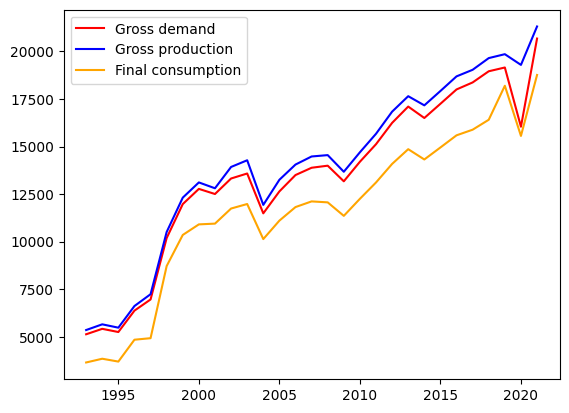

In [476]:
#Visualizing the data

x_Dominican_Republic = Dominican_Republic_df['Year']
y1_Dominican_Republic = Dominican_Republic_df['Gross demand']
y2_Dominican_Republic = Dominican_Republic_df['Gross production']
y3_Dominican_Republic = Dominican_Republic_df['Final consumption']

plt.plot(x_Dominican_Republic, y1_Dominican_Republic, color='red', label='Gross demand')
plt.plot(x_Dominican_Republic, y2_Dominican_Republic, color='blue', label='Gross production')
plt.plot(x_Dominican_Republic, y3_Dominican_Republic, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [477]:
Dominican_Republic_demand_fig = px.line(Dominican_Republic_df, x='Year', y='Gross demand', title='Gross demand of electricity in Dominican Republic')
Dominican_Republic_production_fig = px.line(Dominican_Republic_df, x='Year', y='Gross production', title='Gross production of electricity in Dominican Republic')
Dominican_Republic_consumption_fig = px.line(Dominican_Republic_df, x='Year', y='Final consumption', title='Final consumption of electricity in Dominican Republic')

Dominican_Republic_demand_fig.show()
Dominican_Republic_production_fig.show()
Dominican_Republic_consumption_fig.show()

In [478]:
#Ecuador dataframe

Ecuador_df = df.loc[df['Country'] == 'Ecuador']
Ecuador_max_year = Ecuador_df['Year'].max()
Ecuador_min_year = Ecuador_df['Year'].min()
Ecuador_df_Years = np.arange(Ecuador_min_year, Ecuador_max_year+1, 1)

print(Ecuador_df_Years.sum())
print(Ecuador_df['Year'].sum())
print(Ecuador_df_Years.sum() == Ecuador_df['Year'].sum())
print(Ecuador_df_Years)
print(np.array(Ecuador_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


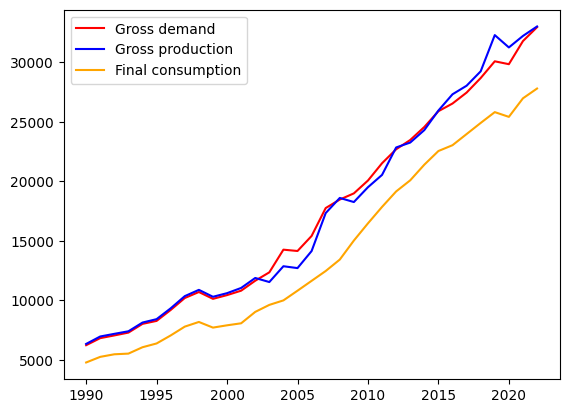

In [479]:
#Visualizing the data

x_Ecuador = Ecuador_df['Year']
y1_Ecuador = Ecuador_df['Gross demand']
y2_Ecuador = Ecuador_df['Gross production']
y3_Ecuador = Ecuador_df['Final consumption']

plt.plot(x_Ecuador, y1_Ecuador, color='red', label='Gross demand')
plt.plot(x_Ecuador, y2_Ecuador, color='blue', label='Gross production')
plt.plot(x_Ecuador, y3_Ecuador, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [480]:
Ecuador_demand_fig = px.line(Ecuador_df, x='Year', y='Gross demand', title='Gross demand of electricity in Ecuador')
Ecuador_production_fig = px.line(Ecuador_df, x='Year', y='Gross production', title='Gross production of electricity in Ecuador')
Ecuador_consumption_fig = px.line(Ecuador_df, x='Year', y='Final consumption', title='Final consumption of electricity in Ecuador')

Ecuador_demand_fig.show()
Ecuador_production_fig.show()
Ecuador_consumption_fig.show()

In [481]:
#Egypt dataframe

Egypt_df = df.loc[df['Country'] == 'Egypt']
Egypt_max_year = Egypt_df['Year'].max()
Egypt_min_year = Egypt_df['Year'].min()
Egypt_df_Years = np.arange(Egypt_min_year, Egypt_max_year+1, 1)

print(Egypt_df_Years.sum())
print(Egypt_df['Year'].sum())
print(Egypt_df_Years.sum() == Egypt_df['Year'].sum())
print(Egypt_df_Years)
print(np.array(Egypt_df['Year'].sort_values(ascending=True)))

58203
58203
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021]


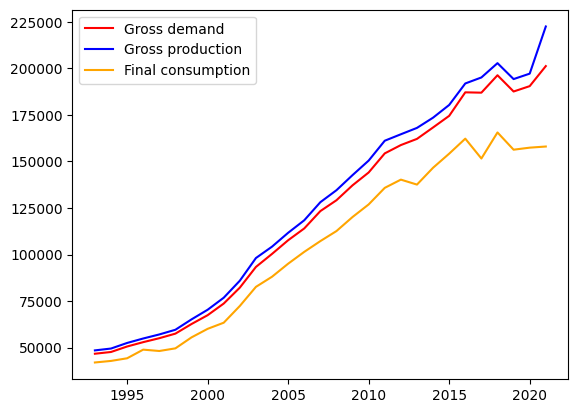

In [482]:
#Visualizing the data

x_Egypt = Egypt_df['Year']
y1_Egypt = Egypt_df['Gross demand']
y2_Egypt = Egypt_df['Gross production']
y3_Egypt = Egypt_df['Final consumption']

plt.plot(x_Egypt, y1_Egypt, color='red', label='Gross demand')
plt.plot(x_Egypt, y2_Egypt, color='blue', label='Gross production')
plt.plot(x_Egypt, y3_Egypt, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [483]:
#Visualizing the data

Egypt_demand_fig = px.line(Egypt_df, x='Year', y='Gross demand', title='Gross demand of electricity in Egypt')
Egypt_production_fig = px.line(Egypt_df, x='Year', y='Gross production', title='Gross production of electricity in Egypt')
Egypt_consumption_fig = px.line(Egypt_df, x='Year', y='Final consumption', title='Final consumption of electricity in Egypt')

Egypt_demand_fig.show()
Egypt_production_fig.show()
Egypt_consumption_fig.show()

In [484]:
#El Salvador dataframe

El_Salvador_df = df.loc[df['Country'] == 'El Salvador']
El_Salvador_max_year = El_Salvador_df['Year'].max()
El_Salvador_min_year = El_Salvador_df['Year'].min()
El_Salvador_df_Years = np.arange(El_Salvador_min_year, El_Salvador_max_year+1, 1)

print(El_Salvador_df_Years.sum())
print(El_Salvador_df['Year'].sum())
print(El_Salvador_df_Years.sum() == El_Salvador_df['Year'].sum())
print(El_Salvador_df_Years)
print(np.array(El_Salvador_df['Year'].sort_values(ascending=True)))

64176
60147
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2016 2017 2018 2019
 2020 2021]


In [485]:
#Eritrea dataframe

Eritrea_df = df.loc[df['Country'] == 'Eritrea']
Eritrea_max_year = Eritrea_df['Year'].max()
Eritrea_min_year = Eritrea_df['Year'].min()
Eritrea_df_Years = np.arange(Eritrea_min_year, Eritrea_max_year+1, 1)

print(Eritrea_df_Years.sum())
print(Eritrea_df['Year'].sum())
print(Eritrea_df_Years.sum() == Eritrea_df['Year'].sum())
print(Eritrea_df_Years)
print(np.array(Eritrea_df['Year'].sort_values(ascending=True)))

56210
56210
True
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


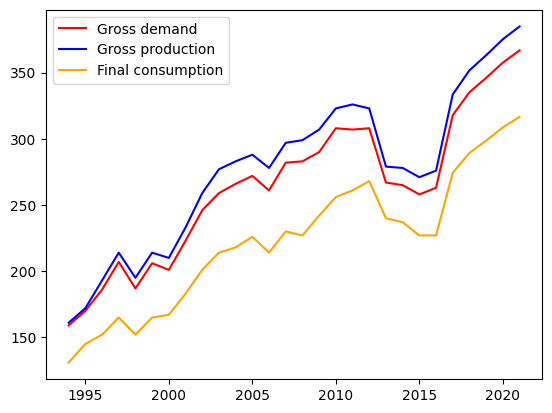

In [486]:
#Visualizing the data

x_Eritrea = Eritrea_df['Year']
y1_Eritrea = Eritrea_df['Gross demand']
y2_Eritrea = Eritrea_df['Gross production']
y3_Eritrea = Eritrea_df['Final consumption']

plt.plot(x_Eritrea, y1_Eritrea, color='red', label='Gross demand')
plt.plot(x_Eritrea, y2_Eritrea, color='blue', label='Gross production')
plt.plot(x_Eritrea, y3_Eritrea, color='orange', label='Final consumption')

plt.legend()
plt.show()

In [487]:
Eritrea_demand_fig = px.line(Eritrea_df, x='Year', y='Gross demand', title='Gross demand of electricity in Eritrea')
Eritrea_production_fig = px.line(Eritrea_df, x='Year', y='Gross production', title='Gross production of electricity in Eritrea')
Eritrea_consumption_fig = px.line(Eritrea_df, x='Year', y='Final consumption', title='Final consumption of electricity in Eritrea')

Eritrea_demand_fig.show()
Eritrea_production_fig.show()
Eritrea_consumption_fig.show()

In [488]:
#Estonia dataframe

Estonia_df = df.loc[df['Country'] == 'Estonia']
Estonia_max_year = Estonia_df['Year'].max()
Estonia_min_year = Estonia_df['Year'].min()
Estonia_df_Years = np.arange(Estonia_min_year, Estonia_max_year+1, 1)

print(Estonia_df_Years.sum())
print(Estonia_df['Year'].sum())
print(Estonia_df_Years.sum() == Estonia_df['Year'].sum())
print(Estonia_df_Years)
print(np.array(Estonia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


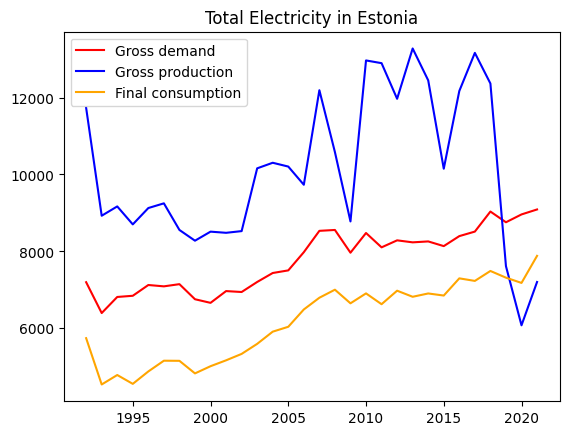

In [489]:
#Visualizing the data

x_Estonia = Estonia_df['Year']
y1_Estonia = Estonia_df['Gross demand']
y2_Estonia = Estonia_df['Gross production']
y3_Estonia = Estonia_df['Final consumption']

plt.plot(x_Estonia, y1_Estonia, color='red', label='Gross demand')
plt.plot(x_Estonia, y2_Estonia, color='blue', label='Gross production')
plt.plot(x_Estonia, y3_Estonia, color='orange', label='Final consumption')

plt.title('Total Electricity in Estonia')
plt.legend()
plt.show()

In [490]:
Estonia_demand_fig = px.line(Estonia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Estonia')
Estonia_production_fig = px.line(Estonia_df, x='Year', y='Gross production', title='Gross production of electricity in Estonia')
Estonia_consumption_fig = px.line(Estonia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Estonia')

Estonia_demand_fig.show()
Estonia_production_fig.show()
Estonia_consumption_fig.show()

In [491]:
#Ethiopia dataframe

Ethiopia_df = df.loc[df['Country'] == 'Ethiopia']
Ethiopia_max_year = Ethiopia_df['Year'].max()
Ethiopia_min_year = Ethiopia_df['Year'].min()
Ethiopia_df_Years = np.arange(Ethiopia_min_year, Ethiopia_max_year+1, 1)

print(Ethiopia_df_Years.sum())
print(Ethiopia_df['Year'].sum())
print(Ethiopia_df_Years.sum() == Ethiopia_df['Year'].sum())
print(Ethiopia_df_Years)
print(np.array(Ethiopia_df['Year'].sort_values(ascending=True)))

56210
56210
True
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


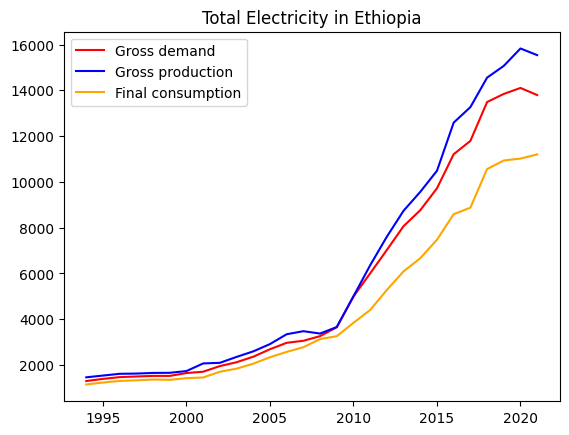

In [492]:
#Visualizing the data

x_Ethiopia = Ethiopia_df['Year']
y1_Ethiopia = Ethiopia_df['Gross demand']
y2_Ethiopia = Ethiopia_df['Gross production']
y3_Ethiopia = Ethiopia_df['Final consumption']

plt.plot(x_Ethiopia, y1_Ethiopia, color='red', label='Gross demand')
plt.plot(x_Ethiopia, y2_Ethiopia, color='blue', label='Gross production')
plt.plot(x_Ethiopia, y3_Ethiopia, color='orange', label='Final consumption')

plt.title('Total Electricity in Ethiopia')
plt.legend()
plt.show()

In [493]:
Ethiopia_demand_fig = px.line(Ethiopia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Ethiopia')
Ethiopia_production_fig = px.line(Ethiopia_df, x='Year', y='Gross production', title='Gross production of electricity in Ethiopia')
Ethiopia_consumption_fig = px.line(Ethiopia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Ethiopia')

Ethiopia_demand_fig.show()
Ethiopia_production_fig.show()
Ethiopia_consumption_fig.show()

In [494]:
#Fiji dataframe

Fiji_df = df.loc[df['Country'] == 'Fiji']
Fiji_max_year = Fiji_df['Year'].max()
Fiji_min_year = Fiji_df['Year'].min()
Fiji_df_Years = np.arange(Fiji_min_year, Fiji_max_year+1, 1)

print(Fiji_df_Years.sum())
print(Fiji_df['Year'].sum())
print(Fiji_df_Years.sum() == Fiji_df['Year'].sum())
print(Fiji_df_Years)
print(np.array(Fiji_df['Year'].sort_values(ascending=True)))

62155
44200
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020]
[1990 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2019 2020]


In [495]:
#Finland dataframe

Finland_df = df.loc[df['Country'] == 'Finland']
Finland_max_year = Finland_df['Year'].max()
Finland_min_year = Finland_df['Year'].min()
Finland_df_Years = np.arange(Finland_min_year, Finland_max_year+1, 1)

print(Finland_df_Years.sum())
print(Finland_df['Year'].sum())
print(Finland_df_Years.sum() == Finland_df['Year'].sum())
print(Finland_df_Years)
print(np.array(Finland_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


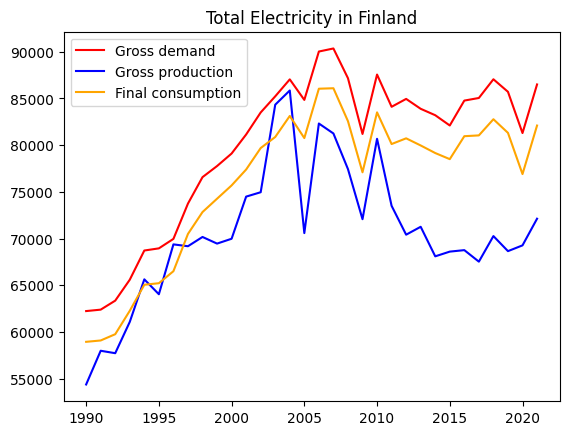

In [496]:
#Visualizing the data

x_Finland = Finland_df['Year']
y1_Finland = Finland_df['Gross demand']
y2_Finland = Finland_df['Gross production']
y3_Finland = Finland_df['Final consumption']

plt.plot(x_Finland, y1_Finland, color='red', label='Gross demand')
plt.plot(x_Finland, y2_Finland, color='blue', label='Gross production')
plt.plot(x_Finland, y3_Finland, color='orange', label='Final consumption')

plt.title('Total Electricity in Finland')
plt.legend()
plt.show()

In [497]:
Finland_demand_fig = px.line(Finland_df, x='Year', y='Gross demand', title='Gross demand of electricity in Finland')
Finland_production_fig = px.line(Finland_df, x='Year', y='Gross production', title='Gross production of electricity in Finland')
Finland_consumption_fig = px.line(Finland_df, x='Year', y='Final consumption', title='Final consumption of electricity in Finland')

Finland_demand_fig.show()
Finland_production_fig.show()
Finland_consumption_fig.show()

In [498]:
#France dataframe

France_df = df.loc[df['Country'] == 'France']
France_max_year = France_df['Year'].max()
France_min_year = France_df['Year'].min()
France_df_Years = np.arange(France_min_year, France_max_year+1, 1)

print(France_df_Years.sum())
print(France_df['Year'].sum())
print(France_df_Years.sum() == France_df['Year'].sum())
print(France_df_Years)
print(np.array(France_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


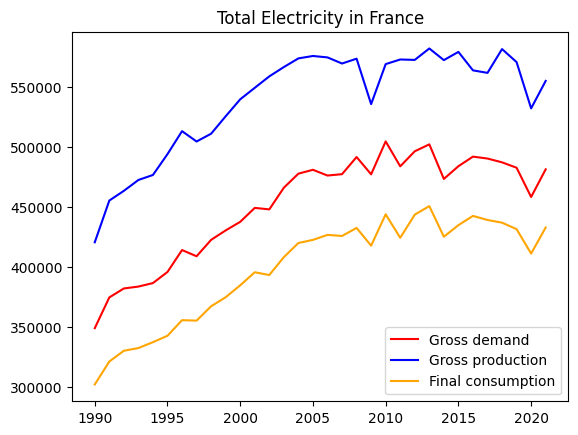

In [499]:
#Visualizing the data

x_France = France_df['Year']
y1_France = France_df['Gross demand']
y2_France = France_df['Gross production']
y3_France = France_df['Final consumption']

plt.plot(x_France, y1_France, color='red', label='Gross demand')
plt.plot(x_France, y2_France, color='blue', label='Gross production')
plt.plot(x_France, y3_France, color='orange', label='Final consumption')

plt.title('Total Electricity in France')
plt.legend()
plt.show()

In [500]:
France_demand_fig = px.line(France_df, x='Year', y='Gross demand', title='Gross demand of electricity in France')
France_production_fig = px.line(France_df, x='Year', y='Gross production', title='Gross production of electricity in France')
France_consumption_fig = px.line(France_df, x='Year', y='Final consumption', title='Final consumption of electricity in France')

France_demand_fig.show()
France_production_fig.show()
France_consumption_fig.show()

In [501]:
#Gabon dataframe

Gabon_df = df.loc[df['Country'] == 'Gabon']
Gabon_max_year = Gabon_df['Year'].max()
Gabon_min_year = Gabon_df['Year'].min()
Gabon_df_Years = np.arange(Gabon_min_year, Gabon_max_year+1, 1)

print(Gabon_df_Years.sum())
print(Gabon_df['Year'].sum())
print(Gabon_df_Years.sum() == Gabon_df['Year'].sum())
print(Gabon_df_Years)
print(np.array(Gabon_df['Year'].sort_values(ascending=True)))

56210
56210
True
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


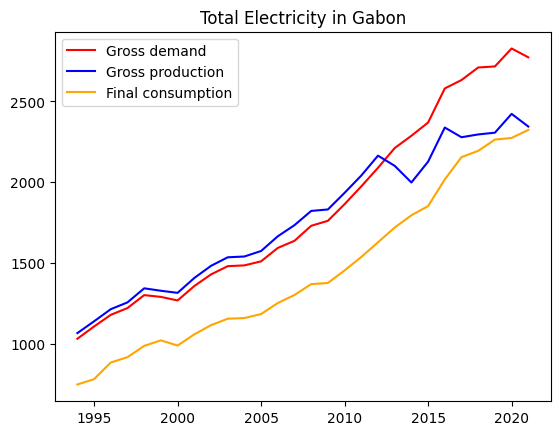

In [502]:
#Visualizing the data

x_Gabon = Gabon_df['Year']
y1_Gabon = Gabon_df['Gross demand']
y2_Gabon = Gabon_df['Gross production']
y3_Gabon = Gabon_df['Final consumption']

plt.plot(x_Gabon, y1_Gabon, color='red', label='Gross demand')
plt.plot(x_Gabon, y2_Gabon, color='blue', label='Gross production')
plt.plot(x_Gabon, y3_Gabon, color='orange', label='Final consumption')

plt.title('Total Electricity in Gabon')
plt.legend()
plt.show()

In [503]:
Gabon_demand_fig = px.line(Gabon_df, x='Year', y='Gross demand', title='Gross demand of electricity in Gabon')
Gabon_production_fig = px.line(Gabon_df, x='Year', y='Gross production', title='Gross production of electricity in Gabon')
Gabon_consumption_fig = px.line(Gabon_df, x='Year', y='Final consumption', title='Final consumption of electricity in Gabon')

Gabon_demand_fig.show()
Gabon_production_fig.show()
Gabon_consumption_fig.show()

In [504]:
#Georgia dataframe

Georgia_df = df.loc[df['Country'] == 'Georgia']
Georgia_max_year = Georgia_df['Year'].max()
Georgia_min_year = Georgia_df['Year'].min()
Georgia_df_Years = np.arange(Georgia_min_year, Georgia_max_year+1, 1)

print(Georgia_df_Years.sum())
print(Georgia_df['Year'].sum())
print(Georgia_df_Years.sum() == Georgia_df['Year'].sum())
print(Georgia_df_Years)
print(np.array(Georgia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


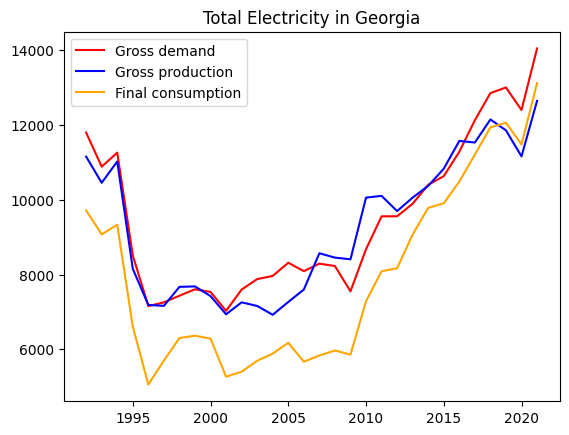

In [505]:
#Visualizing the data

x_Georgia = Georgia_df['Year']
y1_Georgia = Georgia_df['Gross demand']
y2_Georgia = Georgia_df['Gross production']
y3_Georgia = Georgia_df['Final consumption']

plt.plot(x_Georgia, y1_Georgia, color='red', label='Gross demand')
plt.plot(x_Georgia, y2_Georgia, color='blue', label='Gross production')
plt.plot(x_Georgia, y3_Georgia, color='orange', label='Final consumption')

plt.title('Total Electricity in Georgia')
plt.legend()
plt.show()

In [506]:
Georgia_demand_fig = px.line(Georgia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Georgia')
Georgia_production_fig = px.line(Georgia_df, x='Year', y='Gross production', title='Gross production of electricity in Georgia')
Georgia_consumption_fig = px.line(Georgia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Georgia')

Georgia_demand_fig.show()
Georgia_production_fig.show()
Georgia_consumption_fig.show()

In [507]:
#Germany dataframe

Germany_df = df.loc[df['Country'] == 'Germany']
Germany_max_year = Germany_df['Year'].max()
Germany_min_year = Germany_df['Year'].min()
Germany_df_Years = np.arange(Germany_min_year, Germany_max_year+1, 1)

print(Germany_df_Years.sum())
print(Germany_df['Year'].sum())
print(Germany_df_Years.sum() == Germany_df['Year'].sum())
print(Germany_df_Years)
print(np.array(Germany_df['Year'].sort_values(ascending=True)))

62186
62186
True
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


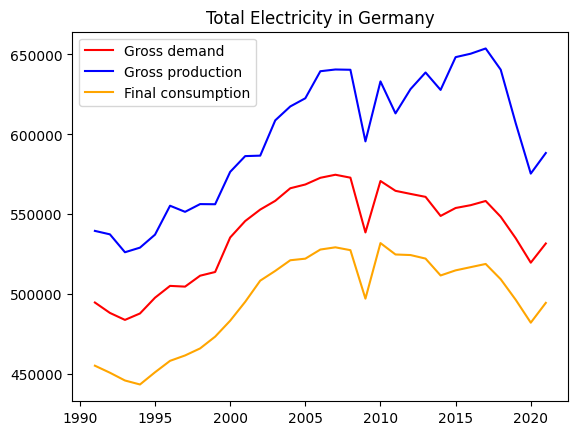

In [508]:
#Visualizing the data

x_Germany = Germany_df['Year']
y1_Germany = Germany_df['Gross demand']
y2_Germany = Germany_df['Gross production']
y3_Germany = Germany_df['Final consumption']

plt.plot(x_Germany, y1_Germany, color='red', label='Gross demand')
plt.plot(x_Germany, y2_Germany, color='blue', label='Gross production')
plt.plot(x_Germany, y3_Germany, color='orange', label='Final consumption')

plt.title('Total Electricity in Germany')
plt.legend()
plt.show()

In [509]:
Germany_demand_fig = px.line(Germany_df, x='Year', y='Gross demand', title='Gross demand of electricity in Germany')
Germany_production_fig = px.line(Germany_df, x='Year', y='Gross production', title='Gross production of electricity in Germany')
Germany_consumption_fig = px.line(Germany_df, x='Year', y='Final consumption', title='Final consumption of electricity in Germany')

Germany_demand_fig.show()
Germany_production_fig.show()
Germany_consumption_fig.show()

In [510]:
#Ghana dataframe

Ghana_df = df.loc[df['Country'] == 'Ghana']
Ghana_max_year = Ghana_df['Year'].max()
Ghana_min_year = Ghana_df['Year'].min()
Ghana_df_Years = np.arange(Ghana_min_year, Ghana_max_year+1, 1)

print(Ghana_df_Years.sum())
print(Ghana_df['Year'].sum())
print(Ghana_df_Years.sum() == Ghana_df['Year'].sum())
print(Ghana_df_Years)
print(np.array(Ghana_df['Year'].sort_values(ascending=True)))

66198
54237
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022]


In [511]:
#Gibraltar dataframe

Gibraltar_df = df.loc[df['Country'] == 'Gibraltar']
Gibraltar_max_year = Gibraltar_df['Year'].max()
Gibraltar_min_year = Gibraltar_df['Year'].min()
Gibraltar_df_Years = np.arange(Gibraltar_min_year, Gibraltar_max_year+1, 1)

print(Gibraltar_df_Years.sum())
print(Gibraltar_df['Year'].sum())
print(Gibraltar_df_Years.sum() == Gibraltar_df['Year'].sum())
print(Gibraltar_df_Years)
print(np.array(Gibraltar_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


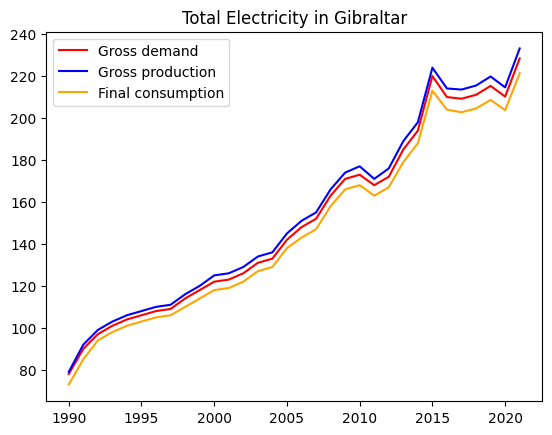

In [512]:
#Visualizing the data

x_Gibraltar = Gibraltar_df['Year']
y1_Gibraltar = Gibraltar_df['Gross demand']
y2_Gibraltar = Gibraltar_df['Gross production']
y3_Gibraltar = Gibraltar_df['Final consumption']

plt.plot(x_Gibraltar, y1_Gibraltar, color='red', label='Gross demand')
plt.plot(x_Gibraltar, y2_Gibraltar, color='blue', label='Gross production')
plt.plot(x_Gibraltar, y3_Gibraltar, color='orange', label='Final consumption')

plt.title('Total Electricity in Gibraltar')
plt.legend()
plt.show()

In [513]:
Gibraltar_demand_fig = px.line(Gibraltar_df, x='Year', y='Gross demand', title='Gross demand of electricity in Gibraltar')
Gibraltar_production_fig = px.line(Gibraltar_df, x='Year', y='Gross production', title='Gross production of electricity in Gibraltar')
Gibraltar_consumption_fig = px.line(Gibraltar_df, x='Year', y='Final consumption', title='Final consumption of electricity in Gibraltar')

Gibraltar_demand_fig.show()
Gibraltar_production_fig.show()
Gibraltar_consumption_fig.show()

In [514]:
#Greece dataframe

Greece_df = df.loc[df['Country'] == 'Greece']
Greece_max_year = Greece_df['Year'].max()
Greece_min_year = Greece_df['Year'].min()
Greece_df_Years = np.arange(Greece_min_year, Greece_max_year+1, 1)

print(Greece_df_Years.sum())
print(Greece_df['Year'].sum())
print(Greece_df_Years.sum() == Greece_df['Year'].sum())
print(Greece_df_Years)
print(np.array(Greece_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


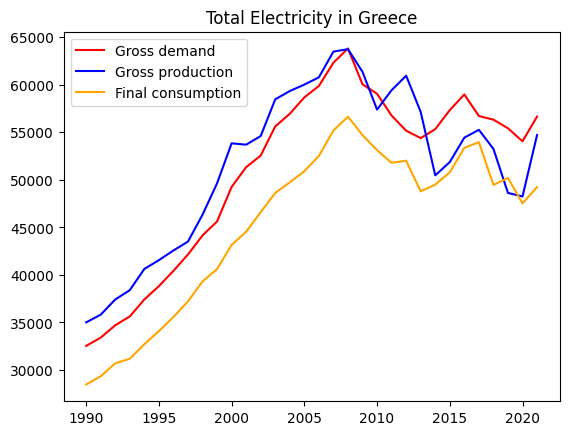

In [515]:
#Visualizing the data

x_Greece = Greece_df['Year']
y1_Greece = Greece_df['Gross demand']
y2_Greece = Greece_df['Gross production']
y3_Greece = Greece_df['Final consumption']

plt.plot(x_Greece, y1_Greece, color='red', label='Gross demand')
plt.plot(x_Greece, y2_Greece, color='blue', label='Gross production')
plt.plot(x_Greece, y3_Greece, color='orange', label='Final consumption')

plt.title('Total Electricity in Greece')
plt.legend()
plt.show()

In [516]:
Greece_demand_fig = px.line(Greece_df, x='Year', y='Gross demand', title='Gross demand of electricity in Greece')
Greece_production_fig = px.line(Greece_df, x='Year', y='Gross production', title='Gross production of electricity in Greece')
Greece_consumption_fig = px.line(Greece_df, x='Year', y='Final consumption', title='Final consumption of electricity in Greece')

Greece_demand_fig.show()
Greece_production_fig.show()
Greece_consumption_fig.show()

In [517]:
#Grenada dataframe

Grenada_df = df.loc[df['Country'] == 'Grenada']
Grenada_max_year = Grenada_df['Year'].max()
Grenada_min_year = Grenada_df['Year'].min()
Grenada_df_Years = np.arange(Grenada_min_year, Grenada_max_year+1, 1)

print(Grenada_df_Years.sum())
print(Grenada_df['Year'].sum())
print(Grenada_df_Years.sum() == Grenada_df['Year'].sum())
print(Grenada_df_Years)
print(np.array(Grenada_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


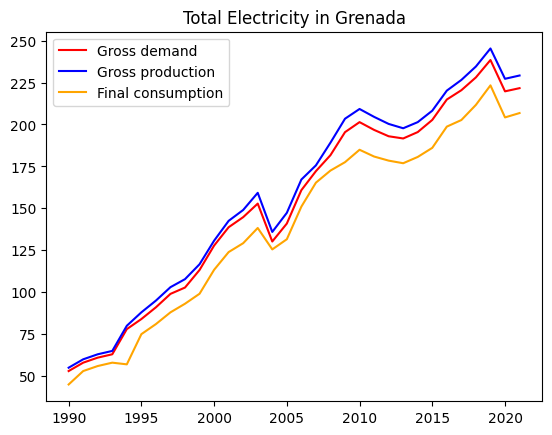

In [518]:
#Visualizing the data

x_Grenada = Grenada_df['Year']
y1_Grenada = Grenada_df['Gross demand']
y2_Grenada = Grenada_df['Gross production']
y3_Grenada = Grenada_df['Final consumption']

plt.plot(x_Grenada, y1_Grenada, color='red', label='Gross demand')
plt.plot(x_Grenada, y2_Grenada, color='blue', label='Gross production')
plt.plot(x_Grenada, y3_Grenada, color='orange', label='Final consumption')

plt.title('Total Electricity in Grenada')
plt.legend()
plt.show()

In [519]:
Grenada_demand_fig = px.line(Grenada_df, x='Year', y='Gross demand', title='Gross demand of electricity in Grenada')
Grenada_production_fig = px.line(Grenada_df, x='Year', y='Gross production', title='Gross production of electricity in Grenada')
Grenada_consumption_fig = px.line(Grenada_df, x='Year', y='Final consumption', title='Final consumption of electricity in Grenada')

Grenada_demand_fig.show()
Grenada_production_fig.show()
Grenada_consumption_fig.show()

In [520]:
#Guam dataframe

Guam_df = df.loc[df['Country'] == 'Guam']
Guam_max_year = Guam_df['Year'].max()
Guam_min_year = Guam_df['Year'].min()
Guam_df_Years = np.arange(Guam_min_year, Guam_max_year+1, 1)

print(Guam_df_Years.sum())
print(Guam_df['Year'].sum())
print(Guam_df_Years.sum() == Guam_df['Year'].sum())
print(Guam_df_Years)
print(np.array(Guam_df['Year'].sort_values(ascending=True)))

54189
48170
False
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007
 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020]
[1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2007 2009 2010
 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020]


In [521]:
#Guatemala dataframe

Guatemala_df = df.loc[df['Country'] == 'Guatemala']
Guatemala_max_year = Guatemala_df['Year'].max()
Guatemala_min_year = Guatemala_df['Year'].min()
Guatemala_df_Years = np.arange(Guatemala_min_year, Guatemala_max_year+1, 1)

print(Guatemala_df_Years.sum())
print(Guatemala_df['Year'].sum())
print(Guatemala_df_Years.sum() == Guatemala_df['Year'].sum())
print(Guatemala_df_Years)
print(np.array(Guatemala_df['Year'].sort_values(ascending=True)))

64176
62157
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2020 2021]


In [522]:
#Haiti dataframe

Haiti_df = df.loc[df['Country'] == 'Haiti']
Haiti_max_year = Haiti_df['Year'].max()
Haiti_min_year = Haiti_df['Year'].min()
Haiti_df_Years = np.arange(Haiti_min_year, Haiti_max_year+1, 1)

print(Haiti_df_Years.sum())
print(Haiti_df['Year'].sum())
print(Haiti_df_Years.sum() == Haiti_df['Year'].sum())
print(Haiti_df_Years)
print(np.array(Haiti_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


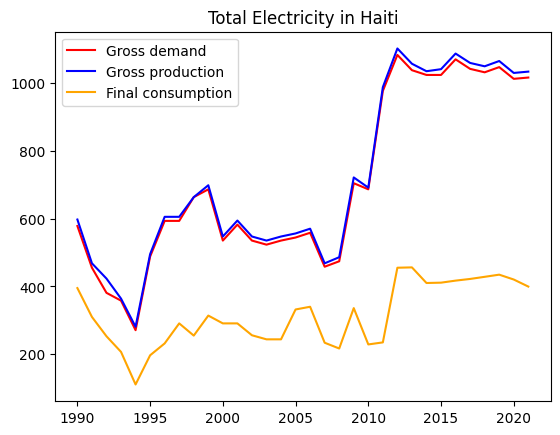

In [523]:
#Visualizing the data

x_Haiti = Haiti_df['Year']
y1_Haiti = Haiti_df['Gross demand']
y2_Haiti = Haiti_df['Gross production']
y3_Haiti = Haiti_df['Final consumption']

plt.plot(x_Haiti, y1_Haiti, color='red', label='Gross demand')
plt.plot(x_Haiti, y2_Haiti, color='blue', label='Gross production')
plt.plot(x_Haiti, y3_Haiti, color='orange', label='Final consumption')

plt.title('Total Electricity in Haiti')
plt.legend()
plt.show()

In [524]:
Haiti_demand_fig = px.line(Haiti_df, x='Year', y='Gross demand', title='Gross demand of electricity in Haiti')
Haiti_production_fig = px.line(Haiti_df, x='Year', y='Gross production', title='Gross production of electricity in Haiti')
Haiti_consumption_fig = px.line(Haiti_df, x='Year', y='Final consumption', title='Final consumption of electricity in Haiti')

Haiti_demand_fig.show()
Haiti_production_fig.show()
Haiti_consumption_fig.show()

In [525]:
#Honduras dataframe

Honduras_df = df.loc[df['Country'] == 'Honduras']
Honduras_max_year = Honduras_df['Year'].max()
Honduras_min_year = Honduras_df['Year'].min()
Honduras_df_Years = np.arange(Honduras_min_year, Honduras_max_year+1, 1)

print(Honduras_df_Years.sum())
print(Honduras_df['Year'].sum())
print(Honduras_df_Years.sum() == Honduras_df['Year'].sum())
print(Honduras_df_Years)
print(np.array(Honduras_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


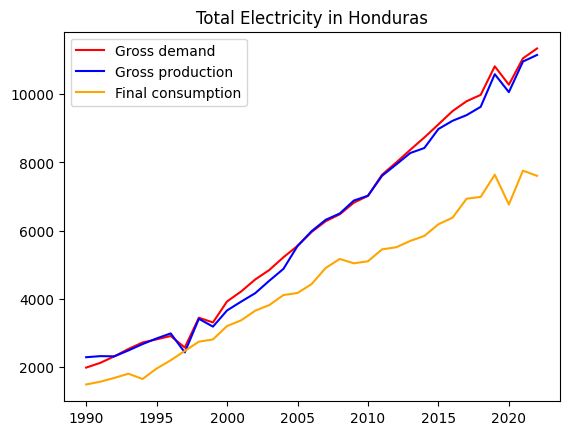

In [526]:
#Visualizing the data

x_Honduras = Honduras_df['Year']
y1_Honduras = Honduras_df['Gross demand']
y2_Honduras = Honduras_df['Gross production']
y3_Honduras = Honduras_df['Final consumption']

plt.plot(x_Honduras, y1_Honduras, color='red', label='Gross demand')
plt.plot(x_Honduras, y2_Honduras, color='blue', label='Gross production')
plt.plot(x_Honduras, y3_Honduras, color='orange', label='Final consumption')

plt.title('Total Electricity in Honduras')
plt.legend()
plt.show()

In [527]:
Honduras_demand_fig = px.line(Honduras_df, x='Year', y='Gross demand', title='Gross demand of electricity in Honduras')
Honduras_production_fig = px.line(Honduras_df, x='Year', y='Gross production', title='Gross production of electricity in Honduras')
Honduras_consumption_fig = px.line(Honduras_df, x='Year', y='Final consumption', title='Final consumption of electricity in Honduras')

Honduras_demand_fig.show()
Honduras_production_fig.show()
Honduras_consumption_fig.show()

In [528]:
#Hungary dataframe

Hungary_df = df.loc[df['Country'] == 'Hungary']
Hungary_max_year = Hungary_df['Year'].max()
Hungary_min_year = Hungary_df['Year'].min()
Hungary_df_Years = np.arange(Hungary_min_year, Hungary_max_year+1, 1)

print(Hungary_df_Years.sum())
print(Hungary_df['Year'].sum())
print(Hungary_df_Years.sum() == Hungary_df['Year'].sum())
print(Hungary_df_Years)
print(np.array(Hungary_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


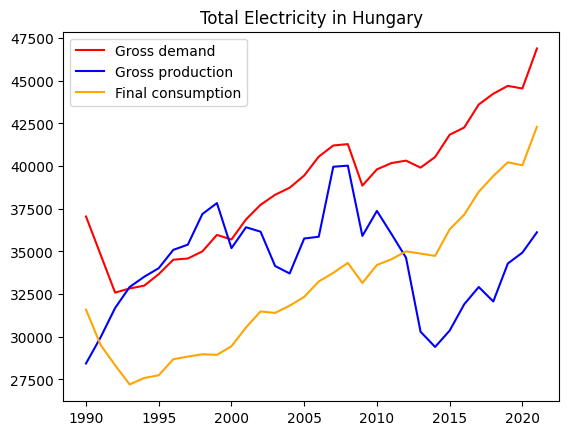

In [529]:
#Visualizing the data

x_Hungary = Hungary_df['Year']
y1_Hungary = Hungary_df['Gross demand']
y2_Hungary = Hungary_df['Gross production']
y3_Hungary = Hungary_df['Final consumption']

plt.plot(x_Hungary, y1_Hungary, color='red', label='Gross demand')
plt.plot(x_Hungary, y2_Hungary, color='blue', label='Gross production')
plt.plot(x_Hungary, y3_Hungary, color='orange', label='Final consumption')

plt.title('Total Electricity in Hungary')
plt.legend()
plt.show()

In [530]:
Hungary_demand_fig = px.line(Hungary_df, x='Year', y='Gross demand', title='Gross demand of electricity in Hungary')
Hungary_production_fig = px.line(Hungary_df, x='Year', y='Gross production', title='Gross production of electricity in Hungary')
Hungary_consumption_fig = px.line(Hungary_df, x='Year', y='Final consumption', title='Final consumption of electricity in Hungary')

Hungary_demand_fig.show()
Hungary_production_fig.show()
Hungary_consumption_fig.show()

In [531]:
#Iceland dataframe

Iceland_df = df.loc[df['Country'] == 'Iceland']
Iceland_max_year = Iceland_df['Year'].max()
Iceland_min_year = Iceland_df['Year'].min()
Iceland_df_Years = np.arange(Iceland_min_year, Iceland_max_year+1, 1)

print(Iceland_df_Years.sum())
print(Iceland_df['Year'].sum())
print(Iceland_df_Years.sum() == Iceland_df['Year'].sum())
print(Iceland_df_Years)
print(np.array(Iceland_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


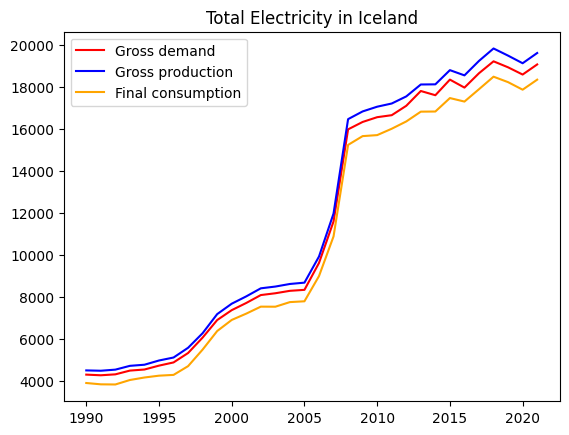

In [532]:
#Visualizing the data

x_Iceland = Iceland_df['Year']
y1_Iceland = Iceland_df['Gross demand']
y2_Iceland = Iceland_df['Gross production']
y3_Iceland = Iceland_df['Final consumption']

plt.plot(x_Iceland, y1_Iceland, color='red', label='Gross demand')
plt.plot(x_Iceland, y2_Iceland, color='blue', label='Gross production')
plt.plot(x_Iceland, y3_Iceland, color='orange', label='Final consumption')

plt.title('Total Electricity in Iceland')
plt.legend()
plt.show()

In [533]:
Iceland_demand_fig = px.line(Iceland_df, x='Year', y='Gross demand', title='Gross demand of electricity in Iceland')
Iceland_production_fig = px.line(Iceland_df, x='Year', y='Gross production', title='Gross production of electricity in Iceland')
Iceland_consumption_fig = px.line(Iceland_df, x='Year', y='Final consumption', title='Final consumption of electricity in Iceland')

Iceland_demand_fig.show()
Iceland_production_fig.show()
Iceland_consumption_fig.show()

In [534]:
#India dataframe

India_df = df.loc[df['Country'] == 'India']
India_max_year = India_df['Year'].max()
India_min_year = India_df['Year'].min()
India_df_Years = np.arange(India_min_year, India_max_year+1, 1)

print(India_df_Years.sum())
print(India_df['Year'].sum())
print(India_df_Years.sum() == India_df['Year'].sum())
print(India_df_Years)
print(np.array(India_df['Year'].sort_values(ascending=True)))

58116
56104
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2013 2014 2015 2016 2017 2018]


In [535]:
#Indonesia dataframe

Indonesia_df = df.loc[df['Country'] == 'Indonesia']
Indonesia_max_year = Indonesia_df['Year'].max()
Indonesia_min_year = Indonesia_df['Year'].min()
Indonesia_df_Years = np.arange(Indonesia_min_year, Indonesia_max_year+1, 1)

print(Indonesia_df_Years.sum())
print(Indonesia_df['Year'].sum())
print(Indonesia_df_Years.sum() == Indonesia_df['Year'].sum())
print(Indonesia_df_Years)
print(np.array(Indonesia_df['Year'].sort_values(ascending=True)))

52065
52065
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015]


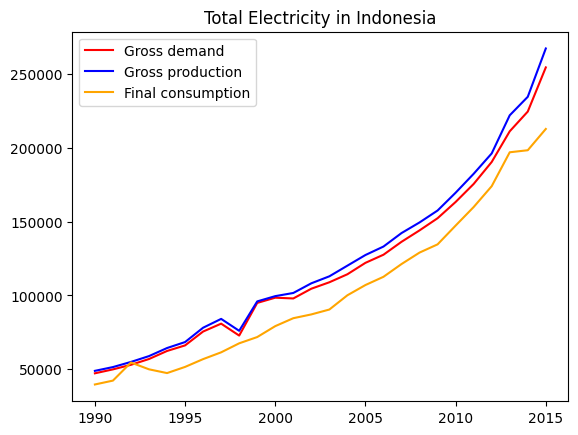

In [536]:
#Visualizing the data

x_Indonesia = Indonesia_df['Year']
y1_Indonesia = Indonesia_df['Gross demand']
y2_Indonesia = Indonesia_df['Gross production']
y3_Indonesia = Indonesia_df['Final consumption']

plt.plot(x_Indonesia, y1_Indonesia, color='red', label='Gross demand')
plt.plot(x_Indonesia, y2_Indonesia, color='blue', label='Gross production')
plt.plot(x_Indonesia, y3_Indonesia, color='orange', label='Final consumption')

plt.title('Total Electricity in Indonesia')
plt.legend()
plt.show()

In [537]:
Indonesia_demand_fig = px.line(Indonesia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Indonesia')
Indonesia_production_fig = px.line(Indonesia_df, x='Year', y='Gross production', title='Gross production of electricity in Indonesia')
Indonesia_consumption_fig = px.line(Indonesia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Indonesia')

Indonesia_demand_fig.show()
Indonesia_production_fig.show()
Indonesia_consumption_fig.show()

In [538]:
#Iran (Islamic Rep. of) dataframe

Iran_df = df.loc[df['Country'] == 'Iran (Islamic Rep. of)']
Iran_max_year = Iran_df['Year'].max()
Iran_min_year = Iran_df['Year'].min()
Iran_df_Years = np.arange(Iran_min_year, Iran_max_year+1, 1)

print(Iran_df_Years.sum())
print(Iran_df['Year'].sum())
print(Iran_df_Years.sum() == Iran_df['Year'].sum())
print(Iran_df_Years)
print(np.array(Iran_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


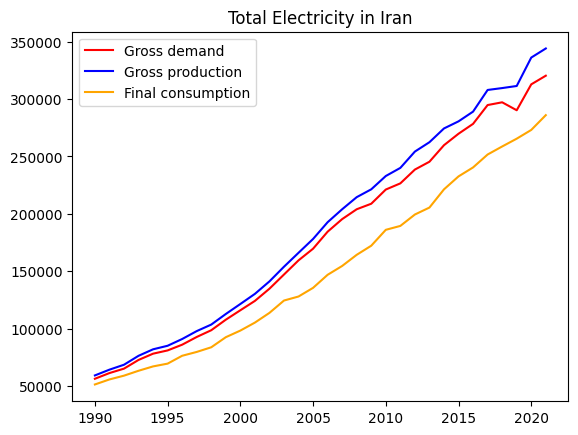

In [539]:
#Visualizing the data

x_Iran = Iran_df['Year']
y1_Iran = Iran_df['Gross demand']
y2_Iran = Iran_df['Gross production']
y3_Iran = Iran_df['Final consumption']

plt.plot(x_Iran, y1_Iran, color='red', label='Gross demand')
plt.plot(x_Iran, y2_Iran, color='blue', label='Gross production')
plt.plot(x_Iran, y3_Iran, color='orange', label='Final consumption')

plt.title('Total Electricity in Iran')
plt.legend()
plt.show()

In [540]:
Iran_demand_fig = px.line(Iran_df, x='Year', y='Gross demand', title='Gross demand of electricity in Iran (Islamic Rep. of)')
Iran_production_fig = px.line(Iran_df, x='Year', y='Gross production', title='Gross production of electricity in Iran (Islamic Rep. of)')
Iran_consumption_fig = px.line(Iran_df, x='Year', y='Final consumption', title='Final consumption of electricity in Iran (Islamic Rep. of)')

Iran_demand_fig.show()
Iran_production_fig.show()
Iran_consumption_fig.show()

In [541]:
#Iraq dataframe

Iraq_df = df.loc[df['Country'] == 'Iraq']
Iraq_max_year = Iraq_df['Year'].max()
Iraq_min_year = Iraq_df['Year'].min()
Iraq_df_Years = np.arange(Iraq_min_year, Iraq_max_year+1, 1)

print(Iraq_df_Years.sum())
print(Iraq_df['Year'].sum())
print(Iraq_df_Years.sum() == Iraq_df['Year'].sum())
print(Iraq_df_Years)
print(np.array(Iraq_df['Year'].sort_values(ascending=True)))

48228
40161
False
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2018 2020 2021]


In [542]:
#Ireland dataframe

Ireland_df = df.loc[df['Country'] == 'Ireland']
Ireland_max_year = Ireland_df['Year'].max()
Ireland_min_year = Ireland_df['Year'].min()
Ireland_df_Years = np.arange(Ireland_min_year, Ireland_max_year+1, 1)

print(Ireland_df_Years.sum())
print(Ireland_df['Year'].sum())
print(Ireland_df_Years.sum() == Ireland_df['Year'].sum())
print(Ireland_df_Years)
print(np.array(Ireland_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


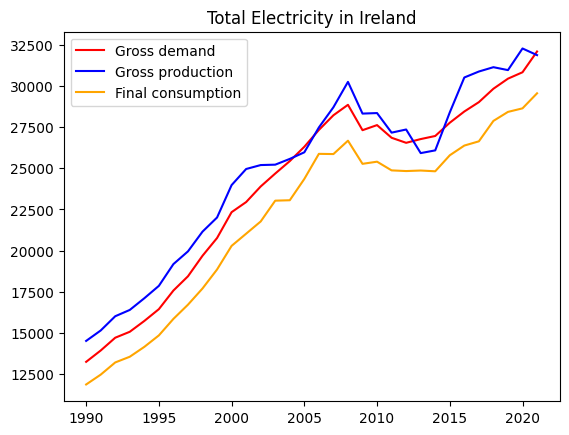

In [543]:
#Visualizing the data

x_Ireland = Ireland_df['Year']
y1_Ireland = Ireland_df['Gross demand']
y2_Ireland = Ireland_df['Gross production']
y3_Ireland = Ireland_df['Final consumption']

plt.plot(x_Ireland, y1_Ireland, color='red', label='Gross demand')
plt.plot(x_Ireland, y2_Ireland, color='blue', label='Gross production')
plt.plot(x_Ireland, y3_Ireland, color='orange', label='Final consumption')

plt.title('Total Electricity in Ireland')
plt.legend()
plt.show()

In [544]:
Ireland_demand_fig = px.line(Ireland_df, x='Year', y='Gross demand', title='Gross demand of electricity in Ireland')
Ireland_production_fig = px.line(Ireland_df, x='Year', y='Gross production', title='Gross production of electricity in Ireland')
Ireland_consumption_fig = px.line(Ireland_df, x='Year', y='Final consumption', title='Final consumption of electricity in Ireland')

Ireland_demand_fig.show()
Ireland_production_fig.show()
Ireland_consumption_fig.show()

In [545]:
#Israel dataframe

Israel_df = df.loc[df['Country'] == 'Israel']
Israel_max_year = Israel_df['Year'].max()
Israel_min_year = Israel_df['Year'].min()
Israel_df_Years = np.arange(Israel_min_year, Israel_max_year+1, 1)

print(Israel_df_Years.sum())
print(Israel_df['Year'].sum())
print(Israel_df_Years.sum() == Israel_df['Year'].sum())
print(Israel_df_Years)
print(np.array(Israel_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


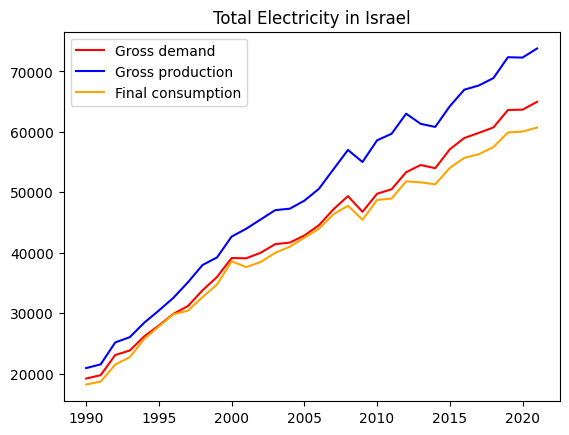

In [546]:
#Visualizing the data

x_Israel = Israel_df['Year']
y1_Israel = Israel_df['Gross demand']
y2_Israel = Israel_df['Gross production']
y3_Israel = Israel_df['Final consumption']

plt.plot(x_Israel, y1_Israel, color='red', label='Gross demand')
plt.plot(x_Israel, y2_Israel, color='blue', label='Gross production')
plt.plot(x_Israel, y3_Israel, color='orange', label='Final consumption')

plt.title('Total Electricity in Israel')
plt.legend()
plt.show()

In [547]:
Israel_demand_fig = px.line(Israel_df, x='Year', y='Gross demand', title='Gross demand of electricity in Israel')
Israel_production_fig = px.line(Israel_df, x='Year', y='Gross production', title='Gross production of electricity in Israel')
Israel_consumption_fig = px.line(Israel_df, x='Year', y='Final consumption', title='Final consumption of electricity in Israel')

Israel_demand_fig.show()
Israel_production_fig.show()
Israel_consumption_fig.show()

In [548]:
#Italy dataframe

Italy_df = df.loc[df['Country'] == 'Italy']
Italy_max_year = Italy_df['Year'].max()
Italy_min_year = Italy_df['Year'].min()
Italy_df_Years = np.arange(Italy_min_year, Italy_max_year+1, 1)

print(Italy_df_Years.sum())
print(Italy_df['Year'].sum())
print(Italy_df_Years.sum() == Italy_df['Year'].sum())
print(Italy_df_Years)
print(np.array(Italy_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


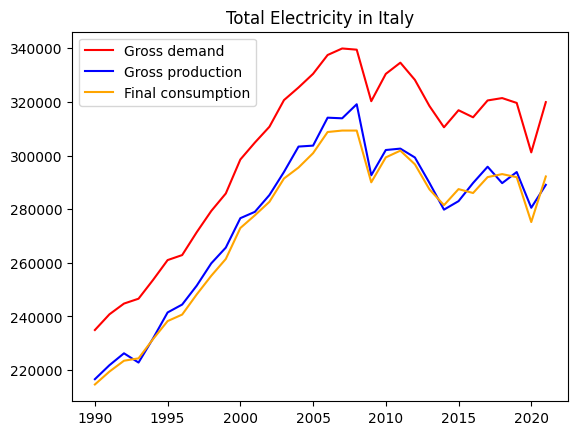

In [549]:
#Visualizing the data

x_Italy = Italy_df['Year']
y1_Italy = Italy_df['Gross demand']
y2_Italy = Italy_df['Gross production']
y3_Italy = Italy_df['Final consumption']

plt.plot(x_Italy, y1_Italy, color='red', label='Gross demand')
plt.plot(x_Italy, y2_Italy, color='blue', label='Gross production')
plt.plot(x_Italy, y3_Italy, color='orange', label='Final consumption')

plt.title('Total Electricity in Italy')
plt.legend()
plt.show()

In [550]:
Italy_demand_fig = px.line(Italy_df, x='Year', y='Gross demand', title='Gross demand of electricity in Italy')
Italy_production_fig = px.line(Italy_df, x='Year', y='Gross production', title='Gross production of electricity in Italy')
Italy_consumption_fig = px.line(Italy_df, x='Year', y='Final consumption', title='Final consumption of electricity in Italy')

Italy_demand_fig.show()
Italy_production_fig.show()
Italy_consumption_fig.show()

In [551]:
#Jamaica dataframe

Jamaica_df = df.loc[df['Country'] == 'Jamaica']
Jamaica_max_year = Jamaica_df['Year'].max()
Jamaica_min_year = Jamaica_df['Year'].min()
Jamaica_df_Years = np.arange(Jamaica_min_year, Jamaica_max_year+1, 1)

print(Jamaica_df_Years.sum())
print(Jamaica_df['Year'].sum())
print(Jamaica_df_Years.sum() == Jamaica_df['Year'].sum())
print(Jamaica_df_Years)
print(np.array(Jamaica_df['Year'].sort_values(ascending=True)))

60225
60225
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022]


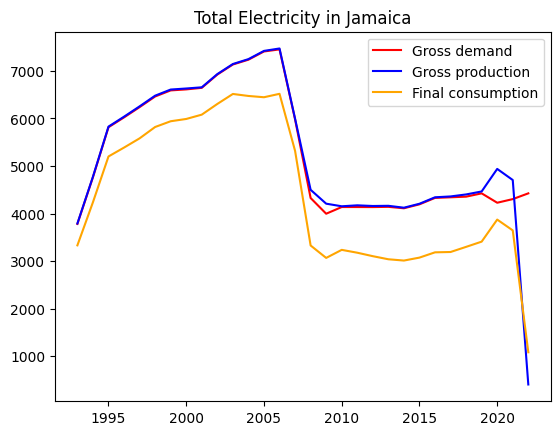

In [552]:
#Visualizing the data

x_Jamaica = Jamaica_df['Year']
y1_Jamaica = Jamaica_df['Gross demand']
y2_Jamaica = Jamaica_df['Gross production']
y3_Jamaica = Jamaica_df['Final consumption']

plt.plot(x_Jamaica, y1_Jamaica, color='red', label='Gross demand')
plt.plot(x_Jamaica, y2_Jamaica, color='blue', label='Gross production')
plt.plot(x_Jamaica, y3_Jamaica, color='orange', label='Final consumption')

plt.title('Total Electricity in Jamaica')
plt.legend()
plt.show()

In [553]:
Jamaica_demand_fig = px.line(Jamaica_df, x='Year', y='Gross demand', title='Gross demand of electricity in Jamaica')
Jamaica_production_fig = px.line(Jamaica_df, x='Year', y='Gross production', title='Gross production of electricity in Jamaica')
Jamaica_consumption_fig = px.line(Jamaica_df, x='Year', y='Final consumption', title='Final consumption of electricity in Jamaica')

Jamaica_demand_fig.show()
Jamaica_production_fig.show()
Jamaica_consumption_fig.show()

In [554]:
#Japan dataframe

Japan_df = df.loc[df['Country'] == 'Japan']
Japan_max_year = Japan_df['Year'].max()
Japan_min_year = Japan_df['Year'].min()
Japan_df_Years = np.arange(Japan_min_year, Japan_max_year+1, 1)

print(Japan_df_Years.sum())
print(Japan_df['Year'].sum())
print(Japan_df_Years.sum() == Japan_df['Year'].sum())
print(Japan_df_Years)
print(np.array(Japan_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


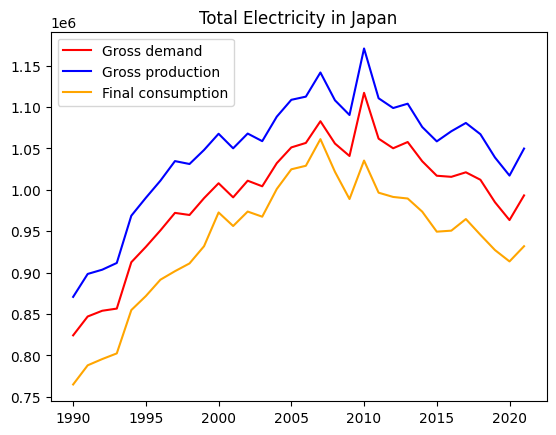

In [555]:
#Visualizing the data

x_Japan = Japan_df['Year']
y1_Japan = Japan_df['Gross demand']
y2_Japan = Japan_df['Gross production']
y3_Japan = Japan_df['Final consumption']

plt.plot(x_Japan, y1_Japan, color='red', label='Gross demand')
plt.plot(x_Japan, y2_Japan, color='blue', label='Gross production')
plt.plot(x_Japan, y3_Japan, color='orange', label='Final consumption')

plt.title('Total Electricity in Japan')
plt.legend()
plt.show()

In [556]:
Japan_demand_fig = px.line(Japan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Japan')
Japan_production_fig = px.line(Japan_df, x='Year', y='Gross production', title='Gross production of electricity in Japan')
Japan_consumption_fig = px.line(Japan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Japan')

Japan_demand_fig.show()
Japan_production_fig.show()
Japan_consumption_fig.show()

In [557]:
#Jersey dataframe

Jersey_df = df.loc[df['Country'] == 'Jersey']
Jersey_max_year = Jersey_df['Year'].max()
Jersey_min_year = Jersey_df['Year'].min()
Jersey_df_Years = np.arange(Jersey_min_year, Jersey_max_year+1, 1)

print(Jersey_df_Years.sum())
print(Jersey_df['Year'].sum())
print(Jersey_df_Years.sum() == Jersey_df['Year'].sum())
print(Jersey_df_Years)
print(np.array(Jersey_df['Year'].sort_values(ascending=True)))

64208
64208
True
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021 2022]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021 2022]


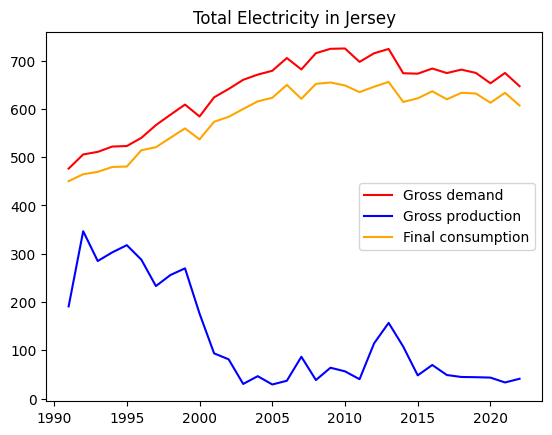

In [558]:
#Visualizing the data

x_Jersey = Jersey_df['Year']
y1_Jersey = Jersey_df['Gross demand']
y2_Jersey = Jersey_df['Gross production']
y3_Jersey = Jersey_df['Final consumption']

plt.plot(x_Jersey, y1_Jersey, color='red', label='Gross demand')
plt.plot(x_Jersey, y2_Jersey, color='blue', label='Gross production')
plt.plot(x_Jersey, y3_Jersey, color='orange', label='Final consumption')

plt.title('Total Electricity in Jersey')
plt.legend()
plt.show()

In [559]:
Jersey_demand_fig = px.line(Jersey_df, x='Year', y='Gross demand', title='Gross demand of electricity in Jersey')
Jersey_production_fig = px.line(Jersey_df, x='Year', y='Gross production', title='Gross production of electricity in Jersey')
Jersey_consumption_fig = px.line(Jersey_df, x='Year', y='Final consumption', title='Final consumption of electricity in Jersey')

Jersey_demand_fig.show()
Jersey_production_fig.show()
Jersey_consumption_fig.show()

In [560]:
#Jordan dataframe

Jordan_df = df.loc[df['Country'] == 'Jordan']
Jordan_max_year = Jordan_df['Year'].max()
Jordan_min_year = Jordan_df['Year'].min()
Jordan_df_Years = np.arange(Jordan_min_year, Jordan_max_year+1, 1)

print(Jordan_df_Years.sum())
print(Jordan_df['Year'].sum())
print(Jordan_df_Years.sum() == Jordan_df['Year'].sum())
print(Jordan_df_Years)
print(np.array(Jordan_df['Year'].sort_values(ascending=True)))

60165
60165
True
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020]


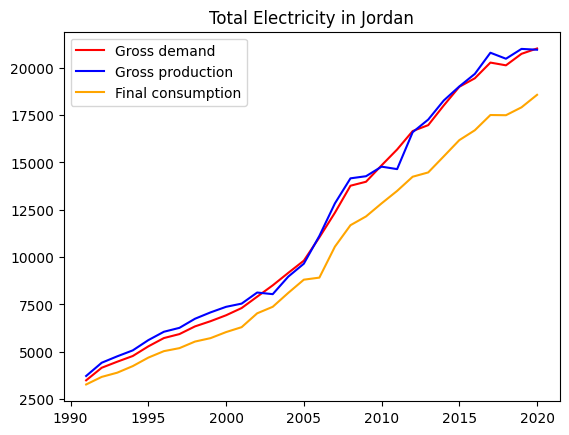

In [561]:
#Visualizing the data

x_Jordan = Jordan_df['Year']
y1_Jordan = Jordan_df['Gross demand']
y2_Jordan = Jordan_df['Gross production']
y3_Jordan = Jordan_df['Final consumption']

plt.plot(x_Jordan, y1_Jordan, color='red', label='Gross demand')
plt.plot(x_Jordan, y2_Jordan, color='blue', label='Gross production')
plt.plot(x_Jordan, y3_Jordan, color='orange', label='Final consumption')

plt.title('Total Electricity in Jordan')
plt.legend()
plt.show()

In [562]:
Jordan_demand_fig = px.line(Jordan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Jordan')
Jordan_production_fig = px.line(Jordan_df, x='Year', y='Gross production', title='Gross production of electricity in Jordan')
Jordan_consumption_fig = px.line(Jordan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Jordan')

Jordan_demand_fig.show()
Jordan_production_fig.show()
Jordan_consumption_fig.show()

In [563]:
#Kazakhstan dataframe

Kazakhstan_df = df.loc[df['Country'] == 'Kazakhstan']
Kazakhstan_max_year = Kazakhstan_df['Year'].max()
Kazakhstan_min_year = Kazakhstan_df['Year'].min()
Kazakhstan_df_Years = np.arange(Kazakhstan_min_year, Kazakhstan_max_year+1, 1)

print(Kazakhstan_df_Years.sum())
print(Kazakhstan_df['Year'].sum())
print(Kazakhstan_df_Years.sum() == Kazakhstan_df['Year'].sum())
print(Kazakhstan_df_Years)
print(np.array(Kazakhstan_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


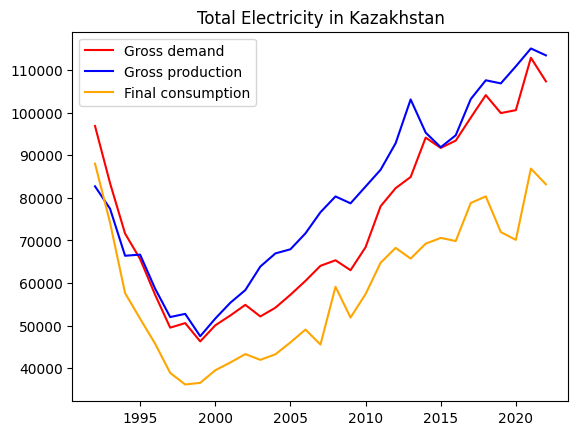

In [564]:
#Visualizing the data

x_Kazakhstan = Kazakhstan_df['Year']
y1_Kazakhstan = Kazakhstan_df['Gross demand']
y2_Kazakhstan = Kazakhstan_df['Gross production']
y3_Kazakhstan = Kazakhstan_df['Final consumption']

plt.plot(x_Kazakhstan, y1_Kazakhstan, color='red', label='Gross demand')
plt.plot(x_Kazakhstan, y2_Kazakhstan, color='blue', label='Gross production')
plt.plot(x_Kazakhstan, y3_Kazakhstan, color='orange', label='Final consumption')

plt.title('Total Electricity in Kazakhstan')
plt.legend()
plt.show()

In [565]:
Kazakhstan_demand_fig = px.line(Kazakhstan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kazakhstan')
Kazakhstan_production_fig = px.line(Kazakhstan_df, x='Year', y='Gross production', title='Gross production of electricity in Kazakhstan')
Kazakhstan_consumption_fig = px.line(Kazakhstan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kazakhstan')

Kazakhstan_demand_fig.show()
Kazakhstan_production_fig.show()
Kazakhstan_consumption_fig.show()

In [566]:
#Kenya dataframe

Kenya_df = df.loc[df['Country'] == 'Kenya']
Kenya_max_year = Kenya_df['Year'].max()
Kenya_min_year = Kenya_df['Year'].min()
Kenya_df_Years = np.arange(Kenya_min_year, Kenya_max_year+1, 1)

print(Kenya_df_Years.sum())
print(Kenya_df['Year'].sum())
print(Kenya_df_Years.sum() == Kenya_df['Year'].sum())
print(Kenya_df_Years)
print(np.array(Kenya_df['Year'].sort_values(ascending=True)))


64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


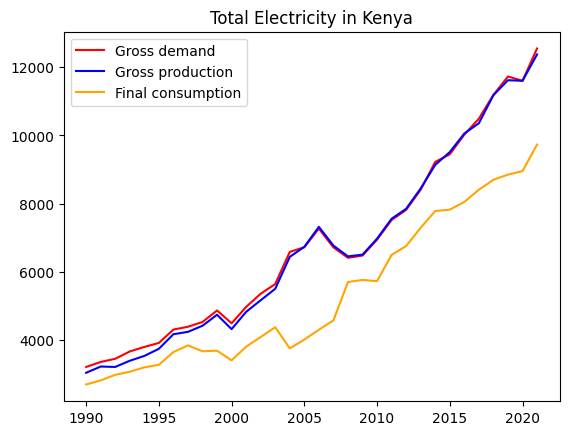

In [567]:
#Visualizing the data

x_Kenya = Kenya_df['Year']
y1_Kenya = Kenya_df['Gross demand']
y2_Kenya = Kenya_df['Gross production']
y3_Kenya = Kenya_df['Final consumption']

plt.plot(x_Kenya, y1_Kenya, color='red', label='Gross demand')
plt.plot(x_Kenya, y2_Kenya, color='blue', label='Gross production')
plt.plot(x_Kenya, y3_Kenya, color='orange', label='Final consumption')

plt.title('Total Electricity in Kenya')
plt.legend()
plt.show()

In [568]:
Kenya_demand_fig = px.line(Kenya_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kenya')
Kenya_production_fig = px.line(Kenya_df, x='Year', y='Gross production', title='Gross production of electricity in Kenya')
Kenya_consumption_fig = px.line(Kenya_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kenya')

Kenya_demand_fig.show()
Kenya_production_fig.show()
Kenya_consumption_fig.show()

In [569]:
#Kiribati dataframe

Kiribati_df = df.loc[df['Country'] == 'Kiribati']
Kiribati_max_year = Kiribati_df['Year'].max()
Kiribati_min_year = Kiribati_df['Year'].min()
Kiribati_df_Years = np.arange(Kiribati_min_year, Kiribati_max_year+1, 1)

print(Kiribati_df_Years.sum())
print(Kiribati_df['Year'].sum())
print(Kiribati_df_Years.sum() == Kiribati_df['Year'].sum())
print(Kiribati_df_Years)
print(np.array(Kiribati_df['Year'].sort_values(ascending=True)))


39990
39990
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009]


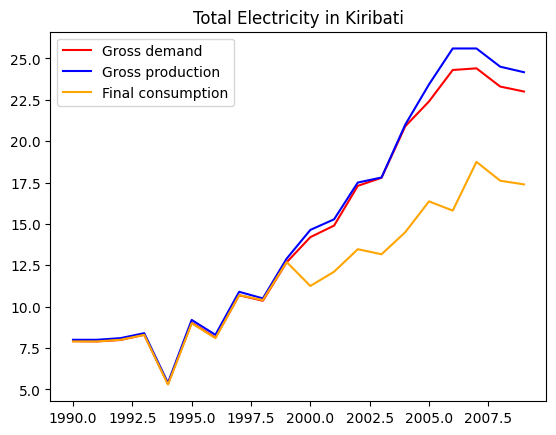

In [570]:
#Visualizing the data

x_Kiribati = Kiribati_df['Year']
y1_Kiribati = Kiribati_df['Gross demand']
y2_Kiribati = Kiribati_df['Gross production']
y3_Kiribati = Kiribati_df['Final consumption']

plt.plot(x_Kiribati, y1_Kiribati, color='red', label='Gross demand')
plt.plot(x_Kiribati, y2_Kiribati, color='blue', label='Gross production')
plt.plot(x_Kiribati, y3_Kiribati, color='orange', label='Final consumption')

plt.title('Total Electricity in Kiribati')
plt.legend()
plt.show()

In [571]:
Kiribati_demand_fig = px.line(Kiribati_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kiribati')
Kiribati_production_fig = px.line(Kiribati_df, x='Year', y='Gross production', title='Gross production of electricity in Kiribati')
Kiribati_consumption_fig = px.line(Kiribati_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kiribati')

Kiribati_demand_fig.show()
Kiribati_production_fig.show()
Kiribati_consumption_fig.show()

In [572]:
#Korea, Dem.Ppl's.Rep. dataframe

North_Korea_df = df.loc[df['Country'] == "Korea, Dem.Ppl's.Rep."]
North_Korea_max_year = North_Korea_df['Year'].max()
North_Korea_min_year = North_Korea_df['Year'].min()
North_Korea_df_Years = np.arange(North_Korea_min_year, North_Korea_max_year+1, 1)

print(North_Korea_df_Years.sum())
print(North_Korea_df['Year'].sum())
print(North_Korea_df_Years.sum() == North_Korea_df['Year'].sum())
print(North_Korea_df_Years)
print(np.array(North_Korea_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


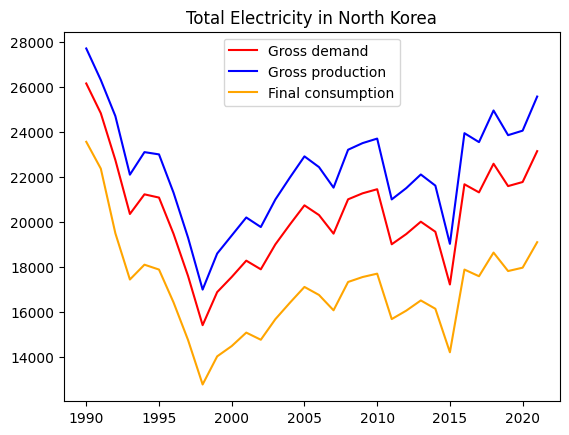

In [573]:
#Visualizing the data

x_North_Korea = North_Korea_df['Year']
y1_North_Korea = North_Korea_df['Gross demand']
y2_North_Korea = North_Korea_df['Gross production']
y3_North_Korea = North_Korea_df['Final consumption']

plt.plot(x_North_Korea, y1_North_Korea, color='red', label='Gross demand')
plt.plot(x_North_Korea, y2_North_Korea, color='blue', label='Gross production')
plt.plot(x_North_Korea, y3_North_Korea, color='orange', label='Final consumption')

plt.title('Total Electricity in North Korea')
plt.legend()
plt.show()

In [574]:
North_Korea_demand_fig = px.line(North_Korea_df, x='Year', y='Gross demand', title='Gross demand of electricity in North Korea')
North_Korea_production_fig = px.line(North_Korea_df, x='Year', y='Gross production', title='Gross production of electricity in North Korea')
North_Korea_consumption_fig = px.line(North_Korea_df, x='Year', y='Final consumption', title='Final consumption of electricity in North Korea')

North_Korea_demand_fig.show()
North_Korea_production_fig.show()
North_Korea_consumption_fig.show()

In [575]:
#Korea, Republic of dataframe

South_Korea_df = df.loc[df['Country'] == 'Korea, Republic of']
South_Korea_max_year = South_Korea_df['Year'].max()
South_Korea_min_year = South_Korea_df['Year'].min()
South_Korea_df_Years = np.arange(South_Korea_min_year, South_Korea_max_year+1, 1)

print(South_Korea_df_Years.sum())
print(South_Korea_df['Year'].sum())
print(South_Korea_df_Years.sum() == South_Korea_df['Year'].sum())
print(South_Korea_df_Years)
print(np.array(South_Korea_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


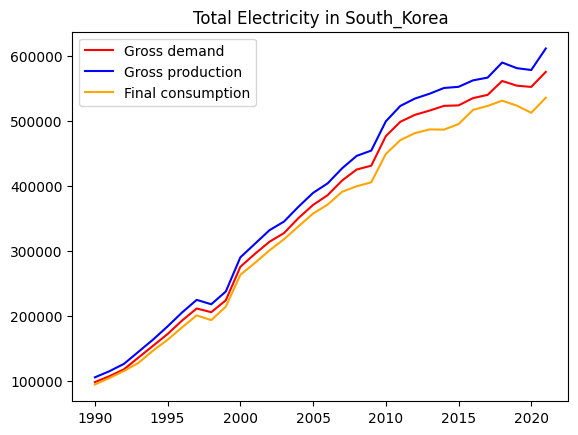

In [576]:
#Visualizing the data

x_South_Korea = South_Korea_df['Year']
y1_South_Korea = South_Korea_df['Gross demand']
y2_South_Korea = South_Korea_df['Gross production']
y3_South_Korea = South_Korea_df['Final consumption']

plt.plot(x_South_Korea, y1_South_Korea, color='red', label='Gross demand')
plt.plot(x_South_Korea, y2_South_Korea, color='blue', label='Gross production')
plt.plot(x_South_Korea, y3_South_Korea, color='orange', label='Final consumption')

plt.title('Total Electricity in South_Korea')
plt.legend()
plt.show()

In [577]:
South_Korea_demand_fig = px.line(South_Korea_df, x='Year', y='Gross demand', title='Gross demand of electricity in South Korea')
South_Korea_production_fig = px.line(South_Korea_df, x='Year', y='Gross production', title='Gross production of electricity in South Korea')
South_Korea_consumption_fig = px.line(South_Korea_df, x='Year', y='Final consumption', title='Final consumption of electricity in South Korea')

South_Korea_demand_fig.show()
South_Korea_production_fig.show()
South_Korea_consumption_fig.show()

In [578]:
#Kosovo dataframe

Kosovo_df = df.loc[df['Country'] == 'Kosovo']
Kosovo_max_year = Kosovo_df['Year'].max()
Kosovo_min_year = Kosovo_df['Year'].min()
Kosovo_df_Years = np.arange(Kosovo_min_year, Kosovo_max_year+1, 1)

print(Kosovo_df_Years.sum())
print(Kosovo_df['Year'].sum())
print(Kosovo_df_Years.sum() == Kosovo_df['Year'].sum())
print(Kosovo_df_Years)
print(np.array(Kosovo_df['Year'].sort_values(ascending=True)))

44231
44231
True
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021]
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021]


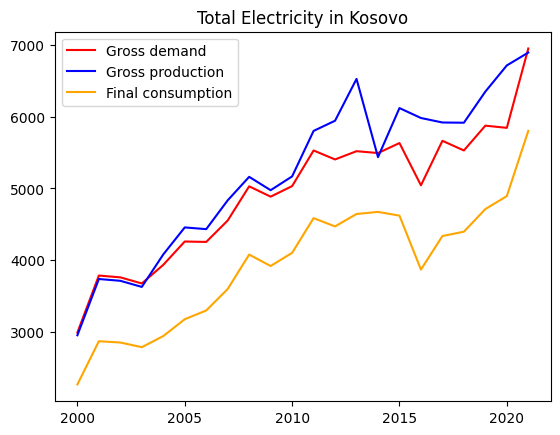

In [579]:
#Visualizing the data

x_Kosovo = Kosovo_df['Year']
y1_Kosovo = Kosovo_df['Gross demand']
y2_Kosovo = Kosovo_df['Gross production']
y3_Kosovo = Kosovo_df['Final consumption']

plt.plot(x_Kosovo, y1_Kosovo, color='red', label='Gross demand')
plt.plot(x_Kosovo, y2_Kosovo, color='blue', label='Gross production')
plt.plot(x_Kosovo, y3_Kosovo, color='orange', label='Final consumption')

plt.title('Total Electricity in Kosovo')
plt.legend()
plt.show()

In [580]:
Kosovo_demand_fig = px.line(Kosovo_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kosovo')
Kosovo_production_fig = px.line(Kosovo_df, x='Year', y='Gross production', title='Gross production of electricity in Kosovo')
Kosovo_consumption_fig = px.line(Kosovo_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kosovo')

Kosovo_demand_fig.show()
Kosovo_production_fig.show()
Kosovo_consumption_fig.show()

In [581]:
#Kuwait database

Kuwait_df = df.loc[df['Country'] == 'Kuwait']
Kuwait_max_year = Kuwait_df['Year'].max()
Kuwait_min_year = Kuwait_df['Year'].min()
Kuwait_df_Years = np.arange(Kuwait_min_year, Kuwait_max_year+1, 1)

print(Kuwait_df_Years.sum())
print(Kuwait_df['Year'].sum())
print(Kuwait_df_Years.sum() == Kuwait_df['Year'].sum())
print(Kuwait_df_Years)
print(np.array(Kuwait_df['Year'].sort_values(ascending=True)))

50250
50250
True
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022]


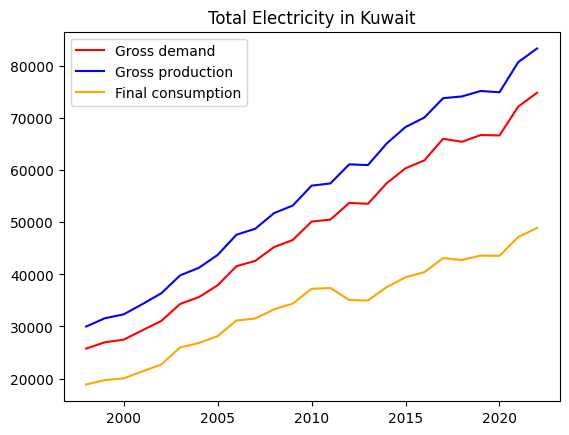

In [582]:
#Visualizing the data

x_Kuwait = Kuwait_df['Year']
y1_Kuwait = Kuwait_df['Gross demand']
y2_Kuwait = Kuwait_df['Gross production']
y3_Kuwait = Kuwait_df['Final consumption']

plt.plot(x_Kuwait, y1_Kuwait, color='red', label='Gross demand')
plt.plot(x_Kuwait, y2_Kuwait, color='blue', label='Gross production')
plt.plot(x_Kuwait, y3_Kuwait, color='orange', label='Final consumption')

plt.title('Total Electricity in Kuwait')
plt.legend()
plt.show()

In [583]:
Kuwait_demand_fig = px.line(Kuwait_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kuwait')
Kuwait_production_fig = px.line(Kuwait_df, x='Year', y='Gross production', title='Gross production of electricity in Kuwait')
Kuwait_consumption_fig = px.line(Kuwait_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kuwait')

Kuwait_demand_fig.show()
Kuwait_production_fig.show()
Kuwait_consumption_fig.show()

In [584]:
#Kyrgyzstan dataframe

Kyrgyzstan_df = df.loc[df['Country'] == 'Kyrgyzstan']
Kyrgyzstan_max_year = Kyrgyzstan_df['Year'].max()
Kyrgyzstan_min_year = Kyrgyzstan_df['Year'].min()
Kyrgyzstan_df_Years = np.arange(Kyrgyzstan_min_year, Kyrgyzstan_max_year+1, 1)

print(Kyrgyzstan_df_Years.sum())
print(Kyrgyzstan_df['Year'].sum())
print(Kyrgyzstan_df_Years.sum() == Kyrgyzstan_df['Year'].sum())
print(Kyrgyzstan_df_Years)
print(np.array(Kyrgyzstan_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


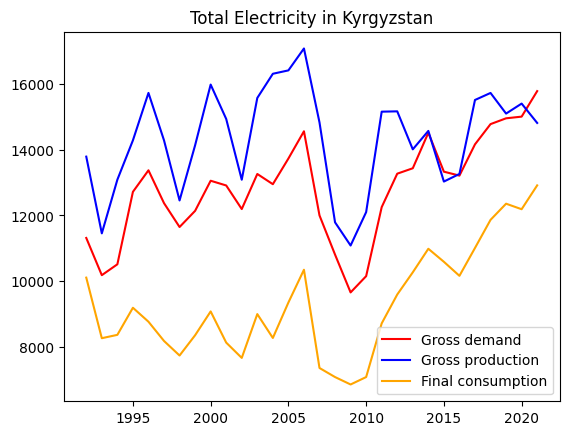

In [585]:
#Visualizing the data

x_Kyrgyzstan = Kyrgyzstan_df['Year']
y1_Kyrgyzstan = Kyrgyzstan_df['Gross demand']
y2_Kyrgyzstan = Kyrgyzstan_df['Gross production']
y3_Kyrgyzstan = Kyrgyzstan_df['Final consumption']

plt.plot(x_Kyrgyzstan, y1_Kyrgyzstan, color='red', label='Gross demand')
plt.plot(x_Kyrgyzstan, y2_Kyrgyzstan, color='blue', label='Gross production')
plt.plot(x_Kyrgyzstan, y3_Kyrgyzstan, color='orange', label='Final consumption')

plt.title('Total Electricity in Kyrgyzstan')
plt.legend()
plt.show()

In [586]:
Kyrgyzstan_demand_fig = px.line(Kyrgyzstan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Kyrgyzstan')
Kyrgyzstan_production_fig = px.line(Kyrgyzstan_df, x='Year', y='Gross production', title='Gross production of electricity in Kyrgyzstan')
Kyrgyzstan_consumption_fig = px.line(Kyrgyzstan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Kyrgyzstan')

Kyrgyzstan_demand_fig.show()
Kyrgyzstan_production_fig.show()
Kyrgyzstan_consumption_fig.show()

In [587]:
#Lao People's Dem. Rep. dataframe

Laos_df = df.loc[df['Country'] == "Lao People's Dem. Rep."]
Laos_max_year = Laos_df['Year'].max()
Laos_min_year = Laos_df['Year'].min()
Laos_df_Years = np.arange(Laos_min_year, Laos_max_year+1, 1)

print(Laos_df_Years.sum())
print(Laos_df['Year'].sum())
print(Laos_df_Years.sum() == Laos_df['Year'].sum())
print(Laos_df_Years)
print(np.array(Laos_df['Year'].sort_values(ascending=True)))

60135
60135
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019]


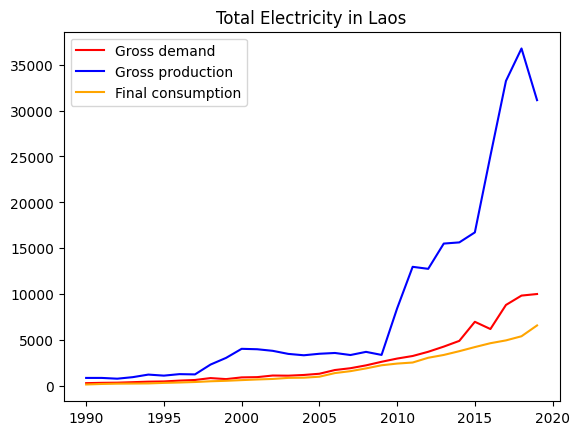

In [588]:
#Visualizing the data

x_Laos = Laos_df['Year']
y1_Laos = Laos_df['Gross demand']
y2_Laos = Laos_df['Gross production']
y3_Laos = Laos_df['Final consumption']

plt.plot(x_Laos, y1_Laos, color='red', label='Gross demand')
plt.plot(x_Laos, y2_Laos, color='blue', label='Gross production')
plt.plot(x_Laos, y3_Laos, color='orange', label='Final consumption')

plt.title('Total Electricity in Laos')
plt.legend()
plt.show()

In [589]:
Laos_demand_fig = px.line(Laos_df, x='Year', y='Gross demand', title='Gross demand of electricity in Laos')
Laos_production_fig = px.line(Laos_df, x='Year', y='Gross production', title='Gross production of electricity in Laos')
Laos_consumption_fig = px.line(Laos_df, x='Year', y='Final consumption', title='Final consumption of electricity in Laos')

Laos_demand_fig.show()
Laos_production_fig.show()
Laos_consumption_fig.show()

In [590]:
#Latvia dataframe

Latvia_df = df.loc[df['Country'] == 'Latvia']
Latvia_max_year = Latvia_df['Year'].max()
Latvia_min_year = Latvia_df['Year'].min()
Latvia_df_Years = np.arange(Latvia_min_year, Latvia_max_year+1, 1)

print(Latvia_df_Years.sum())
print(Latvia_df['Year'].sum())
print(Latvia_df_Years.sum() == Latvia_df['Year'].sum())
print(Latvia_df_Years)
print(np.array(Latvia_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


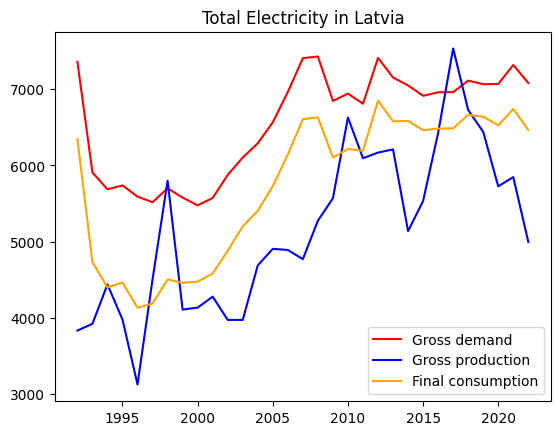

In [591]:
#Visualizing the data

x_Latvia = Latvia_df['Year']
y1_Latvia = Latvia_df['Gross demand']
y2_Latvia = Latvia_df['Gross production']
y3_Latvia = Latvia_df['Final consumption']

plt.plot(x_Latvia, y1_Latvia, color='red', label='Gross demand')
plt.plot(x_Latvia, y2_Latvia, color='blue', label='Gross production')
plt.plot(x_Latvia, y3_Latvia, color='orange', label='Final consumption')

plt.title('Total Electricity in Latvia')
plt.legend()
plt.show()

In [592]:
Latvia_demand_fig = px.line(Latvia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Latvia')
Latvia_production_fig = px.line(Latvia_df, x='Year', y='Gross production', title='Gross production of electricity in Latvia')
Latvia_consumption_fig = px.line(Latvia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Latvia')

Latvia_demand_fig.show()
Latvia_production_fig.show()
Latvia_consumption_fig.show()

In [593]:
#Lebanon dataframe

Lebanon_df = df.loc[df['Country'] == 'Lebanon']
Lebanon_max_year = Lebanon_df['Year'].max()
Lebanon_min_year = Lebanon_df['Year'].min()
Lebanon_df_Years = np.arange(Lebanon_min_year, Lebanon_max_year+1, 1)

print(Lebanon_df_Years.sum())
print(Lebanon_df['Year'].sum())
print(Lebanon_df_Years.sum() == Lebanon_df['Year'].sum())
print(Lebanon_df_Years)
print(np.array(Lebanon_df['Year'].sort_values(ascending=True)))

52195
42115
False
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020]
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2019 2020]


In [594]:
#Libya dataframe

Libya_df = df.loc[df['Country'] == 'Libya']
Libya_max_year = Libya_df['Year'].max()
Libya_min_year = Libya_df['Year'].min()
Libya_df_Years = np.arange(Libya_min_year, Libya_max_year+1, 1)

print(Libya_df_Years.sum())
print(Libya_df['Year'].sum())
print(Libya_df_Years.sum() == Libya_df['Year'].sum())
print(Libya_df_Years)
print(np.array(Libya_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


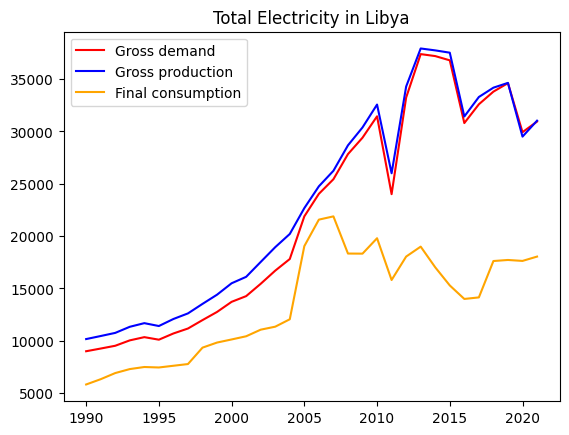

In [595]:
#Visualizing the data

x_Libya = Libya_df['Year']
y1_Libya = Libya_df['Gross demand']
y2_Libya = Libya_df['Gross production']
y3_Libya = Libya_df['Final consumption']

plt.plot(x_Libya, y1_Libya, color='red', label='Gross demand')
plt.plot(x_Libya, y2_Libya, color='blue', label='Gross production')
plt.plot(x_Libya, y3_Libya, color='orange', label='Final consumption')

plt.title('Total Electricity in Libya')
plt.legend()
plt.show()

In [596]:
Libya_demand_fig = px.line(Libya_df, x='Year', y='Gross demand', title='Gross demand of electricity in Libya')
Libya_production_fig = px.line(Libya_df, x='Year', y='Gross production', title='Gross production of electricity in Libya')
Libya_consumption_fig = px.line(Libya_df, x='Year', y='Final consumption', title='Final consumption of electricity in Libya')

Libya_demand_fig.show()
Libya_production_fig.show()
Libya_consumption_fig.show()

In [597]:
#Lithuania dataframe

Lithuania_df = df.loc[df['Country'] == 'Lithuania']
Lithuania_max_year = Lithuania_df['Year'].max()
Lithuania_min_year = Lithuania_df['Year'].min()
Lithuania_df_Years = np.arange(Lithuania_min_year, Lithuania_max_year+1, 1)

print(Lithuania_df_Years.sum())
print(Lithuania_df['Year'].sum())
print(Lithuania_df_Years.sum() == Lithuania_df['Year'].sum())
print(Lithuania_df_Years)
print(np.array(Lithuania_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


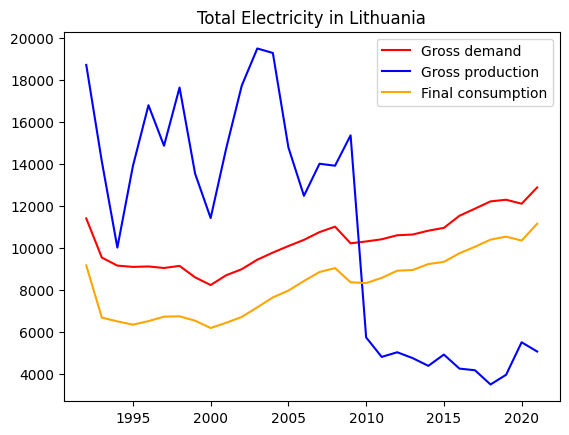

In [598]:
#Visualizing the data

x_Lithuania = Lithuania_df['Year']
y1_Lithuania = Lithuania_df['Gross demand']
y2_Lithuania = Lithuania_df['Gross production']
y3_Lithuania = Lithuania_df['Final consumption']

plt.plot(x_Lithuania, y1_Lithuania, color='red', label='Gross demand')
plt.plot(x_Lithuania, y2_Lithuania, color='blue', label='Gross production')
plt.plot(x_Lithuania, y3_Lithuania, color='orange', label='Final consumption')

plt.title('Total Electricity in Lithuania')
plt.legend()
plt.show()

In [599]:
Lithuania_demand_fig = px.line(Lithuania_df, x='Year', y='Gross demand', title='Gross demand of electricity in Lithuania')
Lithuania_production_fig = px.line(Lithuania_df, x='Year', y='Gross production', title='Gross production of electricity in Lithuania')
Lithuania_consumption_fig = px.line(Lithuania_df, x='Year', y='Final consumption', title='Final consumption of electricity in Lithuania')

Lithuania_demand_fig.show()
Lithuania_production_fig.show()
Lithuania_consumption_fig.show()

In [600]:
#Luxembourg dataframe

Luxembourg_df = df.loc[df['Country'] == 'Luxembourg']
Luxembourg_max_year = Luxembourg_df['Year'].max()
Luxembourg_min_year = Luxembourg_df['Year'].min()
Luxembourg_df_Years = np.arange(Luxembourg_min_year, Luxembourg_max_year+1, 1)

print(Luxembourg_df_Years.sum())
print(Luxembourg_df['Year'].sum())
print(Luxembourg_df_Years.sum() == Luxembourg_df['Year'].sum())
print(Luxembourg_df_Years)
print(np.array(Luxembourg_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


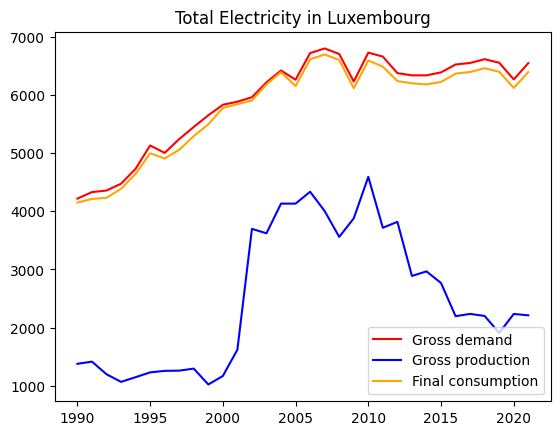

In [601]:
#Visualizing the data

x_Luxembourg = Luxembourg_df['Year']
y1_Luxembourg = Luxembourg_df['Gross demand']
y2_Luxembourg = Luxembourg_df['Gross production']
y3_Luxembourg = Luxembourg_df['Final consumption']

plt.plot(x_Luxembourg, y1_Luxembourg, color='red', label='Gross demand')
plt.plot(x_Luxembourg, y2_Luxembourg, color='blue', label='Gross production')
plt.plot(x_Luxembourg, y3_Luxembourg, color='orange', label='Final consumption')

plt.title('Total Electricity in Luxembourg')
plt.legend()
plt.show()

In [602]:
Luxembourg_demand_fig = px.line(Luxembourg_df, x='Year', y='Gross demand', title='Gross demand of electricity in Luxembourg')
Luxembourg_production_fig = px.line(Luxembourg_df, x='Year', y='Gross production', title='Gross production of electricity in Luxembourg')
Luxembourg_consumption_fig = px.line(Luxembourg_df, x='Year', y='Final consumption', title='Final consumption of electricity in Luxembourg')

Luxembourg_demand_fig.show()
Luxembourg_production_fig.show()
Luxembourg_consumption_fig.show()

In [603]:
#Malawi dataset

Malawi_df = df.loc[df['Country'] == 'Malawi']
Malawi_max_year = Malawi_df['Year'].max()
Malawi_min_year = Malawi_df['Year'].min()
Malawi_df_Years = np.arange(Malawi_min_year, Malawi_max_year+1, 1)

print(Malawi_df_Years.sum())
print(Malawi_df['Year'].sum())
print(Malawi_df_Years.sum() == Malawi_df['Year'].sum())
print(Malawi_df_Years)
print(np.array(Malawi_df['Year'].sort_values(ascending=True)))


60135
40059
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019]
[1990 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2010 2015 2016 2017 2018 2019]


In [604]:
#Malaysia dataframe

Malaysia_df = df.loc[df['Country'] == 'Malaysia']
Malaysia_max_year = Malaysia_df['Year'].max()
Malaysia_min_year = Malaysia_df['Year'].min()
Malaysia_df_Years = np.arange(Malaysia_min_year, Malaysia_max_year+1, 1)

print(Malaysia_df_Years.sum())
print(Malaysia_df['Year'].sum())
print(Malaysia_df_Years.sum() == Malaysia_df['Year'].sum())
print(Malaysia_df_Years)
print(np.array(Malaysia_df['Year'].sort_values(ascending=True)))

60195
54175
False
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [605]:
# Malta dataframe

Malta_df = df.loc[df['Country'] == 'Malta']
Malta_max_year = Malta_df['Year'].max()
Malta_min_year = Malta_df['Year'].min()
Malta_df_Years = np.arange(Malta_min_year, Malta_max_year+1, 1)

print(Malta_df_Years.sum())
print(Malta_df['Year'].sum())
print(Malta_df_Years.sum() == Malta_df['Year'].sum())
print(Malta_df_Years)
print(np.array(Malta_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


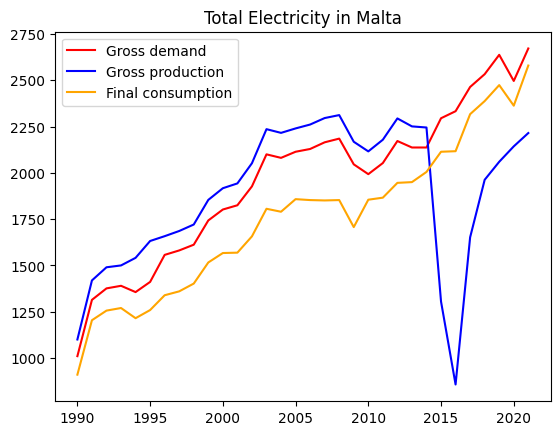

In [606]:
#Visualizing the data

x_Malta = Malta_df['Year']
y1_Malta = Malta_df['Gross demand']
y2_Malta = Malta_df['Gross production']
y3_Malta = Malta_df['Final consumption']

plt.plot(x_Malta, y1_Malta, color='red', label='Gross demand')
plt.plot(x_Malta, y2_Malta, color='blue', label='Gross production')
plt.plot(x_Malta, y3_Malta, color='orange', label='Final consumption')

plt.title('Total Electricity in Malta')
plt.legend()
plt.show()

In [607]:
Malta_demand_fig = px.line(Malta_df, x='Year', y='Gross demand', title='Gross demand of electricity in Malta')
Malta_production_fig = px.line(Malta_df, x='Year', y='Gross production', title='Gross production of electricity in Malta')
Malta_consumption_fig = px.line(Malta_df, x='Year', y='Final consumption', title='Final consumption of electricity in Malta')

Malta_demand_fig.show()
Malta_production_fig.show()
Malta_consumption_fig.show()

In [608]:
# Mauritius dataframe

Mauritius_df = df.loc[df['Country'] == 'Mauritius']
Mauritius_max_year = Mauritius_df['Year'].max()
Mauritius_min_year = Mauritius_df['Year'].min()
Mauritius_df_Years = np.arange(Mauritius_min_year, Mauritius_max_year+1, 1)

print(Mauritius_df_Years.sum())
print(Mauritius_df['Year'].sum())
print(Mauritius_df_Years.sum() == Mauritius_df['Year'].sum())
print(Mauritius_df_Years)
print(np.array(Mauritius_df['Year'].sort_values(ascending=True)))

64176
62174
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


In [609]:
# Mexico dataframe

Mexico_df = df.loc[df['Country'] == 'Mexico']
Mexico_max_year = Mexico_df['Year'].max()
Mexico_min_year = Mexico_df['Year'].min()
Mexico_df_Years = np.arange(Mexico_min_year, Mexico_max_year+1, 1)

print(Mexico_df_Years.sum())
print(Mexico_df['Year'].sum())
print(Mexico_df_Years.sum() == Mexico_df['Year'].sum())
print(Mexico_df_Years)
print(np.array(Mexico_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


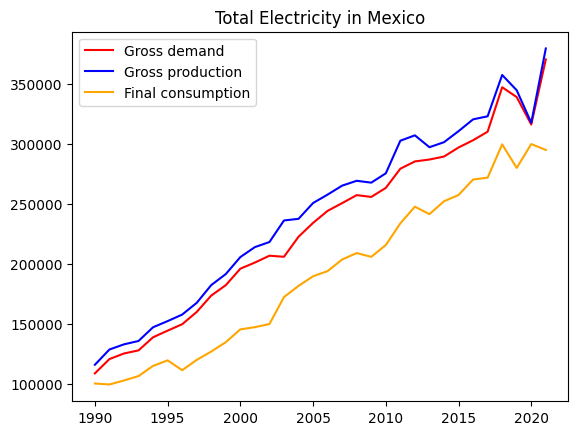

In [610]:
#Visualizing the data

x_Mexico  = Mexico_df['Year']
y1_Mexico = Mexico_df['Gross demand']
y2_Mexico = Mexico_df['Gross production']
y3_Mexico = Mexico_df['Final consumption']

plt.plot(x_Mexico, y1_Mexico, color='red', label='Gross demand')
plt.plot(x_Mexico, y2_Mexico, color='blue', label='Gross production')
plt.plot(x_Mexico, y3_Mexico, color='orange', label='Final consumption')

plt.title('Total Electricity in Mexico')
plt.legend()
plt.show()

In [611]:
Mexico_demand_fig = px.line(Mexico_df, x='Year', y='Gross demand', title='Gross demand of electricity in Mexico')
Mexico_production_fig = px.line(Mexico_df, x='Year', y='Gross production', title='Gross production of electricity in Mexico')
Mexico_consumption_fig = px.line(Mexico_df, x='Year', y='Final consumption', title='Final consumption of electricity in Mexico')

Mexico_demand_fig.show()
Mexico_production_fig.show()
Mexico_consumption_fig.show()

In [612]:
# Mongolia dataframe

Mongolia_df = df.loc[df['Country'] == 'Mongolia']
Mongolia_max_year = Mongolia_df['Year'].max()
Mongolia_min_year = Mongolia_df['Year'].min()
Mongolia_df_Years = np.arange(Mongolia_min_year, Mongolia_max_year+1, 1)

print(Mongolia_df_Years.sum())
print(Mongolia_df['Year'].sum())
print(Mongolia_df_Years.sum() == Mongolia_df['Year'].sum())
print(Mongolia_df_Years)
print(np.array(Mongolia_df['Year'].sort_values(ascending=True)))

52221
46221
False
[1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1996 1997 1998 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [613]:
# Morocco dataframe

Morocco_df = df.loc[df['Country'] == 'Morocco']
Morocco_max_year = Morocco_df['Year'].max()
Morocco_min_year = Morocco_df['Year'].min()
Morocco_df_Years = np.arange(Morocco_min_year, Morocco_max_year+1, 1)

print(Morocco_df_Years.sum())
print(Morocco_df['Year'].sum())
print(Morocco_df_Years.sum() == Morocco_df['Year'].sum())
print(Morocco_df_Years)
print(np.array(Morocco_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


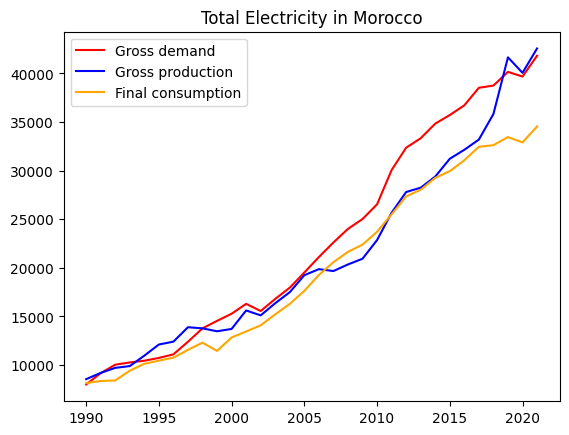

In [614]:
#Visualizing the data

x_Morocco = Morocco_df['Year']
y1_Morocco = Morocco_df['Gross demand']
y2_Morocco = Morocco_df['Gross production']
y3_Morocco = Morocco_df['Final consumption']

plt.plot(x_Morocco, y1_Morocco, color='red', label='Gross demand')
plt.plot(x_Morocco, y2_Morocco, color='blue', label='Gross production')
plt.plot(x_Morocco, y3_Morocco, color='orange', label='Final consumption')

plt.title('Total Electricity in Morocco')
plt.legend()
plt.show()

In [615]:
Morocco_demand_fig = px.line(Morocco_df, x='Year', y='Gross demand', title='Gross demand of electricity in Morocco')
Morocco_production_fig = px.line(Morocco_df, x='Year', y='Gross production', title='Gross production of electricity in Morocco')
Morocco_consumption_fig = px.line(Morocco_df, x='Year', y='Final consumption', title='Final consumption of electricity in Morocco')

Morocco_demand_fig.show()
Morocco_production_fig.show()
Morocco_consumption_fig.show()

In [616]:
# Mozambique dataframe

Mozambique_df = df.loc[df['Country'] == 'Mozambique']
Mozambique_max_year = Mozambique_df['Year'].max()
Mozambique_min_year = Mozambique_df['Year'].min()
Mozambique_df_Years = np.arange(Mozambique_min_year, Mozambique_max_year+1, 1)

print(Mozambique_df_Years.sum())
print(Mozambique_df['Year'].sum())
print(Mozambique_df_Years.sum() == Mozambique_df['Year'].sum())
print(Mozambique_df_Years)
print(np.array(Mozambique_df['Year'].sort_values(ascending=True)))

64176
62181
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


In [617]:
# Myanmar dataframe

Myanmar_df = df.loc[df['Country'] == 'Myanmar']
Myanmar_max_year = Myanmar_df['Year'].max()
Myanmar_min_year = Myanmar_df['Year'].min()
Myanmar_df_Years = np.arange(Myanmar_min_year, Myanmar_max_year+1, 1)

print(Myanmar_df_Years.sum())
print(Myanmar_df['Year'].sum())
print(Myanmar_df_Years.sum() == Myanmar_df['Year'].sum())
print(Myanmar_df_Years)
print(np.array(Myanmar_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


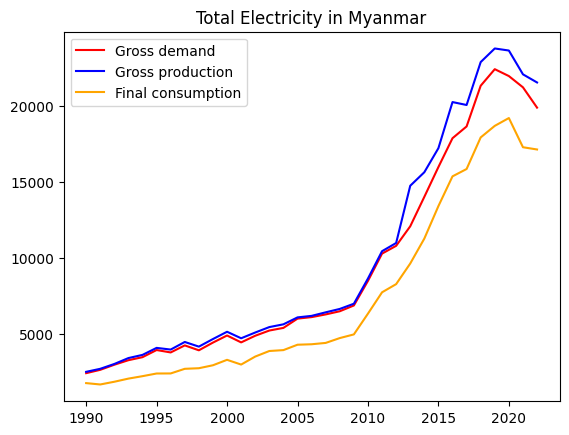

In [618]:
#Visualizing the data

x_Myanmar = Myanmar_df['Year']
y1_Myanmar = Myanmar_df['Gross demand']
y2_Myanmar = Myanmar_df['Gross production']
y3_Myanmar = Myanmar_df['Final consumption']

plt.plot(x_Myanmar, y1_Myanmar, color='red', label='Gross demand')
plt.plot(x_Myanmar, y2_Myanmar, color='blue', label='Gross production')
plt.plot(x_Myanmar, y3_Myanmar, color='orange', label='Final consumption')

plt.title('Total Electricity in Myanmar')
plt.legend()
plt.show()

In [619]:
Myanmar_demand_fig = px.line(Myanmar_df, x='Year', y='Gross demand', title='Gross demand of electricity in Myanmar')
Myanmar_production_fig = px.line(Myanmar_df, x='Year', y='Gross production', title='Gross production of electricity in Myanmar')
Myanmar_consumption_fig = px.line(Myanmar_df, x='Year', y='Final consumption', title='Final consumption of electricity in Myanmar')

Myanmar_demand_fig.show()
Myanmar_production_fig.show()
Myanmar_consumption_fig.show()

In [620]:
# Nepal dataframe

Nepal_df = df.loc[df['Country'] == 'Nepal']
Nepal_max_year = Nepal_df['Year'].max()
Nepal_min_year = Nepal_df['Year'].min()
Nepal_df_Years = np.arange(Nepal_min_year, Nepal_max_year+1, 1)

print(Nepal_df_Years.sum())
print(Nepal_df['Year'].sum())
print(Nepal_df_Years.sum() == Nepal_df['Year'].sum())
print(Nepal_df_Years)
print(np.array(Nepal_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


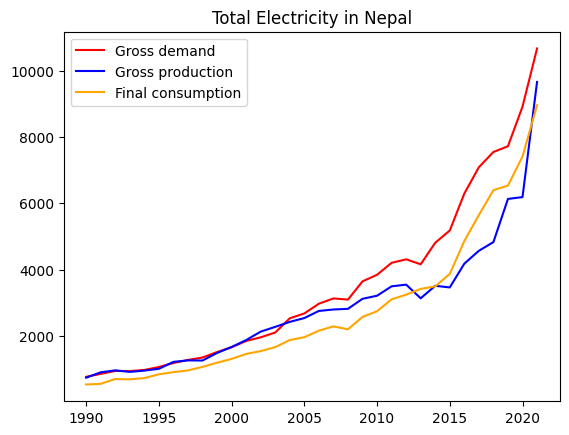

In [621]:
#Visualizing the data

x_Nepal = Nepal_df['Year']
y1_Nepal = Nepal_df['Gross demand']
y2_Nepal = Nepal_df['Gross production']
y3_Nepal = Nepal_df['Final consumption']

plt.plot(x_Nepal, y1_Nepal, color='red', label='Gross demand')
plt.plot(x_Nepal, y2_Nepal, color='blue', label='Gross production')
plt.plot(x_Nepal, y3_Nepal, color='orange', label='Final consumption')

plt.title('Total Electricity in Nepal')
plt.legend()
plt.show()

In [622]:
Nepal_demand_fig = px.line(Nepal_df, x='Year', y='Gross demand', title='Gross demand of electricity in Nepal')
Nepal_production_fig = px.line(Nepal_df, x='Year', y='Gross production', title='Gross production of electricity in Nepal')
Nepal_consumption_fig = px.line(Nepal_df, x='Year', y='Final consumption', title='Final consumption of electricity in Nepal')

Nepal_demand_fig.show()
Nepal_production_fig.show()
Nepal_consumption_fig.show()

In [623]:
# Netherlands (Kingd. of the) dataframe

Netherlands_df = df.loc[df['Country'] == 'Netherlands (Kingd. of the)']
Netherlands_max_year = Netherlands_df['Year'].max()
Netherlands_min_year = Netherlands_df['Year'].min()
Netherlands_df_Years = np.arange(Netherlands_min_year, Netherlands_max_year+1, 1)

print(Netherlands_df_Years.sum())
print(Netherlands_df['Year'].sum())
print(Netherlands_df_Years.sum() == Netherlands_df['Year'].sum())
print(Netherlands_df_Years)
print(np.array(Netherlands_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


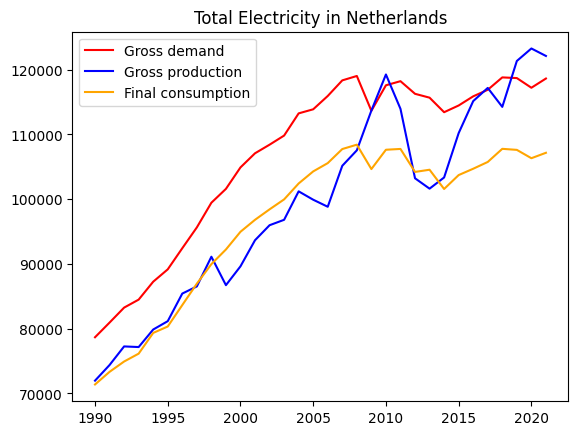

In [624]:
#Visualizing the data

x_Netherlands = Netherlands_df['Year']
y1_Netherlands = Netherlands_df['Gross demand']
y2_Netherlands = Netherlands_df['Gross production']
y3_Netherlands = Netherlands_df['Final consumption']

plt.plot(x_Netherlands, y1_Netherlands, color='red', label='Gross demand')
plt.plot(x_Netherlands, y2_Netherlands, color='blue', label='Gross production')
plt.plot(x_Netherlands, y3_Netherlands, color='orange', label='Final consumption')

plt.title('Total Electricity in Netherlands')
plt.legend()
plt.show()

In [625]:
Netherlands_demand_fig = px.line(Netherlands_df, x='Year', y='Gross demand', title='Gross demand of electricity in Netherlands')
Netherlands_production_fig = px.line(Netherlands_df, x='Year', y='Gross production', title='Gross production of electricity in Netherlands')
Netherlands_consumption_fig = px.line(Netherlands_df, x='Year', y='Final consumption', title='Final consumption of electricity in Netherlands')

Netherlands_demand_fig.show()
Netherlands_production_fig.show()
Netherlands_consumption_fig.show()

In [626]:
# New Caledonia dataframe

New_Caledonia_df = df.loc[df['Country'] == 'New Caledonia']
New_Caledonia_max_year = New_Caledonia_df['Year'].max()
New_Caledonia_min_year = New_Caledonia_df['Year'].min()
New_Caledonia_df_Years = np.arange(New_Caledonia_min_year, New_Caledonia_max_year+1, 1)

print(New_Caledonia_df_Years.sum())
print(New_Caledonia_df['Year'].sum())
print(New_Caledonia_df_Years.sum() == New_Caledonia_df['Year'].sum())
print(New_Caledonia_df_Years)
print(np.array(New_Caledonia_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


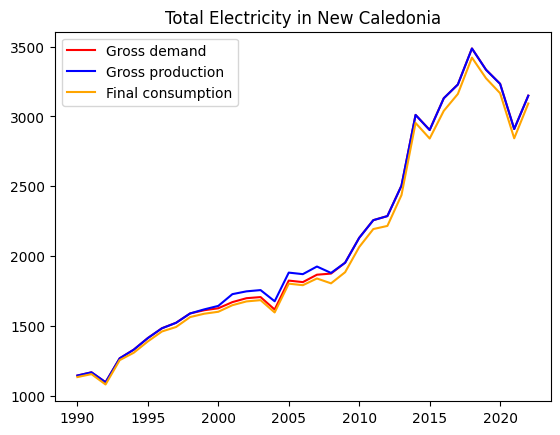

In [627]:
#Visualizing the data

x_New_Caledonia = New_Caledonia_df['Year']
y1_New_Caledonia = New_Caledonia_df['Gross demand']
y2_New_Caledonia = New_Caledonia_df['Gross production']
y3_New_Caledonia = New_Caledonia_df['Final consumption']

plt.plot(x_New_Caledonia, y1_New_Caledonia, color='red', label='Gross demand')
plt.plot(x_New_Caledonia, y2_New_Caledonia, color='blue', label='Gross production')
plt.plot(x_New_Caledonia, y3_New_Caledonia, color='orange', label='Final consumption')

plt.title('Total Electricity in New Caledonia')
plt.legend()
plt.show()

In [628]:
New_Caledonia_demand_fig = px.line(New_Caledonia_df, x='Year', y='Gross demand', title='Gross demand of electricity in New Caledonia')
New_Caledonia_production_fig = px.line(New_Caledonia_df, x='Year', y='Gross production', title='Gross production of electricity in New Caledonia')
New_Caledonia_consumption_fig = px.line(New_Caledonia_df, x='Year', y='Final consumption', title='Final consumption of electricity in New Caledonia')

New_Caledonia_demand_fig.show()
New_Caledonia_production_fig.show()
New_Caledonia_consumption_fig.show()

In [629]:
# New Zealand dataframe

New_Zealand_df = df.loc[df['Country'] == 'New Zealand']
New_Zealand_max_year = New_Zealand_df['Year'].max()
New_Zealand_min_year = New_Zealand_df['Year'].min()
New_Zealand_df_Years = np.arange(New_Zealand_min_year, New_Zealand_max_year+1, 1)

print(New_Zealand_df_Years.sum())
print(New_Zealand_df['Year'].sum())
print(New_Zealand_df_Years.sum() == New_Zealand_df['Year'].sum())
print(New_Zealand_df_Years)
print(np.array(New_Zealand_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


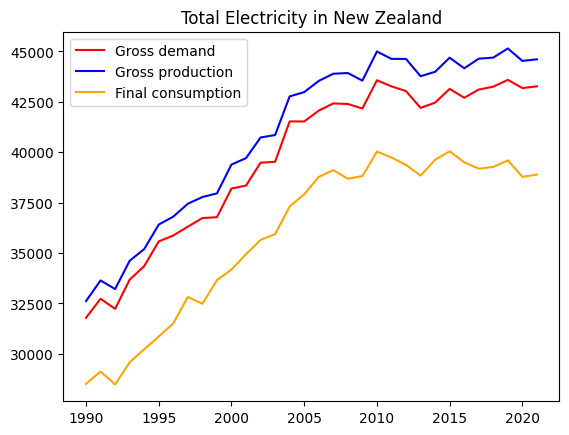

In [630]:
#Visualizing the data

x_New_Zealand = New_Zealand_df['Year']
y1_New_Zealand = New_Zealand_df['Gross demand']
y2_New_Zealand = New_Zealand_df['Gross production']
y3_New_Zealand = New_Zealand_df['Final consumption']

plt.plot(x_New_Zealand, y1_New_Zealand, color='red', label='Gross demand')
plt.plot(x_New_Zealand, y2_New_Zealand, color='blue', label='Gross production')
plt.plot(x_New_Zealand, y3_New_Zealand, color='orange', label='Final consumption')

plt.title('Total Electricity in New Zealand')
plt.legend()
plt.show()

In [631]:
New_Zealand_demand_fig = px.line(New_Zealand_df, x='Year', y='Gross demand', title='Gross demand of electricity in New Zealand')
New_Zealand_production_fig = px.line(New_Zealand_df, x='Year', y='Gross production', title='Gross production of electricity in New Zealand')
New_Zealand_consumption_fig = px.line(New_Zealand_df, x='Year', y='Final consumption', title='Final consumption of electricity in New Zealand')

New_Zealand_demand_fig.show()
New_Zealand_production_fig.show()
New_Zealand_consumption_fig.show()

In [632]:
# Nicaragua dataframe

Nicaragua_df = df.loc[df['Country'] == 'Nicaragua']
Nicaragua_max_year = Nicaragua_df['Year'].max()
Nicaragua_min_year = Nicaragua_df['Year'].min()
Nicaragua_df_Years = np.arange(Nicaragua_min_year, Nicaragua_max_year+1, 1)

print(Nicaragua_df_Years.sum())
print(Nicaragua_df['Year'].sum())
print(Nicaragua_df_Years.sum() == Nicaragua_df['Year'].sum())
print(Nicaragua_df_Years)
print(np.array(Nicaragua_df['Year'].sort_values(ascending=True)))

64176
54201
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [633]:
# Nigeria dataframe

Nigeria_df = df.loc[df['Country'] == 'Nigeria']
Nigeria_max_year = Nigeria_df['Year'].max()
Nigeria_min_year = Nigeria_df['Year'].min()
Nigeria_df_Years = np.arange(Nigeria_min_year, Nigeria_max_year+1, 1)

print(Nigeria_df_Years.sum())
print(Nigeria_df['Year'].sum())
print(Nigeria_df_Years.sum() == Nigeria_df['Year'].sum())
print(Nigeria_df_Years)
print(np.array(Nigeria_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


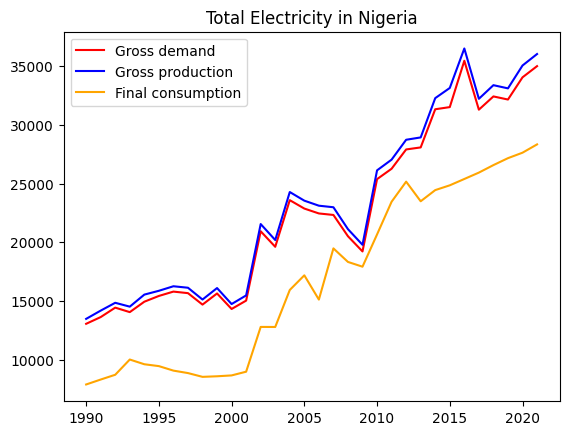

In [634]:
#Visualizing the data

x_Nigeria = Nigeria_df['Year']
y1_Nigeria = Nigeria_df['Gross demand']
y2_Nigeria = Nigeria_df['Gross production']
y3_Nigeria = Nigeria_df['Final consumption']

plt.plot(x_Nigeria, y1_Nigeria, color='red', label='Gross demand')
plt.plot(x_Nigeria, y2_Nigeria, color='blue', label='Gross production')
plt.plot(x_Nigeria, y3_Nigeria, color='orange', label='Final consumption')

plt.title('Total Electricity in Nigeria')
plt.legend()
plt.show()

In [635]:
Nigeria_demand_fig = px.line(Nigeria_df, x='Year', y='Gross demand', title='Gross demand of electricity in Nigeria')
Nigeria_production_fig = px.line(Nigeria_df, x='Year', y='Gross production', title='Gross production of electricity in Nigeria')
Nigeria_consumption_fig = px.line(Nigeria_df, x='Year', y='Final consumption', title='Final consumption of electricity in Nigeria')

Nigeria_demand_fig.show()
Nigeria_production_fig.show()
Nigeria_consumption_fig.show()

In [636]:
# North Macedonia dataframe

North_Macedonia_df = df.loc[df['Country'] == 'North Macedonia']
North_Macedonia_max_year = North_Macedonia_df['Year'].max()
North_Macedonia_min_year = North_Macedonia_df['Year'].min()
North_Macedonia_df_Years = np.arange(North_Macedonia_min_year, North_Macedonia_max_year+1, 1)

print(North_Macedonia_df_Years.sum())
print(North_Macedonia_df['Year'].sum())
print(North_Macedonia_df_Years.sum() == North_Macedonia_df['Year'].sum())
print(North_Macedonia_df_Years)
print(np.array(North_Macedonia_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


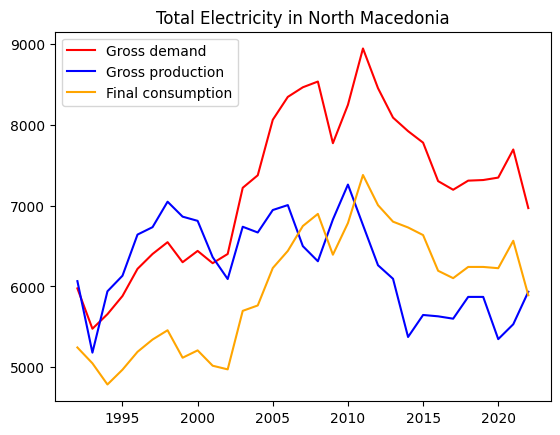

In [637]:
#Visualizing the data

x_North_Macedonia = North_Macedonia_df['Year']
y1_North_Macedonia = North_Macedonia_df['Gross demand']
y2_North_Macedonia = North_Macedonia_df['Gross production']
y3_North_Macedonia = North_Macedonia_df['Final consumption']

plt.plot(x_North_Macedonia, y1_North_Macedonia, color='red', label='Gross demand')
plt.plot(x_North_Macedonia, y2_North_Macedonia, color='blue', label='Gross production')
plt.plot(x_North_Macedonia, y3_North_Macedonia, color='orange', label='Final consumption')

plt.title('Total Electricity in North Macedonia')
plt.legend()
plt.show()

In [638]:
North_Macedonia_demand_fig = px.line(North_Macedonia_df, x='Year', y='Gross demand', title='Gross demand of electricity in North_Macedonia')
North_Macedonia_production_fig = px.line(North_Macedonia_df, x='Year', y='Gross production', title='Gross production of electricity in North_Macedonia')
North_Macedonia_consumption_fig = px.line(North_Macedonia_df, x='Year', y='Final consumption', title='Final consumption of electricity in North_Macedonia')

North_Macedonia_demand_fig.show()
North_Macedonia_production_fig.show()
North_Macedonia_consumption_fig.show()

In [639]:
# Norway dataframe

Norway_df = df.loc[df['Country'] == 'Norway']
Norway_max_year = Norway_df['Year'].max()
Norway_min_year = Norway_df['Year'].min()
Norway_df_Years = np.arange(Norway_min_year, Norway_max_year+1, 1)

print(Norway_df_Years.sum())
print(Norway_df['Year'].sum())
print(Norway_df_Years.sum() == Norway_df['Year'].sum())
print(Norway_df_Years)
print(np.array(Norway_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


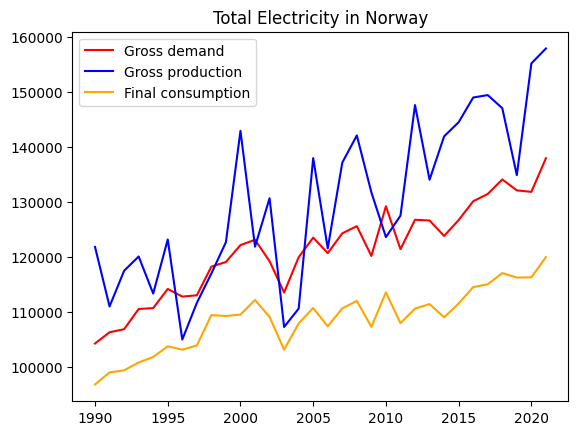

In [640]:
#Visualizing the data

x_Norway = Norway_df['Year']
y1_Norway = Norway_df['Gross demand']
y2_Norway = Norway_df['Gross production']
y3_Norway = Norway_df['Final consumption']

plt.plot(x_Norway, y1_Norway, color='red', label='Gross demand')
plt.plot(x_Norway, y2_Norway, color='blue', label='Gross production')
plt.plot(x_Norway, y3_Norway, color='orange', label='Final consumption')

plt.title('Total Electricity in Norway')
plt.legend()
plt.show()

In [641]:
Norway_demand_fig = px.line(Norway_df, x='Year', y='Gross demand', title='Gross demand of electricity in Norway')
Norway_production_fig = px.line(Norway_df, x='Year', y='Gross production', title='Gross production of electricity in Norway')
Norway_consumption_fig = px.line(Norway_df, x='Year', y='Final consumption', title='Final consumption of electricity in Norway')

Norway_demand_fig.show()
Norway_production_fig.show()
Norway_consumption_fig.show()

In [642]:
# Oman dataframe

Oman_df = df.loc[df['Country'] == 'Oman']
Oman_max_year = Oman_df['Year'].max()
Oman_min_year = Oman_df['Year'].min()
Oman_df_Years = np.arange(Oman_min_year, Oman_max_year+1, 1)

print(Oman_df_Years.sum())
print(Oman_df['Year'].sum())
print(Oman_df_Years.sum() == Oman_df['Year'].sum())
print(Oman_df_Years)
print(np.array(Oman_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


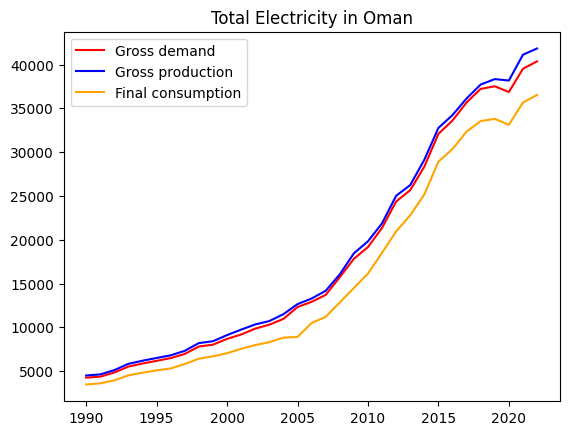

In [643]:
#Visualizing the data

x_Oman = Oman_df['Year']
y1_Oman = Oman_df['Gross demand']
y2_Oman = Oman_df['Gross production']
y3_Oman = Oman_df['Final consumption']

plt.plot(x_Oman, y1_Oman, color='red', label='Gross demand')
plt.plot(x_Oman, y2_Oman, color='blue', label='Gross production')
plt.plot(x_Oman, y3_Oman, color='orange', label='Final consumption')

plt.title('Total Electricity in Oman')
plt.legend()
plt.show()

In [644]:
Oman_demand_fig = px.line(Oman_df, x='Year', y='Gross demand', title='Gross demand of electricity in Oman')
Oman_production_fig = px.line(Oman_df, x='Year', y='Gross production', title='Gross production of electricity in Oman')
Oman_consumption_fig = px.line(Oman_df, x='Year', y='Final consumption', title='Final consumption of electricity in Oman')

Oman_demand_fig.show()
Oman_production_fig.show()
Oman_consumption_fig.show()

In [645]:
# Panama dataframe

Panama_df = df.loc[df['Country'] == 'Panama']
Panama_max_year = Panama_df['Year'].max()
Panama_min_year = Panama_df['Year'].min()
Panama_df_Years = np.arange(Panama_min_year, Panama_max_year+1, 1)

print(Panama_df_Years.sum())
print(Panama_df['Year'].sum())
print(Panama_df_Years.sum() == Panama_df['Year'].sum())
print(Panama_df_Years)
print(np.array(Panama_df['Year'].sort_values(ascending=True)))

66198
64201
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021 2022]


In [646]:
# Paraguay dataframe

Paraguay_df = df.loc[df['Country'] == 'Paraguay']
Paraguay_max_year = Paraguay_df['Year'].max()
Paraguay_min_year = Paraguay_df['Year'].min()
Paraguay_df_Years = np.arange(Paraguay_min_year, Paraguay_max_year+1, 1)

print(Paraguay_df_Years.sum())
print(Paraguay_df['Year'].sum())
print(Paraguay_df_Years.sum() == Paraguay_df['Year'].sum())
print(Paraguay_df_Years)
print(np.array(Paraguay_df['Year'].sort_values(ascending=True)))

56238
56238
True
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022]
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022]


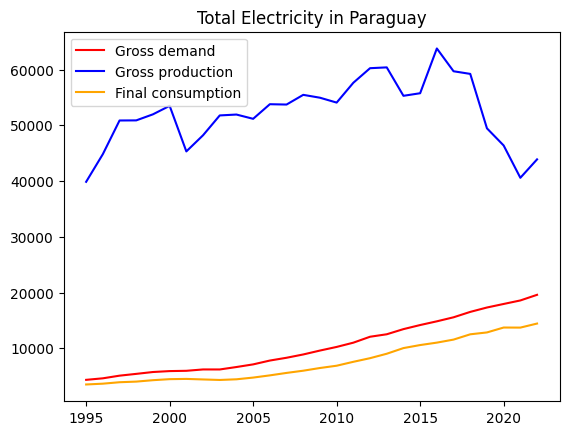

In [647]:
#Visualizing the data

x_Paraguay = Paraguay_df['Year']
y1_Paraguay = Paraguay_df['Gross demand']
y2_Paraguay = Paraguay_df['Gross production']
y3_Paraguay = Paraguay_df['Final consumption']

plt.plot(x_Paraguay, y1_Paraguay, color='red', label='Gross demand')
plt.plot(x_Paraguay, y2_Paraguay, color='blue', label='Gross production')
plt.plot(x_Paraguay, y3_Paraguay, color='orange', label='Final consumption')

plt.title('Total Electricity in Paraguay')
plt.legend()
plt.show()

In [648]:
Paraguay_demand_fig = px.line(Paraguay_df, x='Year', y='Gross demand', title='Gross demand of electricity in Paraguay')
Paraguay_production_fig = px.line(Paraguay_df, x='Year', y='Gross production', title='Gross production of electricity in Paraguay')
Paraguay_consumption_fig = px.line(Paraguay_df, x='Year', y='Final consumption', title='Final consumption of electricity in Paraguay')

Paraguay_demand_fig.show()
Paraguay_production_fig.show()
Paraguay_consumption_fig.show()

In [649]:
# Peru dataframe

Peru_df = df.loc[df['Country'] == 'Peru']
Peru_max_year = Peru_df['Year'].max()
Peru_min_year = Peru_df['Year'].min()
Peru_df_Years = np.arange(Peru_min_year, Peru_max_year+1, 1)

print(Peru_df_Years.sum())
print(Peru_df['Year'].sum())
print(Peru_df_Years.sum() == Peru_df['Year'].sum())
print(Peru_df_Years)
print(np.array(Peru_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


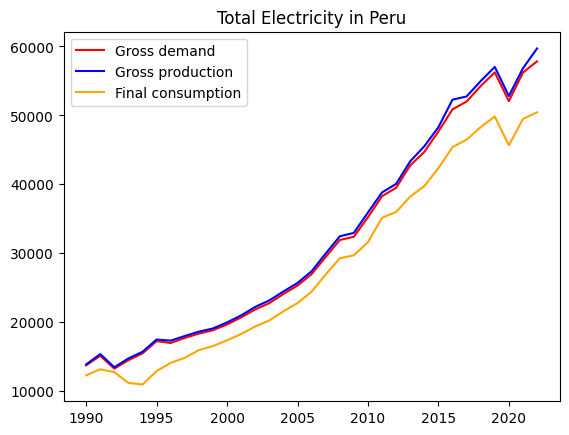

In [650]:
#Visualizing the data

x_Peru = Peru_df['Year']
y1_Peru = Peru_df['Gross demand']
y2_Peru = Peru_df['Gross production']
y3_Peru = Peru_df['Final consumption']

plt.plot(x_Peru, y1_Peru, color='red', label='Gross demand')
plt.plot(x_Peru, y2_Peru, color='blue', label='Gross production')
plt.plot(x_Peru, y3_Peru, color='orange', label='Final consumption')

plt.title('Total Electricity in Peru')
plt.legend()
plt.show()

In [651]:
Peru_demand_fig = px.line(Peru_df, x='Year', y='Gross demand', title='Gross demand of electricity in Peru')
Peru_production_fig = px.line(Peru_df, x='Year', y='Gross production', title='Gross production of electricity in Peru')
Peru_consumption_fig = px.line(Peru_df, x='Year', y='Final consumption', title='Final consumption of electricity in Peru')

Peru_demand_fig.show()
Peru_production_fig.show()
Peru_consumption_fig.show()

In [652]:
# Philippines dataframe

Philippines_df = df.loc[df['Country'] == 'Philippines']
Philippines_max_year = Philippines_df['Year'].max()
Philippines_min_year = Philippines_df['Year'].min()
Philippines_df_Years = np.arange(Philippines_min_year, Philippines_max_year+1, 1)

print(Philippines_df_Years.sum())
print(Philippines_df['Year'].sum())
print(Philippines_df_Years.sum() == Philippines_df['Year'].sum())
print(Philippines_df_Years)
print(np.array(Philippines_df['Year'].sort_values(ascending=True)))

44143
44143
True
[1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017]
[1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017]


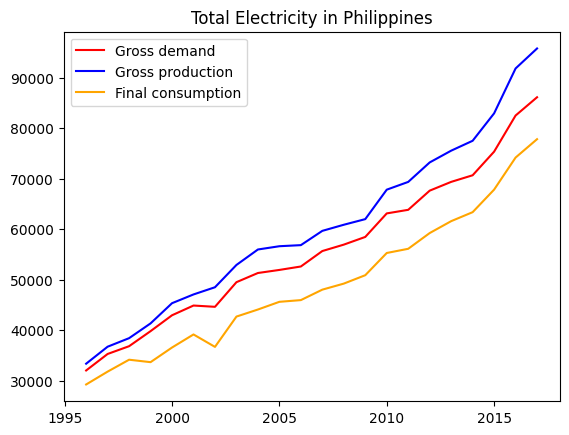

In [653]:
#Visualizing the data

x_Philippines = Philippines_df['Year']
y1_Philippines = Philippines_df['Gross demand']
y2_Philippines = Philippines_df['Gross production']
y3_Philippines = Philippines_df['Final consumption']

plt.plot(x_Philippines, y1_Philippines, color='red', label='Gross demand')
plt.plot(x_Philippines, y2_Philippines, color='blue', label='Gross production')
plt.plot(x_Philippines, y3_Philippines, color='orange', label='Final consumption')

plt.title('Total Electricity in Philippines')
plt.legend()
plt.show()

In [654]:
Philippines_demand_fig = px.line(Philippines_df, x='Year', y='Gross demand', title='Gross demand of electricity in Philippines')
Philippines_production_fig = px.line(Philippines_df, x='Year', y='Gross production', title='Gross production of electricity in Philippines')
Philippines_consumption_fig = px.line(Philippines_df, x='Year', y='Final consumption', title='Final consumption of electricity in Philippines')

Philippines_demand_fig.show()
Philippines_production_fig.show()
Philippines_consumption_fig.show()

In [655]:
# Poland dataframe

Poland_df = df.loc[df['Country'] == 'Poland']
Poland_max_year = Poland_df['Year'].max()
Poland_min_year = Poland_df['Year'].min()
Poland_df_Years = np.arange(Poland_min_year, Poland_max_year+1, 1)

print(Poland_df_Years.sum())
print(Poland_df['Year'].sum())
print(Poland_df_Years.sum() == Poland_df['Year'].sum())
print(Poland_df_Years)
print(np.array(Poland_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


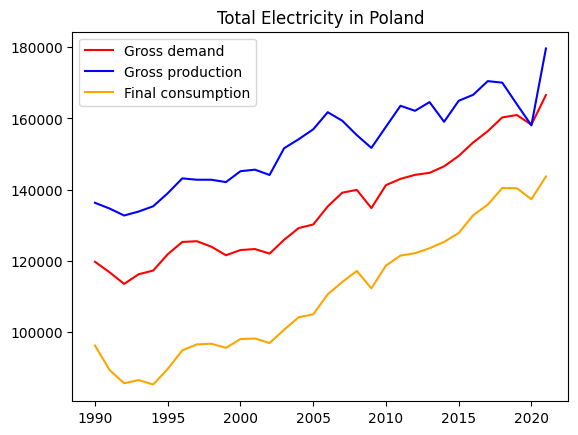

In [656]:
#Visualizing the data

x_Poland = Poland_df['Year']
y1_Poland = Poland_df['Gross demand']
y2_Poland = Poland_df['Gross production']
y3_Poland = Poland_df['Final consumption']

plt.plot(x_Poland, y1_Poland, color='red', label='Gross demand')
plt.plot(x_Poland, y2_Poland, color='blue', label='Gross production')
plt.plot(x_Poland, y3_Poland, color='orange', label='Final consumption')

plt.title('Total Electricity in Poland')
plt.legend()
plt.show()

In [657]:
Poland_demand_fig = px.line(Poland_df, x='Year', y='Gross demand', title='Gross demand of electricity in Poland')
Poland_production_fig = px.line(Poland_df, x='Year', y='Gross production', title='Gross production of electricity in Poland')
Poland_consumption_fig = px.line(Poland_df, x='Year', y='Final consumption', title='Final consumption of electricity in Poland')

Poland_demand_fig.show()
Poland_production_fig.show()
Poland_consumption_fig.show()

In [658]:
# Portugal dataframe

Portugal_df = df.loc[df['Country'] == 'Portugal']
Portugal_max_year = Portugal_df['Year'].max()
Portugal_min_year = Portugal_df['Year'].min()
Portugal_df_Years = np.arange(Portugal_min_year, Portugal_max_year+1, 1)

print(Portugal_df_Years.sum())
print(Portugal_df['Year'].sum())
print(Portugal_df_Years.sum() == Portugal_df['Year'].sum())
print(Portugal_df_Years)
print(np.array(Portugal_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


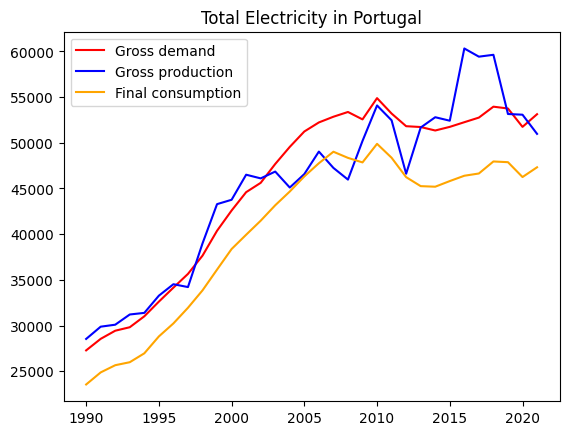

In [659]:
#Visualizing the data

x_Portugal = Portugal_df['Year']
y1_Portugal = Portugal_df['Gross demand']
y2_Portugal = Portugal_df['Gross production']
y3_Portugal = Portugal_df['Final consumption']

plt.plot(x_Portugal, y1_Portugal, color='red', label='Gross demand')
plt.plot(x_Portugal, y2_Portugal, color='blue', label='Gross production')
plt.plot(x_Portugal, y3_Portugal, color='orange', label='Final consumption')

plt.title('Total Electricity in Portugal')
plt.legend()
plt.show()

In [660]:
Portugal_demand_fig = px.line(Portugal_df, x='Year', y='Gross demand', title='Gross demand of electricity in Portugal')
Portugal_production_fig = px.line(Portugal_df, x='Year', y='Gross production', title='Gross production of electricity in Portugal')
Portugal_consumption_fig = px.line(Portugal_df, x='Year', y='Final consumption', title='Final consumption of electricity in Portugal')

Portugal_demand_fig.show()
Portugal_production_fig.show()
Portugal_consumption_fig.show()

In [661]:
# Puerto Rico dataframe

Puerto_Rico_df = df.loc[df['Country'] == 'Puerto Rico']
Puerto_Rico_max_year = Puerto_Rico_df['Year'].max()
Puerto_Rico_min_year = Puerto_Rico_df['Year'].min()
Puerto_Rico_df_Years = np.arange(Puerto_Rico_min_year, Puerto_Rico_max_year+1, 1)

print(Puerto_Rico_df_Years.sum())
print(Puerto_Rico_df['Year'].sum())
print(Puerto_Rico_df_Years.sum() == Puerto_Rico_df['Year'].sum())
print(Puerto_Rico_df_Years)
print(np.array(Puerto_Rico_df['Year'].sort_values(ascending=True)))

46253
46253
True
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021 2022]
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019 2020 2021 2022]


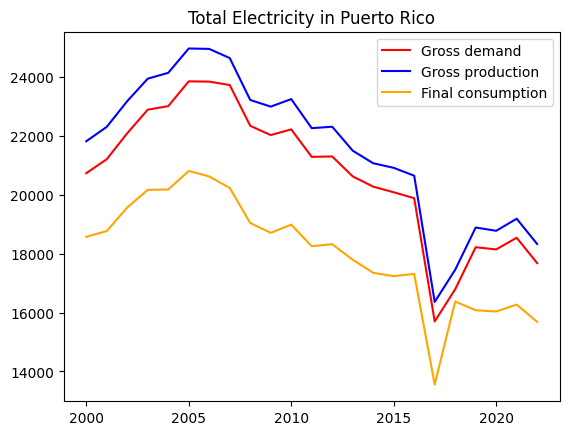

In [662]:
#Visualizing the data

x_Puerto_Rico = Puerto_Rico_df['Year']
y1_Puerto_Rico = Puerto_Rico_df['Gross demand']
y2_Puerto_Rico = Puerto_Rico_df['Gross production']
y3_Puerto_Rico = Puerto_Rico_df['Final consumption']

plt.plot(x_Puerto_Rico, y1_Puerto_Rico, color='red', label='Gross demand')
plt.plot(x_Puerto_Rico, y2_Puerto_Rico, color='blue', label='Gross production')
plt.plot(x_Puerto_Rico, y3_Puerto_Rico, color='orange', label='Final consumption')

plt.title('Total Electricity in Puerto Rico')
plt.legend()
plt.show()

In [663]:
Puerto_Rico_demand_fig = px.line(Puerto_Rico_df, x='Year', y='Gross demand', title='Gross demand of electricity in Puerto Rico')
Puerto_Rico_production_fig = px.line(Puerto_Rico_df, x='Year', y='Gross production', title='Gross production of electricity in Puerto Rico')
Puerto_Rico_consumption_fig = px.line(Puerto_Rico_df, x='Year', y='Final consumption', title='Final consumption of electricity in Puerto Rico')

Puerto_Rico_demand_fig.show()
Puerto_Rico_production_fig.show()
Puerto_Rico_consumption_fig.show()

In [664]:
# Qatar dataframe

Qatar_df = df.loc[df['Country'] == 'Qatar']
Qatar_max_year = Qatar_df['Year'].max()
Qatar_min_year = Qatar_df['Year'].min()
Qatar_df_Years = np.arange(Qatar_min_year, Qatar_max_year+1, 1)

print(Qatar_df_Years.sum())
print(Qatar_df['Year'].sum())
print(Qatar_df_Years.sum() == Qatar_df['Year'].sum())
print(Qatar_df_Years)
print(np.array(Qatar_df['Year'].sort_values(ascending=True)))

48228
48228
True
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


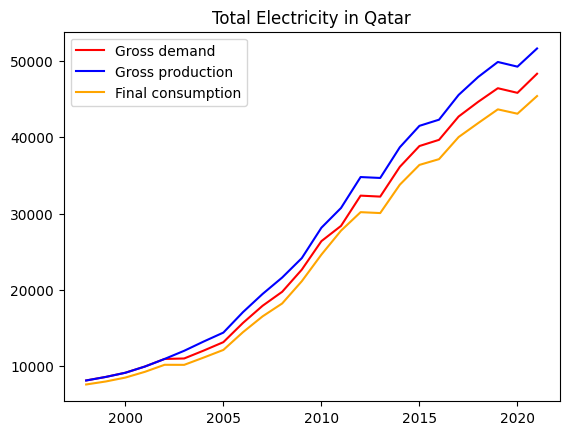

In [665]:
#Visualizing the data

x_Qatar = Qatar_df['Year']
y1_Qatar = Qatar_df['Gross demand']
y2_Qatar = Qatar_df['Gross production']
y3_Qatar = Qatar_df['Final consumption']

plt.plot(x_Qatar, y1_Qatar, color='red', label='Gross demand')
plt.plot(x_Qatar, y2_Qatar, color='blue', label='Gross production')
plt.plot(x_Qatar, y3_Qatar, color='orange', label='Final consumption')

plt.title('Total Electricity in Qatar')
plt.legend()
plt.show()

In [666]:
Qatar_demand_fig = px.line(Qatar_df, x='Year', y='Gross demand', title='Gross demand of electricity in Qatar')
Qatar_production_fig = px.line(Qatar_df, x='Year', y='Gross production', title='Gross production of electricity in Qatar')
Qatar_consumption_fig = px.line(Qatar_df, x='Year', y='Final consumption', title='Final consumption of electricity in Qatar')

Qatar_demand_fig.show()
Qatar_production_fig.show()
Qatar_consumption_fig.show()

In [667]:
# Republic of Moldova dataframe

Moldova_df = df.loc[df['Country'] == 'Republic of Moldova']
Moldova_max_year = Moldova_df['Year'].max()
Moldova_min_year = Moldova_df['Year'].min()
Moldova_df_Years = np.arange(Moldova_min_year, Moldova_max_year+1, 1)

print(Moldova_df_Years.sum())
print(Moldova_df['Year'].sum())
print(Moldova_df_Years.sum() == Moldova_df['Year'].sum())
print(Moldova_df_Years)
print(np.array(Moldova_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


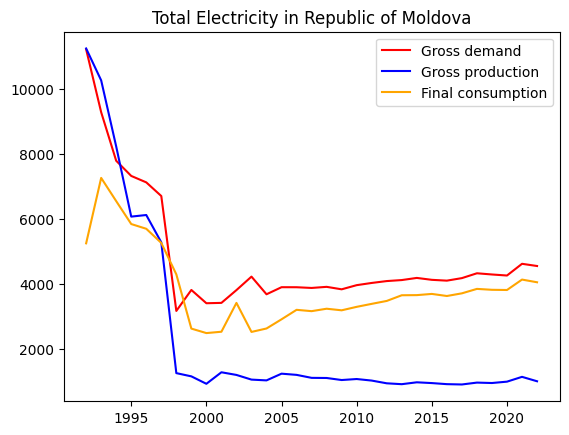

In [668]:
#Visualizing the data

x_Moldova = Moldova_df['Year']
y1_Moldova = Moldova_df['Gross demand']
y2_Moldova = Moldova_df['Gross production']
y3_Moldova = Moldova_df['Final consumption']

plt.plot(x_Moldova, y1_Moldova, color='red', label='Gross demand')
plt.plot(x_Moldova, y2_Moldova, color='blue', label='Gross production')
plt.plot(x_Moldova, y3_Moldova, color='orange', label='Final consumption')

plt.title('Total Electricity in Republic of Moldova')
plt.legend()
plt.show()

In [669]:
Moldova_demand_fig = px.line(Moldova_df, x='Year', y='Gross demand', title='Gross demand of electricity in Republic of Moldova')
Moldova_production_fig = px.line(Moldova_df, x='Year', y='Gross production', title='Gross production of electricity in Republic of Moldova')
Moldova_consumption_fig = px.line(Moldova_df, x='Year', y='Final consumption', title='Final consumption of electricity in Republic of Moldova')

Moldova_demand_fig.show()
Moldova_production_fig.show()
Moldova_consumption_fig.show()

In [670]:
# Romania dataframe

Romania_df = df.loc[df['Country'] == 'Romania']
Romania_max_year = Romania_df['Year'].max()
Romania_min_year = Romania_df['Year'].min()
Romania_df_Years = np.arange(Romania_min_year, Romania_max_year+1, 1)

print(Romania_df_Years.sum())
print(Romania_df['Year'].sum())
print(Romania_df_Years.sum() == Romania_df['Year'].sum())
print(Romania_df_Years)
print(np.array(Romania_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


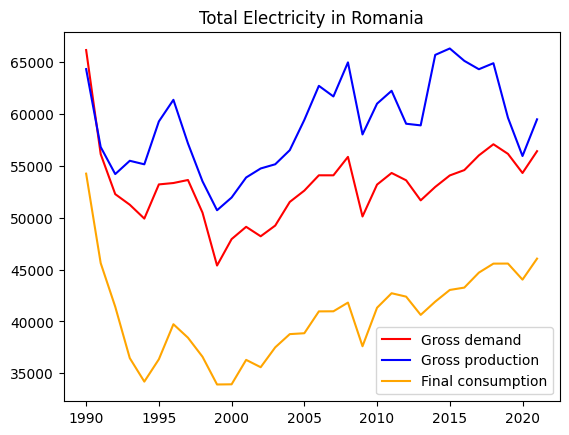

In [671]:
#Visualizing the data

x_Romania = Romania_df['Year']
y1_Romania = Romania_df['Gross demand']
y2_Romania = Romania_df['Gross production']
y3_Romania = Romania_df['Final consumption']

plt.plot(x_Romania, y1_Romania, color='red', label='Gross demand')
plt.plot(x_Romania, y2_Romania, color='blue', label='Gross production')
plt.plot(x_Romania, y3_Romania, color='orange', label='Final consumption')

plt.title('Total Electricity in Romania')
plt.legend()
plt.show()

In [672]:
Romania_demand_fig = px.line(Romania_df, x='Year', y='Gross demand', title='Gross demand of electricity in Romania')
Romania_production_fig = px.line(Romania_df, x='Year', y='Gross production', title='Gross production of electricity in Romania')
Romania_consumption_fig = px.line(Romania_df, x='Year', y='Final consumption', title='Final consumption of electricity in Romania')

Romania_demand_fig.show()
Romania_production_fig.show()
Romania_consumption_fig.show()

In [673]:
# Russian Federation dataframe

Russia_df = df.loc[df['Country'] == 'Russian Federation']
Russia_max_year = Russia_df['Year'].max()
Russia_min_year = Russia_df['Year'].min()
Russia_df_Years = np.arange(Russia_min_year, Russia_max_year+1, 1)

print(Russia_df_Years.sum())
print(Russia_df['Year'].sum())
print(Russia_df_Years.sum() == Russia_df['Year'].sum())
print(Russia_df_Years)
print(np.array(Russia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


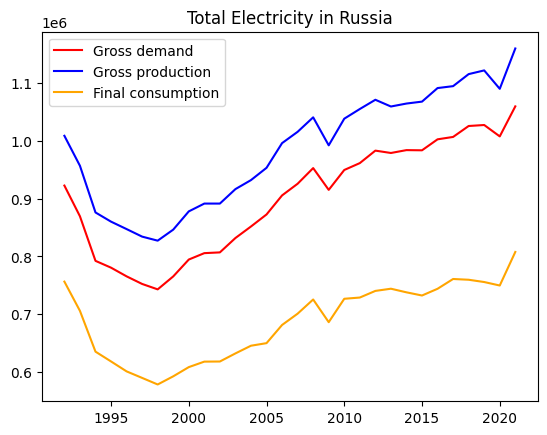

In [674]:
#Visualizing the data

x_Russia = Russia_df['Year']
y1_Russia = Russia_df['Gross demand']
y2_Russia = Russia_df['Gross production']
y3_Russia = Russia_df['Final consumption']

plt.plot(x_Russia, y1_Russia, color='red', label='Gross demand')
plt.plot(x_Russia, y2_Russia, color='blue', label='Gross production')
plt.plot(x_Russia, y3_Russia, color='orange', label='Final consumption')

plt.title('Total Electricity in Russia')
plt.legend()
plt.show()

In [675]:
Russia_demand_fig = px.line(Russia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Russia')
Russia_production_fig = px.line(Russia_df, x='Year', y='Gross production', title='Gross production of electricity in Russia')
Russia_consumption_fig = px.line(Russia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Russia')

Russia_demand_fig.show()
Russia_production_fig.show()
Russia_consumption_fig.show()

In [676]:
# Saudi Arabia dataframe

Saudi_Arabia_df = df.loc[df['Country'] == 'Saudi Arabia']
Saudi_Arabia_max_year = Saudi_Arabia_df['Year'].max()
Saudi_Arabia_min_year = Saudi_Arabia_df['Year'].min()
Saudi_Arabia_df_Years = np.arange(Saudi_Arabia_min_year, Saudi_Arabia_max_year+1, 1)

print(Saudi_Arabia_df_Years.sum())
print(Saudi_Arabia_df['Year'].sum())
print(Saudi_Arabia_df_Years.sum() == Saudi_Arabia_df['Year'].sum())
print(Saudi_Arabia_df_Years)
print(np.array(Saudi_Arabia_df['Year'].sort_values(ascending=True)))

54216
54216
True
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


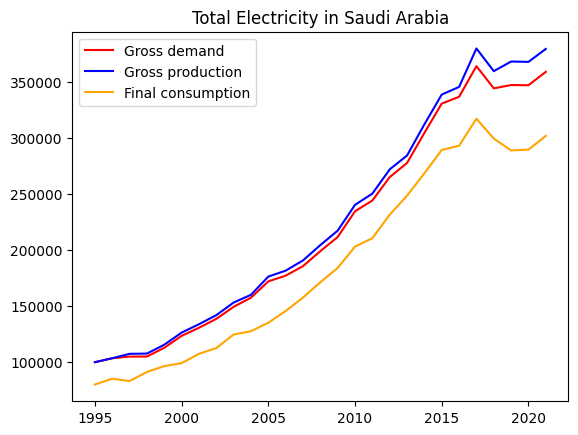

In [677]:
#Visualizing the data

x_Saudi_Arabia = Saudi_Arabia_df['Year']
y1_Saudi_Arabia = Saudi_Arabia_df['Gross demand']
y2_Saudi_Arabia = Saudi_Arabia_df['Gross production']
y3_Saudi_Arabia = Saudi_Arabia_df['Final consumption']

plt.plot(x_Saudi_Arabia, y1_Saudi_Arabia, color='red', label='Gross demand')
plt.plot(x_Saudi_Arabia, y2_Saudi_Arabia, color='blue', label='Gross production')
plt.plot(x_Saudi_Arabia, y3_Saudi_Arabia, color='orange', label='Final consumption')

plt.title('Total Electricity in Saudi Arabia')
plt.legend()
plt.show()

In [678]:
Saudi_Arabia_demand_fig = px.line(Saudi_Arabia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Saudi_Arabia')
Saudi_Arabia_production_fig = px.line(Saudi_Arabia_df, x='Year', y='Gross production', title='Gross production of electricity in Saudi_Arabia')
Saudi_Arabia_consumption_fig = px.line(Saudi_Arabia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Saudi_Arabia')

Saudi_Arabia_demand_fig.show()
Saudi_Arabia_production_fig.show()
Saudi_Arabia_consumption_fig.show()

In [679]:
# Senegal dataframe

Senegal_df = df.loc[df['Country'] == 'Senegal']
Senegal_max_year = Senegal_df['Year'].max()
Senegal_min_year = Senegal_df['Year'].min()
Senegal_df_Years = np.arange(Senegal_min_year, Senegal_max_year+1, 1)

print(Senegal_df_Years.sum())
print(Senegal_df['Year'].sum())
print(Senegal_df_Years.sum() == Senegal_df['Year'].sum())
print(Senegal_df_Years)
print(np.array(Senegal_df['Year'].sort_values(ascending=True)))

62155
60136
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2020]


In [680]:
# Singapore dataframe

Singapore_df = df.loc[df['Country'] == 'Singapore']
Singapore_max_year = Singapore_df['Year'].max()
Singapore_min_year = Singapore_df['Year'].min()
Singapore_df_Years = np.arange(Singapore_min_year, Singapore_max_year+1, 1)

print(Singapore_df_Years.sum())
print(Singapore_df['Year'].sum())
print(Singapore_df_Years.sum() == Singapore_df['Year'].sum())
print(Singapore_df_Years)
print(np.array(Singapore_df['Year'].sort_values(ascending=True)))

60225
60225
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021 2022]


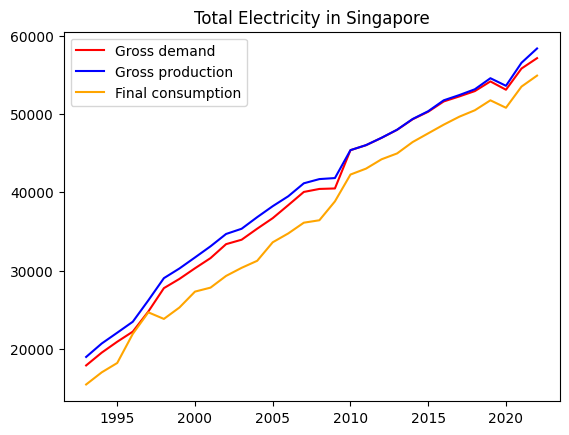

In [681]:
#Visualizing the data

x_Singapore = Singapore_df['Year']
y1_Singapore = Singapore_df['Gross demand']
y2_Singapore = Singapore_df['Gross production']
y3_Singapore = Singapore_df['Final consumption']

plt.plot(x_Singapore, y1_Singapore, color='red', label='Gross demand')
plt.plot(x_Singapore, y2_Singapore, color='blue', label='Gross production')
plt.plot(x_Singapore, y3_Singapore, color='orange', label='Final consumption')

plt.title('Total Electricity in Singapore')
plt.legend()
plt.show()

In [682]:
Singapore_demand_fig = px.line(Singapore_df, x='Year', y='Gross demand', title='Gross demand of electricity in Singapore')
Singapore_production_fig = px.line(Singapore_df, x='Year', y='Gross production', title='Gross production of electricity in Singapore')
Singapore_consumption_fig = px.line(Singapore_df, x='Year', y='Final consumption', title='Final consumption of electricity in Singapore')

Singapore_demand_fig.show()
Singapore_production_fig.show()
Singapore_consumption_fig.show()

In [683]:
# Slovakia dataframe

Slovakia_df = df.loc[df['Country'] == 'Slovakia']
Slovakia_max_year = Slovakia_df['Year'].max()
Slovakia_min_year = Slovakia_df['Year'].min()
Slovakia_df_Years = np.arange(Slovakia_min_year, Slovakia_max_year+1, 1)

print(Slovakia_df_Years.sum())
print(Slovakia_df['Year'].sum())
print(Slovakia_df_Years.sum() == Slovakia_df['Year'].sum())
print(Slovakia_df_Years)
print(np.array(Slovakia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


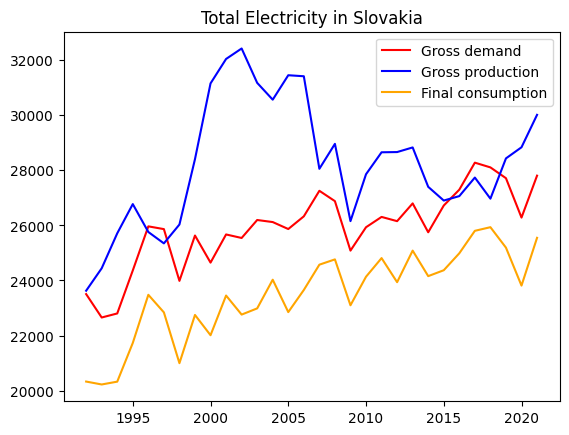

In [684]:
#Visualizing the data

x_Slovakia = Slovakia_df['Year']
y1_Slovakia = Slovakia_df['Gross demand']
y2_Slovakia = Slovakia_df['Gross production']
y3_Slovakia = Slovakia_df['Final consumption']

plt.plot(x_Slovakia, y1_Slovakia, color='red', label='Gross demand')
plt.plot(x_Slovakia, y2_Slovakia, color='blue', label='Gross production')
plt.plot(x_Slovakia, y3_Slovakia, color='orange', label='Final consumption')

plt.title('Total Electricity in Slovakia')
plt.legend()
plt.show()

In [685]:
Slovakia_demand_fig = px.line(Slovakia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Slovakia')
Slovakia_production_fig = px.line(Slovakia_df, x='Year', y='Gross production', title='Gross production of electricity in Slovakia')
Slovakia_consumption_fig = px.line(Slovakia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Slovakia')

Slovakia_demand_fig.show()
Slovakia_production_fig.show()
Slovakia_consumption_fig.show()

In [686]:
# Slovenia dataframe

Slovenia_df = df.loc[df['Country'] == 'Slovenia']
Slovenia_max_year = Slovenia_df['Year'].max()
Slovenia_min_year = Slovenia_df['Year'].min()
Slovenia_df_Years = np.arange(Slovenia_min_year, Slovenia_max_year+1, 1)

print(Slovenia_df_Years.sum())
print(Slovenia_df['Year'].sum())
print(Slovenia_df_Years.sum() == Slovenia_df['Year'].sum())
print(Slovenia_df_Years)
print(np.array(Slovenia_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


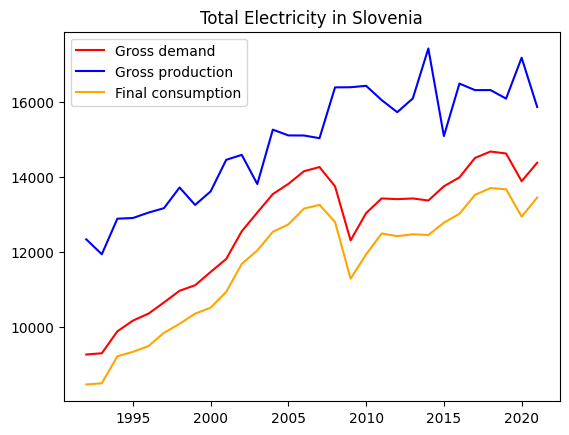

In [687]:
#Visualizing the data

x_Slovenia = Slovenia_df['Year']
y1_Slovenia = Slovenia_df['Gross demand']
y2_Slovenia = Slovenia_df['Gross production']
y3_Slovenia = Slovenia_df['Final consumption']

plt.plot(x_Slovenia, y1_Slovenia, color='red', label='Gross demand')
plt.plot(x_Slovenia, y2_Slovenia, color='blue', label='Gross production')
plt.plot(x_Slovenia, y3_Slovenia, color='orange', label='Final consumption')

plt.title('Total Electricity in Slovenia')
plt.legend()
plt.show()

In [688]:
Slovenia_demand_fig = px.line(Slovenia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Slovenia')
Slovenia_production_fig = px.line(Slovenia_df, x='Year', y='Gross production', title='Gross production of electricity in Slovenia')
Slovenia_consumption_fig = px.line(Slovenia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Slovenia')

Slovenia_demand_fig.show()
Slovenia_production_fig.show()
Slovenia_consumption_fig.show()

In [689]:
# South Africa dataframe

South_Africa_df = df.loc[df['Country'] == 'South Africa']
South_Africa_max_year = South_Africa_df['Year'].max()
South_Africa_min_year = South_Africa_df['Year'].min()
South_Africa_df_Years = np.arange(South_Africa_min_year, South_Africa_max_year+1, 1)

print(South_Africa_df_Years.sum())
print(South_Africa_df['Year'].sum())
print(South_Africa_df_Years.sum() == South_Africa_df['Year'].sum())
print(South_Africa_df_Years)
print(np.array(South_Africa_df['Year'].sort_values(ascending=True)))

46230
46230
True
[1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2019 2020 2021]
[1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2019 2020 2021]


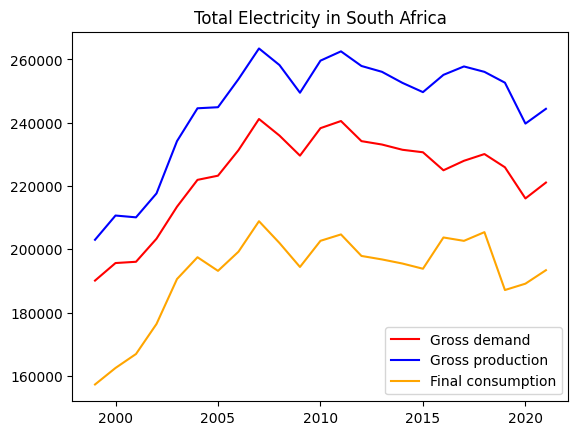

In [690]:
#Visualizing the data

x_South_Africa = South_Africa_df['Year']
y1_South_Africa = South_Africa_df['Gross demand']
y2_South_Africa = South_Africa_df['Gross production']
y3_South_Africa = South_Africa_df['Final consumption']

plt.plot(x_South_Africa, y1_South_Africa, color='red', label='Gross demand')
plt.plot(x_South_Africa, y2_South_Africa, color='blue', label='Gross production')
plt.plot(x_South_Africa, y3_South_Africa, color='orange', label='Final consumption')

plt.title('Total Electricity in South Africa')
plt.legend()
plt.show()

In [691]:
South_Africa_demand_fig = px.line(South_Africa_df, x='Year', y='Gross demand', title='Gross demand of electricity in South Africa')
South_Africa_production_fig = px.line(South_Africa_df, x='Year', y='Gross production', title='Gross production of electricity in South Africa')
South_Africa_consumption_fig = px.line(South_Africa_df, x='Year', y='Final consumption', title='Final consumption of electricity in South Africa')

South_Africa_demand_fig.show()
South_Africa_production_fig.show()
South_Africa_consumption_fig.show()

In [692]:
# Spain dataframe

Spain_df = df.loc[df['Country'] == 'Spain']
Spain_max_year = Spain_df['Year'].max()
Spain_min_year = Spain_df['Year'].min()
Spain_df_Years = np.arange(Spain_min_year, Spain_max_year+1, 1)

print(Spain_df_Years.sum())
print(Spain_df['Year'].sum())
print(Spain_df_Years.sum() == Spain_df['Year'].sum())
print(Spain_df_Years)
print(np.array(Spain_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


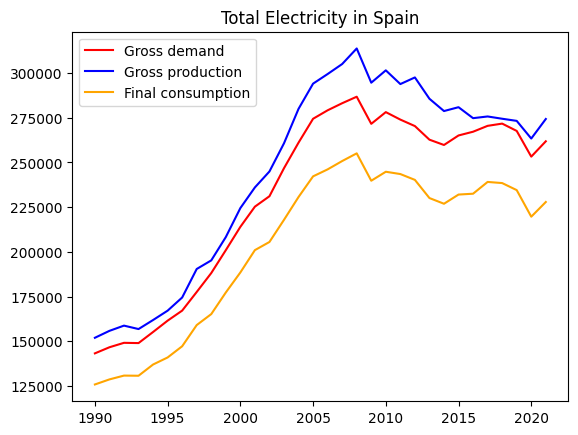

In [693]:
#Visualizing the data

x_Spain = Spain_df['Year']
y1_Spain = Spain_df['Gross demand']
y2_Spain = Spain_df['Gross production']
y3_Spain = Spain_df['Final consumption']

plt.plot(x_Spain, y1_Spain, color='red', label='Gross demand')
plt.plot(x_Spain, y2_Spain, color='blue', label='Gross production')
plt.plot(x_Spain, y3_Spain, color='orange', label='Final consumption')

plt.title('Total Electricity in Spain')
plt.legend()
plt.show()

In [694]:
Spain_demand_fig = px.line(Spain_df, x='Year', y='Gross demand', title='Gross demand of electricity in Spain')
Spain_production_fig = px.line(Spain_df, x='Year', y='Gross production', title='Gross production of electricity in Spain')
Spain_consumption_fig = px.line(Spain_df, x='Year', y='Final consumption', title='Final consumption of electricity in Spain')

Spain_demand_fig.show()
Spain_production_fig.show()
Spain_consumption_fig.show()

In [695]:
# St. Helena and Depend. dataframe

St_Helena_df = df.loc[df['Country'] == 'St. Helena and Depend.']
St_Helena_max_year = St_Helena_df['Year'].max()
St_Helena_min_year = St_Helena_df['Year'].min()
St_Helena_df_Years = np.arange(St_Helena_min_year, St_Helena_max_year+1, 1)

print(St_Helena_df_Years.sum())
print(St_Helena_df['Year'].sum())
print(St_Helena_df_Years.sum() == St_Helena_df['Year'].sum())
print(St_Helena_df_Years)
print(np.array(St_Helena_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


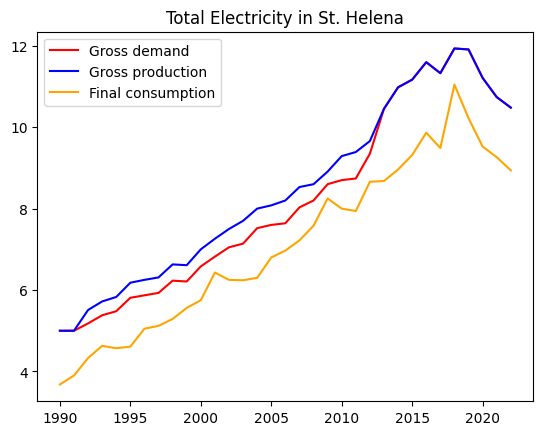

In [696]:
#Visualizing the data

x_St_Helena = St_Helena_df['Year']
y1_St_Helena = St_Helena_df['Gross demand']
y2_St_Helena = St_Helena_df['Gross production']
y3_St_Helena = St_Helena_df['Final consumption']

plt.plot(x_St_Helena, y1_St_Helena, color='red', label='Gross demand')
plt.plot(x_St_Helena, y2_St_Helena, color='blue', label='Gross production')
plt.plot(x_St_Helena, y3_St_Helena, color='orange', label='Final consumption')

plt.title('Total Electricity in St. Helena')
plt.legend()
plt.show()

In [697]:
St_Helena_demand_fig = px.line(St_Helena_df, x='Year', y='Gross demand', title='Gross demand of electricity in St. Helena')
St_Helena_production_fig = px.line(St_Helena_df, x='Year', y='Gross production', title='Gross production of electricity in St. Helena')
St_Helena_consumption_fig = px.line(St_Helena_df, x='Year', y='Final consumption', title='Final consumption of electricity in St. Helena')

St_Helena_demand_fig.show()
St_Helena_production_fig.show()
St_Helena_consumption_fig.show()

In [698]:
# St. Lucia dataframe

St_Lucia_df = df.loc[df['Country'] == 'St. Lucia']
St_Lucia_max_year = St_Lucia_df['Year'].max()
St_Lucia_min_year = St_Lucia_df['Year'].min()
St_Lucia_df_Years = np.arange(St_Lucia_min_year, St_Lucia_max_year+1, 1)

print(St_Lucia_df_Years.sum())
print(St_Lucia_df['Year'].sum())
print(St_Lucia_df_Years.sum() == St_Lucia_df['Year'].sum())
print(St_Lucia_df_Years)
print(np.array(St_Lucia_df['Year'].sort_values(ascending=True)))

66198
64207
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021 2022]


In [699]:
# St. Vincent-Grenadines dataframe

St_VincentGrenadines_df = df.loc[df['Country'] == 'St. Vincent-Grenadines']
St_VincentGrenadines_max_year = St_VincentGrenadines_df['Year'].max()
St_VincentGrenadines_min_year = St_VincentGrenadines_df['Year'].min()
St_VincentGrenadines_df_Years = np.arange(St_VincentGrenadines_min_year, St_VincentGrenadines_max_year+1, 1)

print(St_VincentGrenadines_df_Years.sum())
print(St_VincentGrenadines_df['Year'].sum())
print(St_VincentGrenadines_df_Years.sum() == St_VincentGrenadines_df['Year'].sum())
print(St_VincentGrenadines_df_Years)
print(np.array(St_VincentGrenadines_df['Year'].sort_values(ascending=True)))

62155
62155
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020]


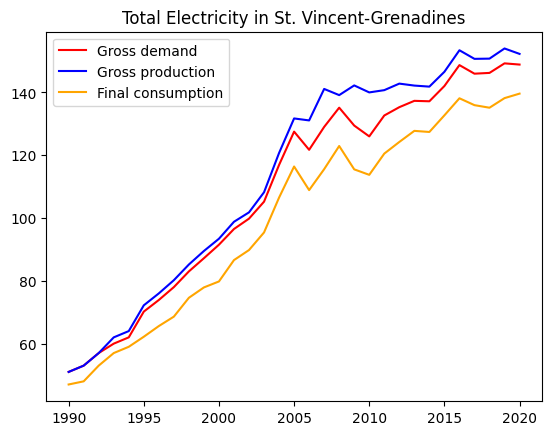

In [700]:
#Visualizing the data

x_St_VincentGrenadines = St_VincentGrenadines_df['Year']
y1_St_VincentGrenadines = St_VincentGrenadines_df['Gross demand']
y2_St_VincentGrenadines = St_VincentGrenadines_df['Gross production']
y3_St_VincentGrenadines = St_VincentGrenadines_df['Final consumption']

plt.plot(x_St_VincentGrenadines, y1_St_VincentGrenadines, color='red', label='Gross demand')
plt.plot(x_St_VincentGrenadines, y2_St_VincentGrenadines, color='blue', label='Gross production')
plt.plot(x_St_VincentGrenadines, y3_St_VincentGrenadines, color='orange', label='Final consumption')

plt.title('Total Electricity in St. Vincent-Grenadines')
plt.legend()
plt.show()

In [701]:
St_VincentGrenadines_demand_fig = px.line(St_VincentGrenadines_df, x='Year', y='Gross demand', title='Gross demand of electricity in St. Vincent-Grenadines')
St_VincentGrenadines_production_fig = px.line(St_VincentGrenadines_df, x='Year', y='Gross production', title='Gross production of electricity in St. Vincent-Grenadines')
St_VincentGrenadines_consumption_fig = px.line(St_VincentGrenadines_df, x='Year', y='Final consumption', title='Final consumption of electricity in St. Vincent-Grenadines')

St_VincentGrenadines_demand_fig.show()
St_VincentGrenadines_production_fig.show()
St_VincentGrenadines_consumption_fig.show()

In [702]:
# State of Palestine dataframe

Palestine_df = df.loc[df['Country'] == 'State of Palestine']
Palestine_max_year = Palestine_df['Year'].max()
Palestine_min_year = Palestine_df['Year'].min()
Palestine_df_Years = np.arange(Palestine_min_year, Palestine_max_year+1, 1)

print(Palestine_df_Years.sum())
print(Palestine_df['Year'].sum())
print(Palestine_df_Years.sum() == Palestine_df['Year'].sum())
print(Palestine_df_Years)
print(np.array(Palestine_df['Year'].sort_values(ascending=True)))

42231
42231
True
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014
 2015 2016 2017 2018 2019 2020 2021]
[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014
 2015 2016 2017 2018 2019 2020 2021]


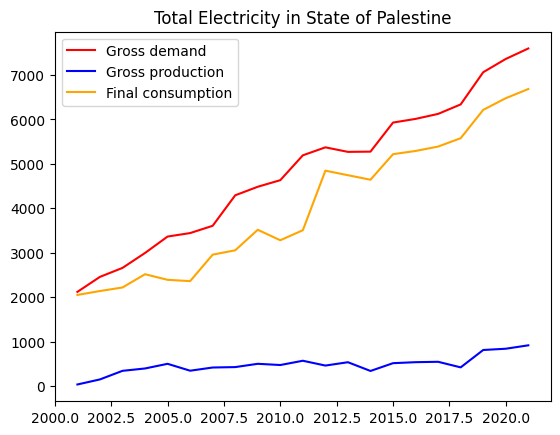

In [703]:
#Visualizing the data

x_Palestine = Palestine_df['Year']
y1_Palestine = Palestine_df['Gross demand']
y2_Palestine = Palestine_df['Gross production']
y3_Palestine = Palestine_df['Final consumption']

plt.plot(x_Palestine, y1_Palestine, color='red', label='Gross demand')
plt.plot(x_Palestine, y2_Palestine, color='blue', label='Gross production')
plt.plot(x_Palestine, y3_Palestine, color='orange', label='Final consumption')

plt.title('Total Electricity in State of Palestine')
plt.legend()
plt.show()

In [704]:
Palestine_demand_fig = px.line(Palestine_df, x='Year', y='Gross demand', title='Gross demand of electricity in State of Palestine')
Palestine_production_fig = px.line(Palestine_df, x='Year', y='Gross production', title='Gross production of electricity in State of Palestine')
Palestine_consumption_fig = px.line(Palestine_df, x='Year', y='Final consumption', title='Final consumption of electricity in State of Palestine')

Palestine_demand_fig.show()
Palestine_production_fig.show()
Palestine_consumption_fig.show()

In [705]:
# Suriname dataframe

Suriname_df = df.loc[df['Country'] == 'Suriname']
Suriname_max_year = Suriname_df['Year'].max()
Suriname_min_year = Suriname_df['Year'].min()
Suriname_df_Years = np.arange(Suriname_min_year, Suriname_max_year+1, 1)

print(Suriname_df_Years.sum())
print(Suriname_df['Year'].sum())
print(Suriname_df_Years.sum() == Suriname_df['Year'].sum())
print(Suriname_df_Years)
print(np.array(Suriname_df['Year'].sort_values(ascending=True)))

64176
60175
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


In [706]:
# Sweden dataframe

Sweden_df = df.loc[df['Country'] == 'Sweden']
Sweden_max_year = Sweden_df['Year'].max()
Sweden_min_year = Sweden_df['Year'].min()
Sweden_df_Years = np.arange(Sweden_min_year, Sweden_max_year+1, 1)

print(Sweden_df_Years.sum())
print(Sweden_df['Year'].sum())
print(Sweden_df_Years.sum() == Sweden_df['Year'].sum())
print(Sweden_df_Years)
print(np.array(Sweden_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


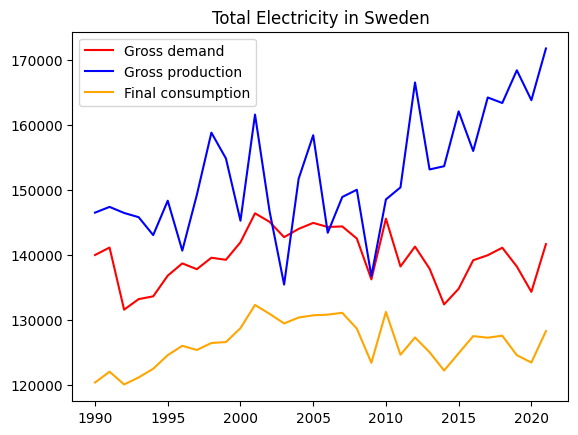

In [707]:
#Visualizing the data

x_Sweden = Sweden_df['Year']
y1_Sweden = Sweden_df['Gross demand']
y2_Sweden = Sweden_df['Gross production']
y3_Sweden = Sweden_df['Final consumption']

plt.plot(x_Sweden, y1_Sweden, color='red', label='Gross demand')
plt.plot(x_Sweden, y2_Sweden, color='blue', label='Gross production')
plt.plot(x_Sweden, y3_Sweden, color='orange', label='Final consumption')

plt.title('Total Electricity in Sweden')
plt.legend()
plt.show()

In [708]:
Sweden_demand_fig = px.line(Sweden_df, x='Year', y='Gross demand', title='Gross demand of electricity in Sweden')
Sweden_production_fig = px.line(Sweden_df, x='Year', y='Gross production', title='Gross production of electricity in Sweden')
Sweden_consumption_fig = px.line(Sweden_df, x='Year', y='Final consumption', title='Final consumption of electricity in Sweden')

Sweden_demand_fig.show()
Sweden_production_fig.show()
Sweden_consumption_fig.show()

In [709]:
# Switzerland dataframe

Switzerland_df = df.loc[df['Country'] == 'Switzerland']
Switzerland_max_year = Switzerland_df['Year'].max()
Switzerland_min_year = Switzerland_df['Year'].min()
Switzerland_df_Years = np.arange(Switzerland_min_year, Switzerland_max_year+1, 1)

print(Switzerland_df_Years.sum())
print(Switzerland_df['Year'].sum())
print(Switzerland_df_Years.sum() == Switzerland_df['Year'].sum())
print(Switzerland_df_Years)
print(np.array(Switzerland_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


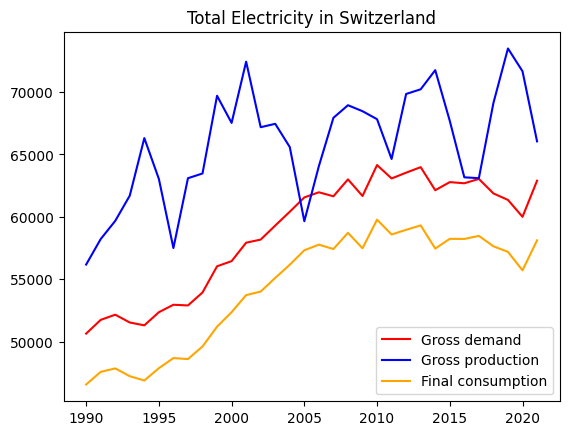

In [710]:
#Visualizing the data

x_Switzerland = Switzerland_df['Year']
y1_Switzerland = Switzerland_df['Gross demand']
y2_Switzerland = Switzerland_df['Gross production']
y3_Switzerland = Switzerland_df['Final consumption']

plt.plot(x_Switzerland, y1_Switzerland, color='red', label='Gross demand')
plt.plot(x_Switzerland, y2_Switzerland, color='blue', label='Gross production')
plt.plot(x_Switzerland, y3_Switzerland, color='orange', label='Final consumption')

plt.title('Total Electricity in Switzerland')
plt.legend()
plt.show()

In [711]:
Switzerland_demand_fig = px.line(Switzerland_df, x='Year', y='Gross demand', title='Gross demand of electricity in Switzerland')
Switzerland_production_fig = px.line(Switzerland_df, x='Year', y='Gross production', title='Gross production of electricity in Switzerland')
Switzerland_consumption_fig = px.line(Switzerland_df, x='Year', y='Final consumption', title='Final consumption of electricity in Switzerland')

Switzerland_demand_fig.show()
Switzerland_production_fig.show()
Switzerland_consumption_fig.show()

In [712]:
# Syrian Arab Republic dataframe

Syria_df = df.loc[df['Country'] == 'Syrian Arab Republic']
Syria_max_year = Syria_df['Year'].max()
Syria_min_year = Syria_df['Year'].min()
Syria_df_Years = np.arange(Syria_min_year, Syria_max_year+1, 1)

print(Syria_df_Years.sum())
print(Syria_df['Year'].sum())
print(Syria_df_Years.sum() == Syria_df['Year'].sum())
print(Syria_df_Years)
print(np.array(Syria_df['Year'].sort_values(ascending=True)))

58203
52215
False
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020
 2021]
[1993 1994 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009
 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 2021]


In [713]:
# Tajikistan dataframe

Tajikistan_df = df.loc[df['Country'] == 'Tajikistan']
Tajikistan_max_year = Tajikistan_df['Year'].max()
Tajikistan_min_year = Tajikistan_df['Year'].min()
Tajikistan_df_Years = np.arange(Tajikistan_min_year, Tajikistan_max_year+1, 1)

print(Tajikistan_df_Years.sum())
print(Tajikistan_df['Year'].sum())
print(Tajikistan_df_Years.sum() == Tajikistan_df['Year'].sum())
print(Tajikistan_df_Years)
print(np.array(Tajikistan_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


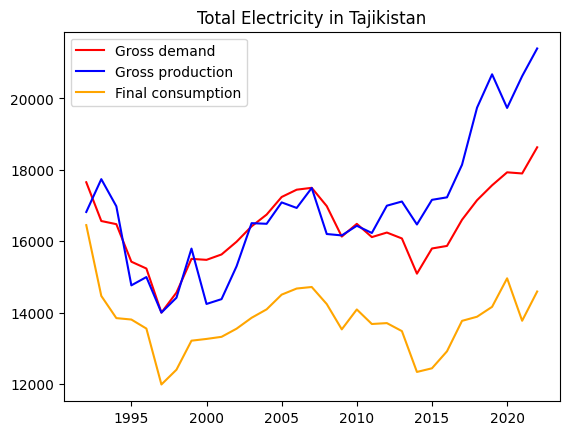

In [714]:
#Visualizing the data

x_Tajikistan = Tajikistan_df['Year']
y1_Tajikistan = Tajikistan_df['Gross demand']
y2_Tajikistan = Tajikistan_df['Gross production']
y3_Tajikistan = Tajikistan_df['Final consumption']

plt.plot(x_Tajikistan, y1_Tajikistan, color='red', label='Gross demand')
plt.plot(x_Tajikistan, y2_Tajikistan, color='blue', label='Gross production')
plt.plot(x_Tajikistan, y3_Tajikistan, color='orange', label='Final consumption')

plt.title('Total Electricity in Tajikistan')
plt.legend()
plt.show()

In [715]:
Tajikistan_demand_fig = px.line(Tajikistan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Tajikistan')
Tajikistan_production_fig = px.line(Tajikistan_df, x='Year', y='Gross production', title='Gross production of electricity in Tajikistan')
Tajikistan_consumption_fig = px.line(Tajikistan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Tajikistan')

Tajikistan_demand_fig.show()
Tajikistan_production_fig.show()
Tajikistan_consumption_fig.show()

In [716]:
# Thailand dataframe

Thailand_df = df.loc[df['Country'] == 'Thailand']
Thailand_max_year = Thailand_df['Year'].max()
Thailand_min_year = Thailand_df['Year'].min()
Thailand_df_Years = np.arange(Thailand_min_year, Thailand_max_year+1, 1)

print(Thailand_df_Years.sum())
print(Thailand_df['Year'].sum())
print(Thailand_df_Years.sum() == Thailand_df['Year'].sum())
print(Thailand_df_Years)
print(np.array(Thailand_df['Year'].sort_values(ascending=True)))

62217
60196
False
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2022]


In [717]:
# Togo dataframe

Togo_df = df.loc[df['Country'] == 'Togo']
Togo_max_year = Togo_df['Year'].max()
Togo_min_year = Togo_df['Year'].min()
Togo_df_Years = np.arange(Togo_min_year, Togo_max_year+1, 1)

print(Togo_df_Years.sum())
print(Togo_df['Year'].sum())
print(Togo_df_Years.sum() == Togo_df['Year'].sum())
print(Togo_df_Years)
print(np.array(Togo_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


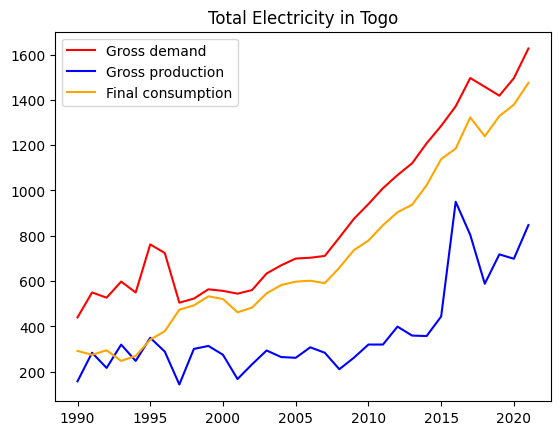

In [718]:
#Visualizing the data

x_Togo = Togo_df['Year']
y1_Togo = Togo_df['Gross demand']
y2_Togo = Togo_df['Gross production']
y3_Togo = Togo_df['Final consumption']

plt.plot(x_Togo, y1_Togo, color='red', label='Gross demand')
plt.plot(x_Togo, y2_Togo, color='blue', label='Gross production')
plt.plot(x_Togo, y3_Togo, color='orange', label='Final consumption')

plt.title('Total Electricity in Togo')
plt.legend()
plt.show()

In [719]:
Togo_demand_fig = px.line(Togo_df, x='Year', y='Gross demand', title='Gross demand of electricity in Togo')
Togo_production_fig = px.line(Togo_df, x='Year', y='Gross production', title='Gross production of electricity in Togo')
Togo_consumption_fig = px.line(Togo_df, x='Year', y='Final consumption', title='Final consumption of electricity in Togo')

Togo_demand_fig.show()
Togo_production_fig.show()
Togo_consumption_fig.show()

In [720]:
# Trinidad and Tobago dataframe

Trinidad_and_Tobago_df = df.loc[df['Country'] == 'Trinidad and Tobago']
Trinidad_and_Tobago_max_year = Trinidad_and_Tobago_df['Year'].max()
Trinidad_and_Tobago_min_year = Trinidad_and_Tobago_df['Year'].min()
Trinidad_and_Tobago_df_Years = np.arange(Trinidad_and_Tobago_min_year, Trinidad_and_Tobago_max_year+1, 1)

print(Trinidad_and_Tobago_df_Years.sum())
print(Trinidad_and_Tobago_df['Year'].sum())
print(Trinidad_and_Tobago_df_Years.sum() == Trinidad_and_Tobago_df['Year'].sum())
print(Trinidad_and_Tobago_df_Years)
print(np.array(Trinidad_and_Tobago_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


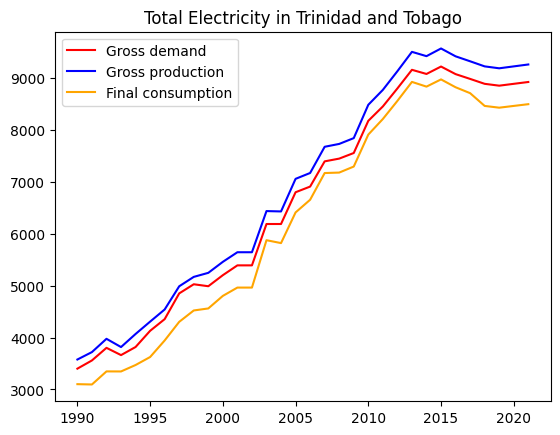

In [721]:
#Visualizing the data

x_Trinidad_and_Tobago = Trinidad_and_Tobago_df['Year']
y1_Trinidad_and_Tobago = Trinidad_and_Tobago_df['Gross demand']
y2_Trinidad_and_Tobago = Trinidad_and_Tobago_df['Gross production']
y3_Trinidad_and_Tobago = Trinidad_and_Tobago_df['Final consumption']

plt.plot(x_Trinidad_and_Tobago, y1_Trinidad_and_Tobago, color='red', label='Gross demand')
plt.plot(x_Trinidad_and_Tobago, y2_Trinidad_and_Tobago, color='blue', label='Gross production')
plt.plot(x_Trinidad_and_Tobago, y3_Trinidad_and_Tobago, color='orange', label='Final consumption')

plt.title('Total Electricity in Trinidad and Tobago')
plt.legend()
plt.show()

In [722]:
Trinidad_and_Tobago_demand_fig = px.line(Trinidad_and_Tobago_df, x='Year', y='Gross demand', title='Gross demand of electricity in Trinidad and Tobago')
Trinidad_and_Tobago_production_fig = px.line(Trinidad_and_Tobago_df, x='Year', y='Gross production', title='Gross production of electricity in Trinidad and Tobago')
Trinidad_and_Tobago_consumption_fig = px.line(Trinidad_and_Tobago_df, x='Year', y='Final consumption', title='Final consumption of electricity in Trinidad and Tobago')

Trinidad_and_Tobago_demand_fig.show()
Trinidad_and_Tobago_production_fig.show()
Trinidad_and_Tobago_consumption_fig.show()

In [723]:
# Tunisia dataframe

Tunisia_df = df.loc[df['Country'] == 'Tunisia']
Tunisia_max_year = Tunisia_df['Year'].max()
Tunisia_min_year = Tunisia_df['Year'].min()
Tunisia_df_Years = np.arange(Tunisia_min_year, Tunisia_max_year+1, 1)

print(Tunisia_df_Years.sum())
print(Tunisia_df['Year'].sum())
print(Tunisia_df_Years.sum() == Tunisia_df['Year'].sum())
print(Tunisia_df_Years)
print(np.array(Tunisia_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


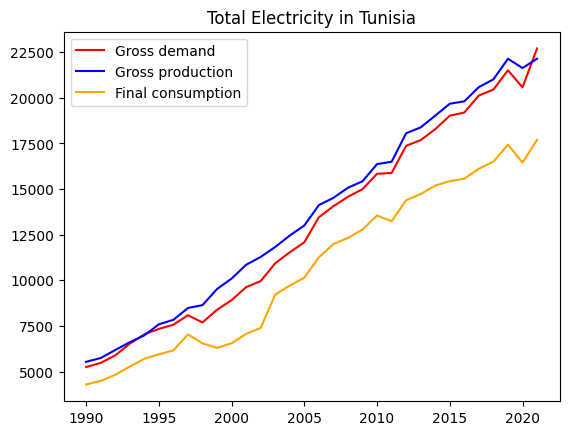

In [724]:
#Visualizing the data

x_Tunisia = Tunisia_df['Year']
y1_Tunisia = Tunisia_df['Gross demand']
y2_Tunisia = Tunisia_df['Gross production']
y3_Tunisia = Tunisia_df['Final consumption']

plt.plot(x_Tunisia, y1_Tunisia, color='red', label='Gross demand')
plt.plot(x_Tunisia, y2_Tunisia, color='blue', label='Gross production')
plt.plot(x_Tunisia, y3_Tunisia, color='orange', label='Final consumption')

plt.title('Total Electricity in Tunisia')
plt.legend()
plt.show()

In [725]:
Tunisia_demand_fig = px.line(Tunisia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Tunisia')
Tunisia_production_fig = px.line(Tunisia_df, x='Year', y='Gross production', title='Gross production of electricity in Tunisia')
Tunisia_consumption_fig = px.line(Tunisia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Tunisia')

Tunisia_demand_fig.show()
Tunisia_production_fig.show()
Tunisia_consumption_fig.show()

In [726]:
# Türkiye dataframe

Turkey_df = df.loc[df['Country'] == 'Türkiye']
Turkey_max_year = Turkey_df['Year'].max()
Turkey_min_year = Turkey_df['Year'].min()
Turkey_df_Years = np.arange(Turkey_min_year, Turkey_max_year+1, 1)

print(Turkey_df_Years.sum())
print(Turkey_df['Year'].sum())
print(Turkey_df_Years.sum() == Turkey_df['Year'].sum())
print(Turkey_df_Years)
print(np.array(Turkey_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


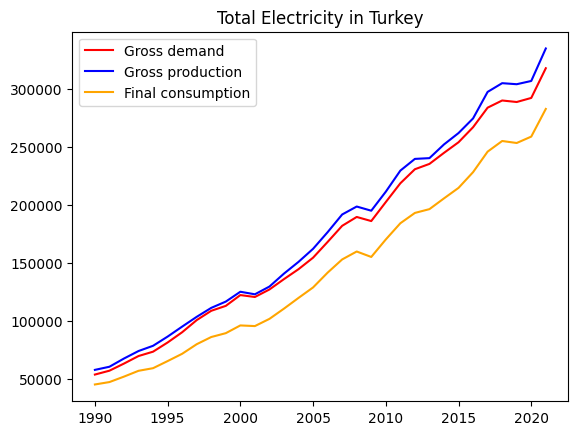

In [727]:
#Visualizing the data

x_Turkey = Turkey_df['Year']
y1_Turkey = Turkey_df['Gross demand']
y2_Turkey = Turkey_df['Gross production']
y3_Turkey = Turkey_df['Final consumption']

plt.plot(x_Turkey, y1_Turkey, color='red', label='Gross demand')
plt.plot(x_Turkey, y2_Turkey, color='blue', label='Gross production')
plt.plot(x_Turkey, y3_Turkey, color='orange', label='Final consumption')

plt.title('Total Electricity in Turkey')
plt.legend()
plt.show()

In [728]:
Turkey_demand_fig = px.line(Turkey_df, x='Year', y='Gross demand', title='Gross demand of electricity in Turkey')
Turkey_production_fig = px.line(Turkey_df, x='Year', y='Gross production', title='Gross production of electricity in Turkey')
Turkey_consumption_fig = px.line(Turkey_df, x='Year', y='Final consumption', title='Final consumption of electricity in Turkey')

Turkey_demand_fig.show()
Turkey_production_fig.show()
Turkey_consumption_fig.show()

In [729]:
# Turkmenistan dataframe

Turkmenistan_df = df.loc[df['Country'] == 'Turkmenistan']
Turkmenistan_max_year = Turkmenistan_df['Year'].max()
Turkmenistan_min_year = Turkmenistan_df['Year'].min()
Turkmenistan_df_Years = np.arange(Turkmenistan_min_year, Turkmenistan_max_year+1, 1)

print(Turkmenistan_df_Years.sum())
print(Turkmenistan_df['Year'].sum())
print(Turkmenistan_df_Years.sum() == Turkmenistan_df['Year'].sum())
print(Turkmenistan_df_Years)
print(np.array(Turkmenistan_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


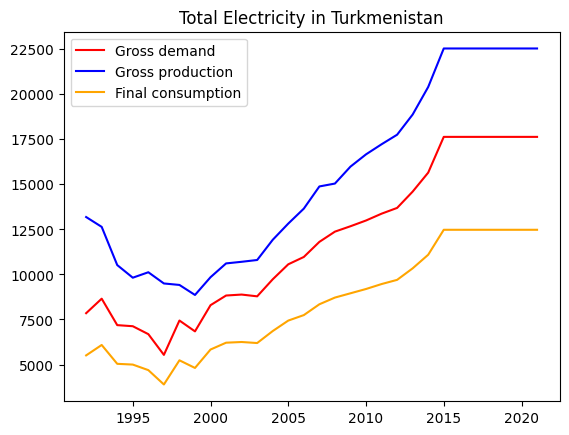

In [730]:
#Visualizing the data

x_Turkmenistan = Turkmenistan_df['Year']
y1_Turkmenistan = Turkmenistan_df['Gross demand']
y2_Turkmenistan = Turkmenistan_df['Gross production']
y3_Turkmenistan = Turkmenistan_df['Final consumption']

plt.plot(x_Turkmenistan, y1_Turkmenistan, color='red', label='Gross demand')
plt.plot(x_Turkmenistan, y2_Turkmenistan, color='blue', label='Gross production')
plt.plot(x_Turkmenistan, y3_Turkmenistan, color='orange', label='Final consumption')

plt.title('Total Electricity in Turkmenistan')
plt.legend()
plt.show()

In [731]:
Turkmenistan_demand_fig = px.line(Turkmenistan_df, x='Year', y='Gross demand', title='Gross demand of electricity in Turkmenistan')
Turkmenistan_production_fig = px.line(Turkmenistan_df, x='Year', y='Gross production', title='Gross production of electricity in Turkmenistan')
Turkmenistan_consumption_fig = px.line(Turkmenistan_df, x='Year', y='Final consumption', title='Final consumption of electricity in Turkmenistan')

Turkmenistan_demand_fig.show()
Turkmenistan_production_fig.show()
Turkmenistan_consumption_fig.show()

In [732]:
# Ukraine dataframe

Ukraine_df = df.loc[df['Country'] == 'Ukraine']
Ukraine_max_year = Ukraine_df['Year'].max()
Ukraine_min_year = Ukraine_df['Year'].min()
Ukraine_df_Years = np.arange(Ukraine_min_year, Ukraine_max_year+1, 1)

print(Ukraine_df_Years.sum())
print(Ukraine_df['Year'].sum())
print(Ukraine_df_Years.sum() == Ukraine_df['Year'].sum())
print(Ukraine_df_Years)
print(np.array(Ukraine_df['Year'].sort_values(ascending=True)))

60195
60195
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


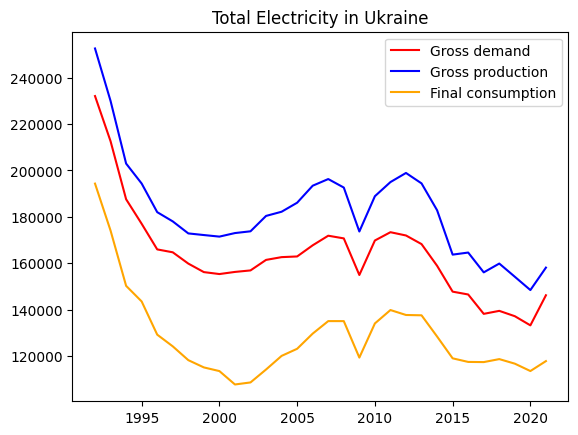

In [733]:
#Visualizing the data

x_Ukraine = Ukraine_df['Year']
y1_Ukraine = Ukraine_df['Gross demand']
y2_Ukraine = Ukraine_df['Gross production']
y3_Ukraine = Ukraine_df['Final consumption']

plt.plot(x_Ukraine, y1_Ukraine, color='red', label='Gross demand')
plt.plot(x_Ukraine, y2_Ukraine, color='blue', label='Gross production')
plt.plot(x_Ukraine, y3_Ukraine, color='orange', label='Final consumption')

plt.title('Total Electricity in Ukraine')
plt.legend()
plt.show()

In [734]:
Ukraine_demand_fig = px.line(Ukraine_df, x='Year', y='Gross demand', title='Gross demand of electricity in Ukraine')
Ukraine_production_fig = px.line(Ukraine_df, x='Year', y='Gross production', title='Gross production of electricity in Ukraine')
Ukraine_consumption_fig = px.line(Ukraine_df, x='Year', y='Final consumption', title='Final consumption of electricity in Ukraine')

Ukraine_demand_fig.show()
Ukraine_production_fig.show()
Ukraine_consumption_fig.show()

In [735]:
# United Kingdom dataframe

Uk_df = df.loc[df['Country'] == 'United Kingdom']
UK_max_year = Uk_df['Year'].max()
UK_min_year = Uk_df['Year'].min()
Uk_df_Years = np.arange(UK_min_year, UK_max_year+1, 1)

print(Uk_df_Years.sum())
print(Uk_df['Year'].sum())
print(Uk_df_Years.sum() == Uk_df['Year'].sum())
print(Uk_df_Years)
print(np.array(Uk_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


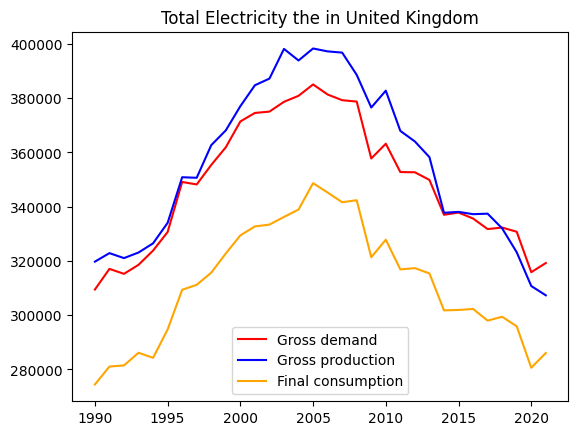

In [736]:
#Visualizing the data

x_UK = Uk_df['Year']
y1_UK = Uk_df['Gross demand']
y2_UK = Uk_df['Gross production']
y3_UK = Uk_df['Final consumption']

plt.plot(x_UK, y1_UK, color='red', label='Gross demand')
plt.plot(x_UK, y2_UK, color='blue', label='Gross production')
plt.plot(x_UK, y3_UK, color='orange', label='Final consumption')

plt.title('Total Electricity the in United Kingdom')
plt.legend()
plt.show()

In [737]:
UK_demand_fig = px.line(Uk_df, x='Year', y='Gross demand', title='Gross demand of electricity in the United Kingdom')
UK_production_fig = px.line(Uk_df, x='Year', y='Gross production', title='Gross production of electricity in the United Kingdom')
UK_consumption_fig = px.line(Uk_df, x='Year', y='Final consumption', title='Final consumption of electricity in the United Kingdom')

UK_demand_fig.show()
UK_production_fig.show()
UK_consumption_fig.show()

In [738]:
# United Rep. of Tanzania dataframe

Tanzania_df = df.loc[df['Country'] == 'United Rep. of Tanzania']
Tanzania_max_year = Tanzania_df['Year'].max()
Tanzania_min_year = Tanzania_df['Year'].min()
Tanzania_df_Years = np.arange(Tanzania_min_year, Tanzania_max_year+1, 1)

print(Tanzania_df_Years.sum())
print(Tanzania_df['Year'].sum())
print(Tanzania_df_Years.sum() == Tanzania_df['Year'].sum())
print(Tanzania_df_Years)
print(np.array(Tanzania_df['Year'].sort_values(ascending=True)))

64176
60185
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]


In [739]:
# United States dataframe

Usa_df = df.loc[df['Country'] == 'United States']
USA_max_year = Usa_df['Year'].max()
USA_min_year = Usa_df['Year'].min()
Usa_df_Years = np.arange(USA_min_year, USA_max_year+1, 1)

print(Usa_df_Years.sum())
print(Usa_df['Year'].sum())
print(Usa_df_Years.sum() == Usa_df['Year'].sum())
print(Usa_df_Years)
print(np.array(Usa_df['Year'].sort_values(ascending=True)))

64176
64176
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]


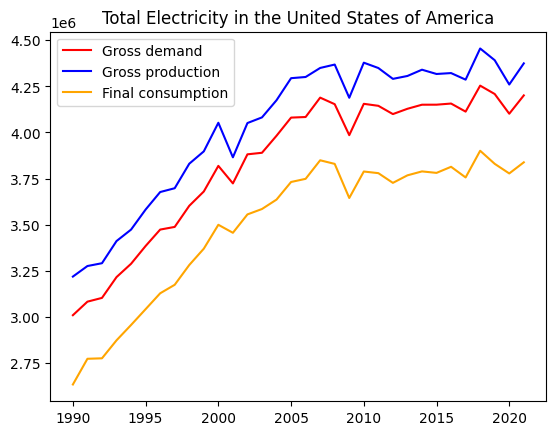

In [740]:
#Visualizing the data

x_USA = Usa_df['Year']
y1_USA = Usa_df['Gross demand']
y2_USA = Usa_df['Gross production']
y3_USA = Usa_df['Final consumption']

plt.plot(x_USA, y1_USA, color='red', label='Gross demand')
plt.plot(x_USA, y2_USA, color='blue', label='Gross production')
plt.plot(x_USA, y3_USA, color='orange', label='Final consumption')

plt.title('Total Electricity in the United States of America')
plt.legend()
plt.show()

In [741]:
USA_demand_fig = px.line(Usa_df, x='Year', y='Gross demand', title='Gross demand of electricity in the United States of America')
USA_production_fig = px.line(Usa_df, x='Year', y='Gross production', title='Gross production of electricity in the United States of America')
USA_consumption_fig = px.line(Usa_df, x='Year', y='Final consumption', title='Final consumption of electricity in the United States of America')

USA_demand_fig.show()
USA_production_fig.show()
USA_consumption_fig.show()

In [742]:
# Uruguay dataframe

Uruguay_df = df.loc[df['Country'] == 'Uruguay']
Uruguay_max_year = Uruguay_df['Year'].max()
Uruguay_min_year = Uruguay_df['Year'].min()
Uruguay_df_Years = np.arange(Uruguay_min_year, Uruguay_max_year+1, 1)

print(Uruguay_df_Years.sum())
print(Uruguay_df['Year'].sum())
print(Uruguay_df_Years.sum() == Uruguay_df['Year'].sum())
print(Uruguay_df_Years)
print(np.array(Uruguay_df['Year'].sort_values(ascending=True)))

66198
66198
True
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021 2022]


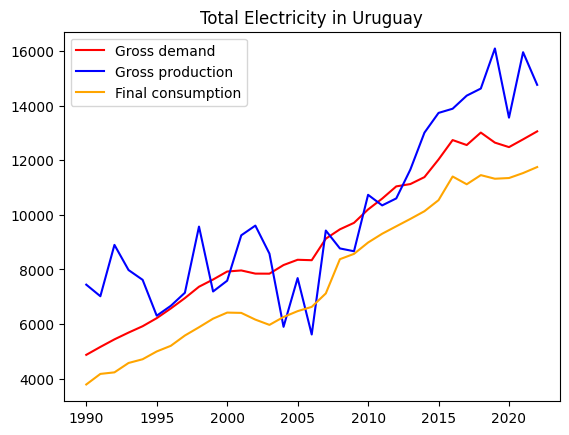

In [743]:
#Visualizing the data

x_Uruguay = Uruguay_df['Year']
y1_Uruguay = Uruguay_df['Gross demand']
y2_Uruguay = Uruguay_df['Gross production']
y3_Uruguay = Uruguay_df['Final consumption']

plt.plot(x_Uruguay, y1_Uruguay, color='red', label='Gross demand')
plt.plot(x_Uruguay, y2_Uruguay, color='blue', label='Gross production')
plt.plot(x_Uruguay, y3_Uruguay, color='orange', label='Final consumption')

plt.title('Total Electricity in Uruguay')
plt.legend()
plt.show()

In [744]:
Uruguay_demand_fig = px.line(Uruguay_df, x='Year', y='Gross demand', title='Gross demand of electricity in Uruguay')
Uruguay_production_fig = px.line(Uruguay_df, x='Year', y='Gross production', title='Gross production of electricity in Uruguay')
Uruguay_consumption_fig = px.line(Uruguay_df, x='Year', y='Final consumption', title='Final consumption of electricity in Uruguay')

Uruguay_demand_fig.show()
Uruguay_production_fig.show()
Uruguay_consumption_fig.show()

In [745]:
# Uzbekistan dataframe

Uzbekistan_df = df.loc[df['Country'] == 'Uzbekistan']
Uzbekistan_max_year = Uzbekistan_df['Year'].max()
Uzbekistan_min_year = Uzbekistan_df['Year'].min()
Uzbekistan_df_Years = np.arange(Uzbekistan_min_year, Uzbekistan_max_year+1, 1)

print(Uzbekistan_df_Years.sum())
print(Uzbekistan_df['Year'].sum())
print(Uzbekistan_df_Years.sum() == Uzbekistan_df['Year'].sum())
print(Uzbekistan_df_Years)
print(np.array(Uzbekistan_df['Year'].sort_values(ascending=True)))

60195
50120
False
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2018 2019 2020 2021]


In [746]:
# Venezuela dataframe

Venezuela_df = df.loc[df['Country'] == 'Venezuela (Bolivar. Rep.)']
Venezuela_max_year = Venezuela_df['Year'].max()
Venezuela_min_year = Venezuela_df['Year'].min()
Venezuela_df_Years = np.arange(Venezuela_min_year, Venezuela_max_year+1, 1)

print(Venezuela_df_Years.sum())
print(Venezuela_df['Year'].sum())
print(Venezuela_df_Years.sum() == Venezuela_df['Year'].sum())
print(Venezuela_df_Years)
print(np.array(Venezuela_df['Year'].sort_values(ascending=True)))

62217
62217
True
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]
[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022]


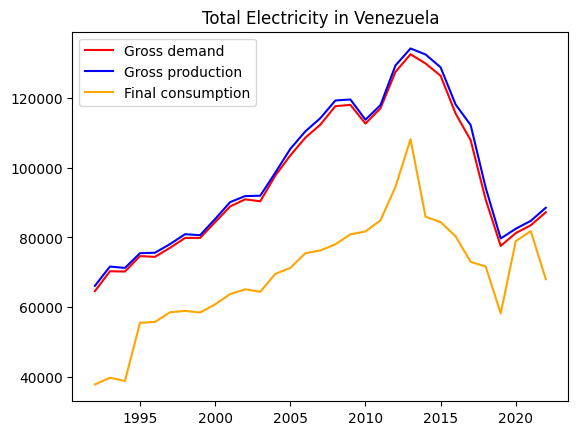

In [747]:
#Visualizing the data

x_Venezuela = Venezuela_df['Year']
y1_Venezuela = Venezuela_df['Gross demand']
y2_Venezuela = Venezuela_df['Gross production']
y3_Venezuela = Venezuela_df['Final consumption']

plt.plot(x_Venezuela, y1_Venezuela, color='red', label='Gross demand')
plt.plot(x_Venezuela, y2_Venezuela, color='blue', label='Gross production')
plt.plot(x_Venezuela, y3_Venezuela, color='orange', label='Final consumption')

plt.title('Total Electricity in Venezuela')
plt.legend()
plt.show()

In [748]:
Venezuela_demand_fig = px.line(Venezuela_df, x='Year', y='Gross demand', title='Gross demand of electricity in Venezuela')
Venezuela_production_fig = px.line(Venezuela_df, x='Year', y='Gross production', title='Gross production of electricity in Venezuela')
Venezuela_consumption_fig = px.line(Venezuela_df, x='Year', y='Final consumption', title='Final consumption of electricity in Venezuela')

Venezuela_demand_fig.show()
Venezuela_production_fig.show()
Venezuela_consumption_fig.show()

In [749]:
# Vietnam dataframe

Vientnam_df = df.loc[df['Country'] == 'Viet Nam']
Vientnam_max_year = Vientnam_df['Year'].max()
Vientnam_min_year = Vientnam_df['Year'].min()
Vientnam_df_Years = np.arange(Vientnam_min_year, Vientnam_max_year+1, 1)

print(Vientnam_df_Years.sum())
print(Vientnam_df['Year'].sum())
print(Vientnam_df_Years.sum() == Vientnam_df['Year'].sum())
print(Vientnam_df_Years)
print(np.array(Vientnam_df['Year'].sort_values(ascending=True)))

64176
62157
False
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2019 2020 2021]
[1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017
 2018 2020 2021]


In [750]:
# Yemen dataframe

Yemen_df = df.loc[df['Country'] == 'Yemen']
Yemen_max_year = Yemen_df['Year'].max()
Yemen_min_year = Yemen_df['Year'].min()
Yemen_df_Years = np.arange(Yemen_min_year, Yemen_max_year+1, 1)

print(Yemen_df_Years.sum())
print(Yemen_df['Year'].sum())
print(Yemen_df_Years.sum() == Yemen_df['Year'].sum())
print(Yemen_df_Years)
print(np.array(Yemen_df['Year'].sort_values(ascending=True)))

62186
62186
True
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]
[1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020 2021]


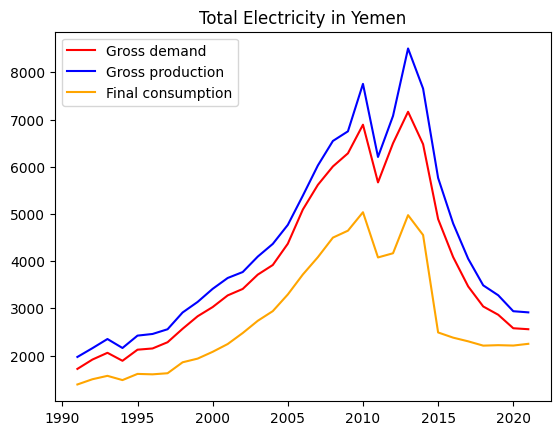

In [751]:
#Visualizing the data

x_Yemen = Yemen_df['Year']
y1_Yemen = Yemen_df['Gross demand']
y2_Yemen = Yemen_df['Gross production']
y3_Yemen = Yemen_df['Final consumption']

plt.plot(x_Yemen, y1_Yemen, color='red', label='Gross demand')
plt.plot(x_Yemen, y2_Yemen, color='blue', label='Gross production')
plt.plot(x_Yemen, y3_Yemen, color='orange', label='Final consumption')

plt.title('Total Electricity in Yemen')
plt.legend()
plt.show()

In [752]:
Yemen_demand_fig = px.line(Yemen_df, x='Year', y='Gross demand', title='Gross demand of electricity in Yemen')
Yemen_production_fig = px.line(Yemen_df, x='Year', y='Gross production', title='Gross production of electricity in Yemen')
Yemen_consumption_fig = px.line(Yemen_df, x='Year', y='Final consumption', title='Final consumption of electricity in Yemen')

Yemen_demand_fig.show()
Yemen_production_fig.show()
Yemen_consumption_fig.show()

In [753]:
# Zambia dataframe

Zambia_df = df.loc[df['Country'] == 'Zambia']
Zambia_max_year = Zambia_df['Year'].max()
Zambia_min_year = Zambia_df['Year'].min()
Zambia_df_Years = np.arange(Zambia_min_year, Zambia_max_year+1, 1)

print(Zambia_df_Years.sum())
print(Zambia_df['Year'].sum())
print(Zambia_df_Years.sum() == Zambia_df['Year'].sum())
print(Zambia_df_Years)
print(np.array(Zambia_df['Year'].sort_values(ascending=True)))

46092
46092
True
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015]
[1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006
 2007 2008 2009 2010 2011 2012 2013 2014 2015]


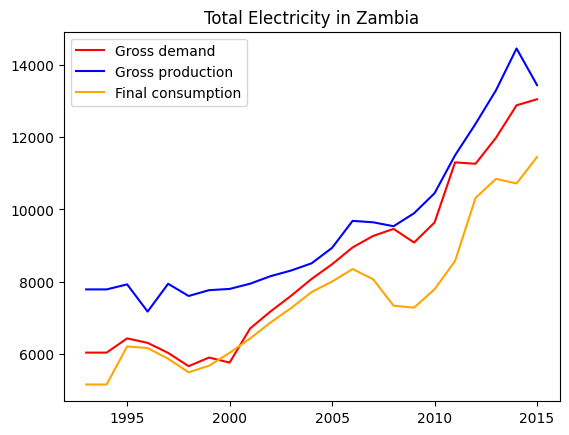

In [754]:
#Visualizing the data

x_Zambia = Zambia_df['Year']
y1_Zambia = Zambia_df['Gross demand']
y2_Zambia = Zambia_df['Gross production']
y3_Zambia = Zambia_df['Final consumption']

plt.plot(x_Zambia, y1_Zambia, color='red', label='Gross demand')
plt.plot(x_Zambia, y2_Zambia, color='blue', label='Gross production')
plt.plot(x_Zambia, y3_Zambia, color='orange', label='Final consumption')

plt.title('Total Electricity in Zambia')
plt.legend()
plt.show()

In [768]:
Zambia_demand_fig = px.line(Zambia_df, x='Year', y='Gross demand', title='Gross demand of electricity in Zambia')
Zambia_production_fig = px.line(Zambia_df, x='Year', y='Gross production', title='Gross production of electricity in Zambia')
Zambia_consumption_fig = px.line(Zambia_df, x='Year', y='Final consumption', title='Final consumption of electricity in Zambia')

Zambia_demand_fig.show()
Zambia_production_fig.show()
Zambia_consumption_fig.show()

In [756]:
complete = [ Angola_df, Argentina_df, Armenia_df, Australia_df, Austria_df, Azerbaijan_df, Bahrain_df, Barbados_df,
            Belarus_df, Belgium_df,Benin_df, Bolivia_df, Bosnia_and_Herzegovina_df, Brunei_Darussalam_df,
             Cameroon_df, Canada_df, Cayman_Islands_df, Chile_df, China_df, China_HongKong_SAR_df, China_Macao_SAR_df,
             Colombia_df, Congo_df, Costa_Rica_df, Ivory_Coast_df, Croatia_df, Cuba_df, Cyprus_df, Czechia_df, Denmark_df,
             Dominican_Republic_df, Ecuador_df, Egypt_df, Eritrea_df, Estonia_df, Ethiopia_df, Finland_df, France_df, Gabon_df,
             Georgia_df, Germany_df, Gibraltar_df, Greece_df, Grenada_df, Haiti_df, Honduras_df, Hungary_df, Iceland_df, Indonesia_df,
             Iran_df, Ireland_df, Israel_df, Italy_df, Jamaica_df, Japan_df, Jersey_df, Jordan_df, Kazakhstan_df, Kenya_df,
             Kiribati_df, North_Korea_df, South_Korea_df, Kosovo_df, Kuwait_df, Kyrgyzstan_df, Laos_df, Latvia_df, Libya_df, 
             Lithuania_df, Luxembourg_df, Malta_df, Mexico_df, Morocco_df, Myanmar_df, Nepal_df, Netherlands_df, New_Caledonia_df,
             New_Zealand_df, Nigeria_df, North_Macedonia_df, Norway_df, Oman_df, Paraguay_df, Peru_df, Philippines_df, Poland_df,
             Portugal_df, Puerto_Rico_df, Qatar_df, Moldova_df, Romania_df, Russia_df, Saudi_Arabia_df, Singapore_df, Slovakia_df, Slovenia_df,
             South_Africa_df, Spain_df, St_Helena_df, St_VincentGrenadines_df, Palestine_df, Sweden_df, Switzerland_df, Tajikistan_df, 
             Togo_df, Trinidad_and_Tobago_df, Tunisia_df, Turkey_df, Turkmenistan_df, Ukraine_df, Uk_df, Usa_df, Uruguay_df, Venezuela_df,
           Yemen_df, Zambia_df ]

for completed in complete:
    final_df = pd.concat(complete, ignore_index=True)

In [757]:
final_df.head()

,Country,Year,Gross demand,Gross production,Final consumption
0,Angola,2017,10922.375,11187.375,9715.375
1,Angola,2016,10105.000,10379.000,8938.000
2,Angola,2015,9524.000,9783.000,8424.000
3,Angola,2014,9246.000,9497.000,8178.000
4,Angola,2013,8013.000,8231.000,7087.000


In [762]:
final_df.to_csv('final_electricity.csv', index=False)

In [763]:
some_df = pd.read_csv('final_electricity.csv')
some_df.head()

,Country,Year,Gross demand,Gross production,Final consumption
0,Angola,2017,10922.375,11187.375,9715.375
1,Angola,2016,10105.000,10379.000,8938.000
2,Angola,2015,9524.000,9783.000,8424.000
3,Angola,2014,9246.000,9497.000,8178.000
4,Angola,2013,8013.000,8231.000,7087.000
